<h1> Brazilian E-Commerce Public Dataset by Olist</h1>

# Exploratory Data Analysis

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")



import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

# [1]. Reading Data

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# Merge all the DataSet 
- olist_customers_dataset.csv 
- olist_geolocation_dataset.csv
- olist_order_items_dataset.csv
- olist_order_payments_dataset.csv
- olist_order_reviews_dataset.csv
- olist_orders_dataset.csv
- olist_products_dataset.csv
- olist_sellers_dataset.csv
- product_category_name_translation.csv

## Reading olist_customers_dataset.csv

In [2]:
olist_customer_data = pd.read_csv('olist_customers_dataset.csv')

In [3]:
print("Number of data points ", olist_customer_data.shape)
print('-'*50)
print("The attributes of data :", olist_customer_data.columns.values)

Number of data points  (99441, 5)
--------------------------------------------------
The attributes of data : ['customer_id' 'customer_unique_id' 'customer_zip_code_prefix'
 'customer_city' 'customer_state']


In [4]:
# Checking for NAN Value in a data frame 
olist_customer_data.isnull().values.any()

False

In [5]:
olist_customer_data.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [6]:
olist_customer_data.isnull().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [7]:
# Checking for Duplicate customer id 
olist_customer_data[olist_customer_data.duplicated(['customer_id'], keep=False)]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state


## Reading olist_orders_dataset.csv

In [11]:
olist_orders_data = pd.read_csv('olist_orders_dataset.csv')

In [12]:
print("Number of data points ", olist_orders_data.shape)
print('-'*50)
print("The attributes of data :", olist_orders_data.columns.values)

Number of data points  (99441, 8)
--------------------------------------------------
The attributes of data : ['order_id' 'customer_id' 'order_status' 'order_purchase_timestamp'
 'order_approved_at' 'order_delivered_carrier_date'
 'order_delivered_customer_date' 'order_estimated_delivery_date']


In [13]:
# Checking for NAN Value in a data frame 
olist_orders_data.isnull().values.any()

True

In [14]:
olist_orders_data.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [15]:
#Removing all the rows where tcolumn is NAN
olist_orders_data =  olist_orders_data.dropna(axis='index',subset=['order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date'])

In [16]:
# Checking for Duplicate Order id 
olist_orders_data[olist_orders_data.duplicated(['order_id'], keep=False)]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date


In [17]:
sorted_olist_order_data=olist_orders_data.sort_values('order_id', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')
final_olist_order__data=sorted_olist_order_data.drop_duplicates(subset={"order_id"}, keep='first', inplace=False)
final_olist_order__data.shape

(96461, 8)

In [18]:
# Merging olist_order_customer_item_data  dataset and olist_order_item_dataset 
olist_customer_order_data = pd.merge(final_olist_order__data, olist_customer_data, on='customer_id', how='left')
print(olist_customer_order_data.columns)
print(olist_customer_order_data.shape)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state'],
      dtype='object')
(96461, 12)


In [19]:
# Checking for NAN Value in a data frame 
olist_customer_order_data.isnull().values.any()

False

## Reading olist_order_items_dataset.csv

In [21]:
# Reading olist_order_items_dataset 
olist_order_item_data = pd.read_csv('olist_order_items_dataset.csv')
print(olist_order_item_data.columns)
print(olist_order_item_data.shape)

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value'],
      dtype='object')
(112650, 7)


In [22]:
# Checking for Any NAN Value are present or not
olist_order_item_data.isnull().values.any()

False

In [23]:
# Checking for Duplicate Order id 
olist_order_item_data[olist_order_item_data.duplicated(['order_id'], keep=False)]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
13,0008288aa423d2a3f00fcb17cd7d8719,1,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37
14,0008288aa423d2a3f00fcb17cd7d8719,2,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37
32,00143d0f86d6fbd9f9b38ab440ac16f5,1,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10
33,00143d0f86d6fbd9f9b38ab440ac16f5,2,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10
34,00143d0f86d6fbd9f9b38ab440ac16f5,3,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10
...,...,...,...,...,...,...,...
112635,fff8287bbae429a99bb7e8c21d151c41,2,bee2e070c39f3dd2f6883a17a5f0da45,4e922959ae960d389249c378d1c939f5,2018-03-27 12:29:22,180.00,48.14
112640,fffb9224b6fc7c43ebb0904318b10b5f,1,43423cdffde7fda63d0414ed38c11a73,b1fc4f64df5a0e8b6913ab38803c57a9,2017-11-03 02:55:58,55.00,34.19
112641,fffb9224b6fc7c43ebb0904318b10b5f,2,43423cdffde7fda63d0414ed38c11a73,b1fc4f64df5a0e8b6913ab38803c57a9,2017-11-03 02:55:58,55.00,34.19
112642,fffb9224b6fc7c43ebb0904318b10b5f,3,43423cdffde7fda63d0414ed38c11a73,b1fc4f64df5a0e8b6913ab38803c57a9,2017-11-03 02:55:58,55.00,34.19


In [24]:
olist_order_item_data[olist_order_item_data['order_id'] == '0008288aa423d2a3f00fcb17cd7d8719']

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
13,0008288aa423d2a3f00fcb17cd7d8719,1,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.9,13.37
14,0008288aa423d2a3f00fcb17cd7d8719,2,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.9,13.37


In [25]:
sorted_olist_order_item_data=olist_order_item_data.sort_values('order_id', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [26]:
final_olist_order_item_data=sorted_olist_order_item_data.drop_duplicates(subset={"order_id"}, keep='first', inplace=False)
final_olist_order_item_data.shape

(98666, 7)

In [27]:
# Merging olist_order_customer_item_data  dataset and olist_order_item_dataset 
olist_customer_order_item_data = pd.merge(olist_customer_order_data, final_olist_order_item_data, on='order_id', how='left')
print(olist_customer_order_item_data.columns)
print(olist_customer_order_item_data.shape)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value'],
      dtype='object')
(96461, 18)


In [28]:
# Checking for NAN Value in a data frame 
olist_customer_order_item_data.isnull().values.any()

False

## Reading olist_order_payments_dataset.csv

In [33]:
# Reading olist_order_items_dataset 
olist_order_payment_data = pd.read_csv('olist_order_payments_dataset.csv')
print(olist_order_payment_data.columns)
print(olist_order_payment_data.shape)

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value'],
      dtype='object')
(103886, 5)


In [34]:
# Checking for Any NAN Value are present or not
olist_order_payment_data.isnull().values.any()

False

In [35]:
# Checking for Duplicate Order id 
olist_order_payment_data[olist_order_payment_data.duplicated(['order_id'], keep='first')]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
1456,683bf306149bb869980b68d48a1bd6ab,1,credit_card,1,8.58
2324,e6a66a8350bb88497954d37688ab123e,2,voucher,1,10.51
2393,8e5148bee82a7e42c5f9ba76161dc51a,1,credit_card,1,0.67
2414,816ccd9d21435796e8ffa9802b2a782f,1,credit_card,1,5.65
2497,2cbcb371aee438c59b722a21d83597e0,2,voucher,1,7.80
...,...,...,...,...,...
103778,fd86c80924b4be8fb7f58c4ecc680dae,1,credit_card,1,76.10
103817,6d4616de4341417e17978fe57aec1c46,1,credit_card,1,19.18
103860,31bc09fdbd701a7a4f9b55b5955b8687,6,voucher,1,77.99
103869,c9b01bef18eb84888f0fd071b8413b38,1,credit_card,6,238.16


In [36]:
olist_order_payment_data[olist_order_payment_data['order_id'] == '683bf306149bb869980b68d48a1bd6ab']

,order_id,payment_sequential,payment_type,payment_installments,payment_value
385,683bf306149bb869980b68d48a1bd6ab,2,voucher,1,30.00
1456,683bf306149bb869980b68d48a1bd6ab,1,credit_card,1,8.58


- As order id is Duplicate but Payment Info is differenent, so need to delete the Order id duplicate Values

In [37]:
# Merging olist_order_customer_item_data  dataset and olist_order_item_dataset 
olist_customer_order_item_pay_data = pd.merge(olist_customer_order_item_data, olist_order_payment_data, on='order_id', how='left')
print(olist_customer_order_item_pay_data.columns)
print(olist_customer_order_item_pay_data.shape)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value'],
      dtype='object')
(100740, 22)


In [38]:
# Checking for NAN Value in a data frame 
olist_customer_order_item_pay_data.isnull().values.any()

True

In [39]:
olist_customer_order_item_pay_data.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               1
payment_type                     1
payment_installments             1
payment_value                    1
dtype: int64

In [40]:
#Removing all the rows where tcolumn is NAN
olist_customer_order_item_pay_data =  olist_customer_order_item_pay_data.dropna(axis='index',subset=['payment_sequential', 'payment_type','payment_installments','payment_value'])

In [41]:
# Checking for NAN Value in a data frame 
olist_customer_order_item_pay_data.isnull().values.any()

False

## Reading olist_order_reviews_dataset.csv

In [47]:
# Reading olist_order_items_dataset 
olist_order_review_data = pd.read_csv('olist_order_reviews_dataset.csv')
print(olist_order_review_data.columns)
print(olist_order_review_data.shape)

Index(['review_id', 'order_id', 'review_score', 'review_comment_title',
       'review_comment_message', 'review_creation_date',
       'review_answer_timestamp'],
      dtype='object')
(100000, 7)


In [48]:
# Checking for Any NAN Value are present or not
olist_order_review_data.isnull().values.any()

True

In [49]:
olist_order_review_data.isnull().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       88285
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [50]:
#Removing all the rows where tcolumn is NAN
olist_order_review_data =  olist_order_review_data.dropna(axis='index',subset=['review_comment_title', 'review_comment_message'])

In [51]:
olist_order_review_data.isnull().sum()

review_id                  0
order_id                   0
review_score               0
review_comment_title       0
review_comment_message     0
review_creation_date       0
review_answer_timestamp    0
dtype: int64

In [52]:
# Checking for Duplicate Order id 
olist_order_review_data[olist_order_review_data.duplicated(['order_id'], keep=False)]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1612,b06f6882b1c0bc82ddf057b58b86fe50,2daee070f2042c8b7a8e9fdde778a31a,5,Muito bom,"Ótimo, excelente produto recomendo a todos",2018-07-12 00:00:00,2018-07-13 10:49:12
9602,471a7d853b152d77aefd43bc39f03d64,84aa61a900410cfe26b57337d376a1ae,5,Ótima,Recomendo!,2018-08-22 00:00:00,2018-08-22 22:41:31
10999,64180c2c7916ed488bcb592f0f4b4921,7144ca093cbdecfdfc3e76d49da6ffb9,2,Sem recomendação,Está faltando receber um produto: Pulseira Mas...,2018-05-23 00:00:00,2018-05-24 10:50:11
26985,95f6d3d435a8eb7e148a1d0c4709c036,b0ee8cb0ccd868a2b5fd4b0f66bea08a,5,Entregou com bastante ant,"Rapidez na entrega , é um produto de ótima qua...",2018-04-26 00:00:00,2018-05-09 01:25:32
27632,032cecbea638b588b8a6fd5be4fddf8c,c1deab56eafcb4bec7703bbe7bd25137,2,produto horrivel,produto fora da minha expectativa,2018-07-26 00:00:00,2018-07-29 10:51:09
29644,650f8208894144b97f95986628a224bf,27dc874d0fc1a19c74ec77ca706be968,5,super recomendo,chegou bem antes do prazo,2018-07-05 00:00:00,2018-07-09 20:49:51
36290,b06f6882b1c0bc82ddf057b58b86fe50,1536003b9af6a526e0d02b8cd13fd2af,5,Muito bom,"Ótimo, excelente produto recomendo a todos",2018-07-12 00:00:00,2018-07-13 10:49:12
42270,64180c2c7916ed488bcb592f0f4b4921,c7e1e46af92704b1c2e1924de96e7479,2,Sem recomendação,Está faltando receber um produto: Pulseira Mas...,2018-05-23 00:00:00,2018-05-24 10:50:11
42987,1c481b7cc2949a1d699337f1bed766b0,84aa61a900410cfe26b57337d376a1ae,5,Ótima,Recomendo!,2018-08-22 00:00:00,2018-08-22 20:50:20
54555,74090c1156e2919231690c770e7cd572,715b8576b74d53796bcbb107a201eb55,5,super recomendo,"Produto lindo,adorei!!",2018-08-01 00:00:00,2018-08-01 22:23:30


In [53]:
olist_order_review_data[olist_order_review_data['review_id'] == 'b06f6882b1c0bc82ddf057b58b86fe50']

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1612,b06f6882b1c0bc82ddf057b58b86fe50,2daee070f2042c8b7a8e9fdde778a31a,5,Muito bom,"Ótimo, excelente produto recomendo a todos",2018-07-12 00:00:00,2018-07-13 10:49:12
36290,b06f6882b1c0bc82ddf057b58b86fe50,1536003b9af6a526e0d02b8cd13fd2af,5,Muito bom,"Ótimo, excelente produto recomendo a todos",2018-07-12 00:00:00,2018-07-13 10:49:12


In [54]:
sorted_olist_order_review_data=olist_order_review_data.sort_values('review_id', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')
final_olist_order_review_data=sorted_olist_order_review_data.drop_duplicates(subset={"review_id"}, keep='first', inplace=False)
final_olist_order_review_data.shape

(9944, 7)

In [55]:
# Merging olist_order_customer_item_data  dataset and olist_order_item_dataset 
olist_customer_order_item_pay_review_data = pd.merge(olist_customer_order_item_pay_data, final_olist_order_review_data, on='order_id', how='left')
print(olist_customer_order_item_pay_review_data.columns)
print(olist_customer_order_item_pay_review_data.shape)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp'],
      dtype='object')
(100746, 28)


In [56]:
# Checking for NAN Value in a data frame 
olist_customer_order_item_pay_review_data.isnull().values.any()

True

In [57]:
olist_customer_order_item_pay_review_data.isnull().sum()

order_id                             0
customer_id                          0
order_status                         0
order_purchase_timestamp             0
order_approved_at                    0
order_delivered_carrier_date         0
order_delivered_customer_date        0
order_estimated_delivery_date        0
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state                       0
order_item_id                        0
product_id                           0
seller_id                            0
shipping_limit_date                  0
price                                0
freight_value                        0
payment_sequential                   0
payment_type                         0
payment_installments                 0
payment_value                        0
review_id                        90773
review_score                     90773
review_comment_title             90773
review_comment_message   

In [58]:
#Removing all the rows where tcolumn is NAN
olist_customer_order_item_pay_review_data =  olist_customer_order_item_pay_review_data.dropna(axis='index',subset=['review_id', 'review_score','review_comment_title','review_comment_message' ,'review_creation_date','review_answer_timestamp' ])

In [59]:
# Checking for NAN Value in a data frame 
olist_customer_order_item_pay_review_data.isnull().values.any()

False

# Reading olist_products_dataset.csv 

In [66]:
# Reading olist_order_items_dataset 
olist_product_data = pd.read_csv('olist_products_dataset.csv')
print(olist_product_data.columns)
print(olist_product_data.shape)

Index(['product_id', 'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm'],
      dtype='object')
(32951, 9)


In [67]:
# Checking for Any NAN Value are present or not
olist_product_data.isnull().values.any()

True

In [68]:
# Checking for Duplicate product id 
olist_product_data[olist_product_data.duplicated(['product_id'], keep=False)]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm


In [69]:
# Merging olist_order_customer_item_data  dataset and olist_order_item_dataset 
olist_customer_order_item_pay_review_product_data = pd.merge(olist_customer_order_item_pay_review_data, olist_product_data, on='product_id', how='left')
print(olist_customer_order_item_pay_review_product_data.columns)
print(olist_customer_order_item_pay_review_product_data.shape)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm'],
      dtype='object')
(9973, 36)


In [70]:
olist_customer_order_item_pay_review_product_data.isnull().sum()

order_id                          0
customer_id                       0
order_status                      0
order_purchase_timestamp          0
order_approved_at                 0
order_delivered_carrier_date      0
order_delivered_customer_date     0
order_estimated_delivery_date     0
customer_unique_id                0
customer_zip_code_prefix          0
customer_city                     0
customer_state                    0
order_item_id                     0
product_id                        0
seller_id                         0
shipping_limit_date               0
price                             0
freight_value                     0
payment_sequential                0
payment_type                      0
payment_installments              0
payment_value                     0
review_id                         0
review_score                      0
review_comment_title              0
review_comment_message            0
review_creation_date              0
review_answer_timestamp     

In [71]:
#Removing all the rows where tcolumn is NAN
olist_customer_order_item_pay_review_product_data =  olist_customer_order_item_pay_review_product_data.dropna(axis='index',subset=['product_category_name', 'product_name_lenght','product_description_lenght','product_photos_qty' ])

# Reading olist_sellers_dataset.csv

In [74]:
# Reading olist_order_items_dataset 
olist_seller_data = pd.read_csv('olist_sellers_dataset.csv')
print(olist_seller_data.columns)
print(olist_seller_data.shape)

Index(['seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state'], dtype='object')
(3095, 4)


In [75]:
# Checking for Any NAN Value are present or not
olist_seller_data.isnull().values.any()

False

In [76]:
# Checking for Duplicate product id 
olist_seller_data[olist_seller_data.duplicated(['seller_id'], keep=False)]

,seller_id,seller_zip_code_prefix,seller_city,seller_state


In [77]:
# Merging olist_order_customer_item_data  dataset and olist_order_item_dataset 
olist_customer_order_item_pay_review_product_seller_data = pd.merge(olist_customer_order_item_pay_review_product_data, olist_seller_data, on='seller_id', how='left')
print(olist_customer_order_item_pay_review_product_seller_data.columns)
print(olist_customer_order_item_pay_review_product_seller_data.shape)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state'],
      dtype='object')
(9918, 39)


In [78]:
# Checking for Any NAN Value are present or not
olist_customer_order_item_pay_review_product_seller_data.isnull().values.any()

False

In [79]:
olist_customer_order_item_pay_review_product_seller_data.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
review_id                        0
review_score                     0
review_comment_title             0
review_comment_message           0
review_creation_date             0
review_answer_timestamp          0
product_category_nam

## Reading product_category_name_translation.csv

In [84]:
# Reading olist_order_items_dataset 
olist_category_data = pd.read_csv('product_category_name_translation.csv')
print(olist_category_data.columns)
print(olist_category_data.shape)

Index(['product_category_name', 'product_category_name_english'], dtype='object')
(71, 2)


In [85]:
# Checking for Any NAN Value are present or not
olist_category_data.isnull().values.any()

False

In [86]:
# Merging olist_order_customer_item_data  dataset and olist_order_item_dataset 
olist_customer_order_item_pay_review_product_seller_category_data = pd.merge(olist_customer_order_item_pay_review_product_seller_data, olist_category_data, on='product_category_name', how='left')
print(olist_customer_order_item_pay_review_product_seller_category_data.columns)
print(olist_customer_order_item_pay_review_product_seller_category_data.shape)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english'],
      dtype='object')
(9918, 40)


In [87]:
final_dataset = olist_customer_order_item_pay_review_product_seller_category_data

In [88]:
# Checking for Any NAN Value are present or not
final_dataset.isnull().values.any()

True

In [89]:
#Removing all the rows where tcolumn is NAN
final_dataset =  final_dataset.dropna(axis='index',subset=['product_category_name_english' ])

In [90]:
final_dataset.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
review_id                        0
review_score                     0
review_comment_title             0
review_comment_message           0
review_creation_date             0
review_answer_timestamp          0
product_category_nam

In [91]:
print(final_dataset.shape)
print('='*72)
print(final_dataset.columns)

(9911, 40)
Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english'],
      dtype='object')


In [92]:
final_dataset.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,0006ec9db01a64e59a68b2c340bf65a7,5d178120c29c61748ea95bac23cb8f25,delivered,2018-07-24 17:04:17,2018-07-24 17:24:20,2018-07-25 11:02:00,2018-07-31 01:04:15,2018-08-22 00:00:00,7ed0ea20347f67fe61d1c99fdf8556ae,21810,...,245.0,1.0,1383.0,50.0,10.0,40.0,14940,ibitinga,SP,bed_bath_table
1,000aed2e25dbad2f9ddb70584c5a2ded,fff5169e583fd07fac9fec88962f189d,delivered,2018-05-11 20:33:38,2018-05-11 20:57:03,2018-05-16 14:26:00,2018-05-18 16:46:31,2018-05-22 00:00:00,6457be0b331148fb5454efc88d1e03d9,13458,...,116.0,1.0,468.0,23.0,18.0,19.0,13030,campinas,SP,perfumery
2,00130c0eee84a3d909e75bc08c5c3ca1,47d656c08a282ec5ab4c1f18303a3a30,delivered,2018-06-11 21:17:00,2018-06-12 05:16:24,2018-06-12 14:22:00,2018-06-13 15:28:25,2018-06-20 00:00:00,b5910f24d2483d697b37e3857b621061,9820,...,982.0,1.0,150.0,17.0,13.0,13.0,12940,atibaia,SP,food
3,001e7cf2ad6bef3ade12ebc56ceaf0f3,d1684ed69f8fd574b7c344de923f379a,delivered,2018-05-19 10:29:23,2018-05-19 10:59:50,2018-05-21 14:34:00,2018-06-04 18:08:23,2018-06-05 00:00:00,43860f86362fea12550bfa19ef73015f,38550,...,394.0,1.0,1614.0,31.0,16.0,28.0,30111,belo horizonte,MG,health_beauty
4,002175704e8b209f61b9ad5cfd92b60e,a562db3c7cb9a68947debd30879b491e,delivered,2018-04-22 12:13:25,2018-04-24 17:24:48,2018-04-23 19:03:19,2018-05-02 20:38:44,2018-05-14 00:00:00,e7d41c19da317af0612170197303d5a9,14802,...,2887.0,1.0,588.0,19.0,14.0,17.0,3470,sao paulo,SP,audio


In [93]:
# # Give reviews with Score>3 a positive rating, and reviews with a score<3 a negative rating.
# def partition(x):
#     if x < 3:
#         return 0
#     return 1

# #changing reviews with score less than 3 to be positive and vice-versa
# actual_Score = final_dataset['review_score']
# positiveNegative = actual_Score.map(partition) 
# final_dataset['review_score'] = positiveNegative
# print("Number of data points in our data", final_dataset.shape)
# final_dataset.head(3)
# final_dataset[final_dataset['review_score'] == 1]

In [94]:
final_dataset['review_score'].value_counts()

5.0    5569
1.0    1641
4.0    1497
3.0     754
2.0     450
Name: review_score, dtype: int64

In [95]:
# Give reviews with Score>3 a positive rating, and reviews with a score<3 a negative rating.
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actual_Score = final_dataset['review_score']
positiveNegative = actual_Score.map(partition) 
final_dataset['review_score'] = positiveNegative
print("Number of data points in our data", final_dataset.shape)
final_dataset.head(3)
final_dataset[final_dataset['review_score'] == 1]

Number of data points in our data (9911, 40)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,0006ec9db01a64e59a68b2c340bf65a7,5d178120c29c61748ea95bac23cb8f25,delivered,2018-07-24 17:04:17,2018-07-24 17:24:20,2018-07-25 11:02:00,2018-07-31 01:04:15,2018-08-22 00:00:00,7ed0ea20347f67fe61d1c99fdf8556ae,21810,...,245.0,1.0,1383.0,50.0,10.0,40.0,14940,ibitinga,SP,bed_bath_table
2,00130c0eee84a3d909e75bc08c5c3ca1,47d656c08a282ec5ab4c1f18303a3a30,delivered,2018-06-11 21:17:00,2018-06-12 05:16:24,2018-06-12 14:22:00,2018-06-13 15:28:25,2018-06-20 00:00:00,b5910f24d2483d697b37e3857b621061,9820,...,982.0,1.0,150.0,17.0,13.0,13.0,12940,atibaia,SP,food
4,002175704e8b209f61b9ad5cfd92b60e,a562db3c7cb9a68947debd30879b491e,delivered,2018-04-22 12:13:25,2018-04-24 17:24:48,2018-04-23 19:03:19,2018-05-02 20:38:44,2018-05-14 00:00:00,e7d41c19da317af0612170197303d5a9,14802,...,2887.0,1.0,588.0,19.0,14.0,17.0,3470,sao paulo,SP,audio
5,0025c5d1a8ca53a240ec2634bb4492ea,2430ad4b1b6efb56cf3050b5d3cf5e54,delivered,2018-07-08 09:17:59,2018-07-08 09:30:09,2018-07-10 13:36:00,2018-07-31 10:51:58,2018-08-03 00:00:00,fa78b26c2fa23b2ebda98c2926305c1d,61979,...,1459.0,9.0,2100.0,36.0,9.0,14.0,4782,sao paulo,SP,sports_leisure
7,0039500db36d50d7d0bfaf23723550f3,90bd9911aed064dfc625750fbd83ebca,delivered,2018-07-06 10:37:32,2018-07-06 10:51:09,2018-07-07 09:15:00,2018-07-21 00:08:29,2018-08-03 00:00:00,77971c2442b1adbbe0448409df2ea56a,57041,...,190.0,1.0,1092.0,30.0,26.0,22.0,80610,curitiba,PR,sports_leisure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9912,ffc49b9c9d666410e9ecdb0a3efadb9c,e175dcb4b025365a33467693abf7b4ca,delivered,2018-05-28 19:29:49,2018-05-28 19:56:23,2018-05-29 14:04:00,2018-06-12 18:57:37,2018-07-11 00:00:00,974fcb536095266b0620344239af2d66,80240,...,1064.0,1.0,250.0,20.0,10.0,15.0,35570,formiga,MG,health_beauty
9914,ffcb98e21b0bf085baf42b16a67732ef,d5b03af823742e307896a30d43e41340,delivered,2018-06-06 14:25:51,2018-06-06 14:53:16,2018-06-06 19:02:00,2018-06-12 17:03:31,2018-07-03 00:00:00,71f00016b4141f7b1e313029cc7d887a,11700,...,332.0,1.0,1750.0,23.0,23.0,16.0,2963,sao paulo,SP,furniture_decor
9915,ffd6f465cab015b452d398ac1f5d978a,0b5f60cff1a206e0bc33c120b8db0335,delivered,2018-04-23 19:33:08,2018-04-24 17:28:54,2018-04-25 14:07:00,2018-05-03 20:52:40,2018-05-29 00:00:00,57739105dd34b4fa8b3c1974c0af2b38,41760,...,258.0,1.0,250.0,16.0,12.0,11.0,12570,aparecida,SP,christmas_supplies
9916,ffe48cb3d8485e0cb0405e21192e592f,c7d443bf742505394e4431d332fa5744,delivered,2018-06-29 18:11:54,2018-06-29 18:30:38,2018-07-02 14:06:00,2018-07-12 14:38:38,2018-08-01 00:00:00,6719131c8ace6580220a889e8630624d,95070,...,729.0,1.0,2400.0,20.0,30.0,30.0,85851,foz do iguacu,PR,bed_bath_table


In [96]:
final_dataset['review_score'].value_counts()

1    7820
0    2091
Name: review_score, dtype: int64

## Observation After Removing of Null Value and Duplicate Values
- The Final Data set is Imbalance datset 
- The Number of Positive Review(1) is much Greater than Negative Reviews(0)
- Total Number of Positive datapoint = 7820
- Total Number of Positive datapoint = 2091

In [97]:
final_dataset.head(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,0006ec9db01a64e59a68b2c340bf65a7,5d178120c29c61748ea95bac23cb8f25,delivered,2018-07-24 17:04:17,2018-07-24 17:24:20,2018-07-25 11:02:00,2018-07-31 01:04:15,2018-08-22 00:00:00,7ed0ea20347f67fe61d1c99fdf8556ae,21810,...,245.0,1.0,1383.0,50.0,10.0,40.0,14940,ibitinga,SP,bed_bath_table
1,000aed2e25dbad2f9ddb70584c5a2ded,fff5169e583fd07fac9fec88962f189d,delivered,2018-05-11 20:33:38,2018-05-11 20:57:03,2018-05-16 14:26:00,2018-05-18 16:46:31,2018-05-22 00:00:00,6457be0b331148fb5454efc88d1e03d9,13458,...,116.0,1.0,468.0,23.0,18.0,19.0,13030,campinas,SP,perfumery
2,00130c0eee84a3d909e75bc08c5c3ca1,47d656c08a282ec5ab4c1f18303a3a30,delivered,2018-06-11 21:17:00,2018-06-12 05:16:24,2018-06-12 14:22:00,2018-06-13 15:28:25,2018-06-20 00:00:00,b5910f24d2483d697b37e3857b621061,9820,...,982.0,1.0,150.0,17.0,13.0,13.0,12940,atibaia,SP,food
3,001e7cf2ad6bef3ade12ebc56ceaf0f3,d1684ed69f8fd574b7c344de923f379a,delivered,2018-05-19 10:29:23,2018-05-19 10:59:50,2018-05-21 14:34:00,2018-06-04 18:08:23,2018-06-05 00:00:00,43860f86362fea12550bfa19ef73015f,38550,...,394.0,1.0,1614.0,31.0,16.0,28.0,30111,belo horizonte,MG,health_beauty
4,002175704e8b209f61b9ad5cfd92b60e,a562db3c7cb9a68947debd30879b491e,delivered,2018-04-22 12:13:25,2018-04-24 17:24:48,2018-04-23 19:03:19,2018-05-02 20:38:44,2018-05-14 00:00:00,e7d41c19da317af0612170197303d5a9,14802,...,2887.0,1.0,588.0,19.0,14.0,17.0,3470,sao paulo,SP,audio


# Exploratory Data Analysis

In [98]:
print(final_dataset.columns)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english'],
      dtype='object')


## Checking Puporse

In [99]:
len(final_dataset['seller_state'].value_counts())

18

In [100]:
final_dataset['seller_state'].value_counts()

SP    7111
PR     697
MG     665
RJ     487
SC     319
RS     189
MA     143
PE      72
DF      67
BA      61
GO      43
MT      17
CE      14
ES      12
PB      10
PI       2
MS       1
RN       1
Name: seller_state, dtype: int64

Number of Positive Review  7820 , ( 78.90222984562607 %)
Number of Negative Review 2091 , ( 21.09777015437393 %)


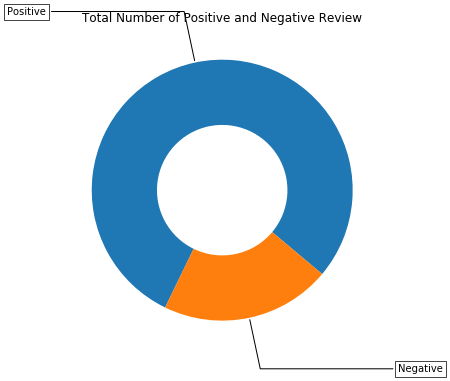

In [101]:
# https://matplotlib.org/gallery/pie_and_polar_charts/pie_and_donut_labels.html#sphx-glr-gallery-pie-and-polar-charts-pie-and-donut-labels-py
y_value_counts = final_dataset['review_score'].value_counts()
print("Number of Positive Review ", y_value_counts[1], ", (", (y_value_counts[1]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")
print("Number of Negative Review", y_value_counts[0], ", (", (y_value_counts[0]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
recipe = ["Positive", "Negative"]

data = [y_value_counts[1], y_value_counts[0]]

wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), startangle=-40)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(xycoords='data', textcoords='data', arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(recipe[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                 horizontalalignment=horizontalalignment, **kw)

ax.set_title("Total Number of Positive and Negative Review")

plt.show()

## Univariate Analysis: product_photos_qty

In [102]:
print(final_dataset['product_photos_qty'].value_counts())

1.0     4977
2.0     1787
3.0     1147
4.0      829
5.0      508
6.0      395
7.0      130
8.0       67
9.0       43
10.0      25
15.0       1
11.0       1
17.0       1
Name: product_photos_qty, dtype: int64


In [103]:
# Pandas dataframe groupby count, mean: https://stackoverflow.com/a/19385591/4084039

temp = pd.DataFrame(final_dataset.groupby("product_photos_qty")["review_score"].apply(np.mean)).reset_index()
# if you have data which contain only 0 and 1, then the mean = percentage (think about it)
temp.columns = ['product photo Quantity', 'Percentage of Postive Review']

In [104]:
def sorted_approval_percentage(col):
    '''
        This Function will top 5 highest and lowest  Positive Review according to col
    '''
    temp = pd.DataFrame(final_dataset.groupby(col)["review_score"].apply(np.mean)).reset_index()
    temp.columns = [col, 'Quantity']
    temp.sort_values(by=['Quantity'], inplace=True)
    print(col+"vs lowest % Positive Reviews")
    print(temp.head(5))
    print('='*50)
    print(col+"vs highest % positive Review")
    print(temp.tail(5))
    print('Total Number of row',temp.shape[0])

In [105]:
#stacked bar plots matplotlib: https://matplotlib.org/gallery/lines_bars_and_markers/bar_stacked.html
def stack_plot(data, xtick, col2='review_score', col3='total'):
    ind = np.arange(data.shape[0])
    
    plt.figure(figsize=(20,5))
    p1 = plt.bar(ind, data[col3].values)
    p2 = plt.bar(ind, data[col2].values)

    plt.ylabel('Reviews')
    plt.title('Number of Positive Review vs Negative Review')
    plt.xticks(ind, list(data[xtick].values))
    plt.legend((p1[0], p2[0]), ('Total', 'Postive Review'))
    plt.show()

In [106]:
def univariate_barplots(data, col1, col2='review_score', top=False):
    # Count number of zeros in dataframe python: https://stackoverflow.com/a/51540521/4084039
    temp = pd.DataFrame(final_dataset.groupby(col1)[col2].agg(lambda x: x.eq(1).sum())).reset_index()

    # Pandas dataframe grouby count: https://stackoverflow.com/a/19385591/4084039
    temp['total'] = pd.DataFrame(final_dataset.groupby(col1)[col2].agg({'total':'count'})).reset_index()['total']
    temp['Avg'] = pd.DataFrame(final_dataset.groupby(col1)[col2].agg({'Avg':'mean'})).reset_index()['Avg']
    
    temp.sort_values(by=['total'],inplace=True, ascending=False)
    
    if top:
        temp = temp[0:top]
    
    stack_plot(temp, xtick=col1, col2=col2, col3='total')
    print(temp.head(5))
    print("="*50)
    print(temp.tail(5))

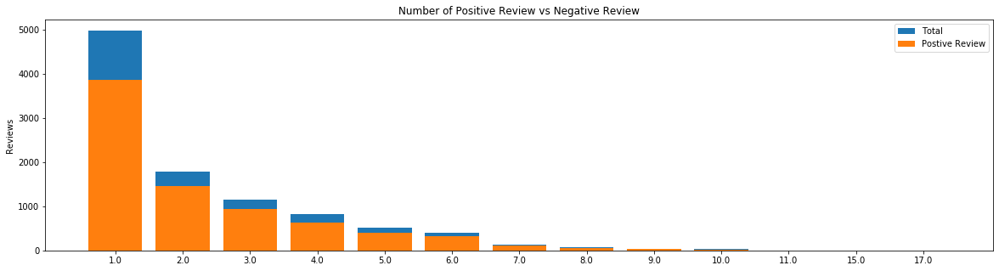

   product_photos_qty  review_score  total       Avg
0                 1.0          3866   4977  0.776773
1                 2.0          1448   1787  0.810297
2                 3.0           933   1147  0.813426
3                 4.0           629    829  0.758745
4                 5.0           407    508  0.801181
    product_photos_qty  review_score  total       Avg
8                  9.0            34     43  0.790698
9                 10.0            19     25  0.760000
10                11.0             0      1  0.000000
11                15.0             1      1  1.000000
12                17.0             1      1  1.000000


In [107]:
univariate_barplots(final_dataset, 'product_photos_qty', 'review_score', False)

In [108]:
sorted_approval_percentage('product_photos_qty')

product_photos_qtyvs lowest % Positive Reviews
    product_photos_qty  Quantity
10                11.0  0.000000
3                  4.0  0.758745
9                 10.0  0.760000
0                  1.0  0.776773
8                  9.0  0.790698
product_photos_qtyvs highest % positive Review
    product_photos_qty  Quantity
1                  2.0  0.810297
2                  3.0  0.813426
6                  7.0  0.846154
11                15.0  1.000000
12                17.0  1.000000
Total Number of row 13


### Observation 
 * Product Having No .of photos with 2,3,7 have more than 80 % chances of Positive Feedback 
 * Product having No. of Photos with 15, 17  having 100% chances of getting Positve Feedback
 * Product having No. of Photos with 11 having 0% chances of getting Positve Feedback

## Univariate Analysis: Customer City

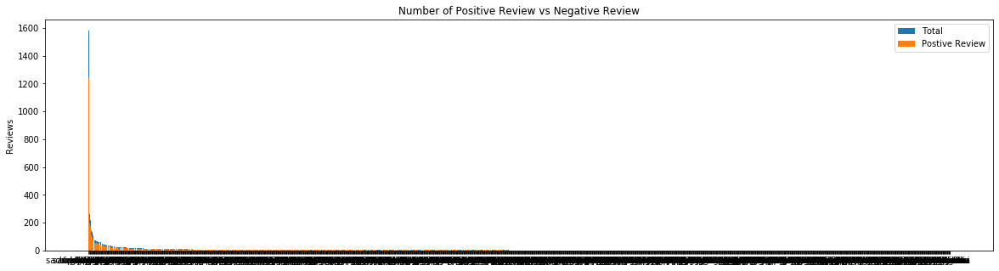

       customer_city  review_score  total       Avg
1381       sao paulo          1239   1581  0.783681
1206  rio de janeiro           497    655  0.758779
157   belo horizonte           197    262  0.751908
203         brasilia           172    216  0.796296
1245        salvador           116    158  0.734177
     customer_city  review_score  total  Avg
680      itanhandu             1      1  1.0
681        itanhem             0      1  0.0
682         itaoca             1      1  1.0
683       itaocara             1      1  1.0
1584      xinguara             0      1  0.0


In [109]:
univariate_barplots(final_dataset, 'customer_city', 'review_score', False)

In [110]:
sorted_approval_percentage('customer_city')

customer_cityvs lowest % Positive Reviews
        customer_city  Quantity
1584         xinguara       0.0
920   morro do chapeu       0.0
886     miguel calmon       0.0
884           meruoca       0.0
879        medianeira       0.0
customer_cityvs highest % positive Review
     customer_city  Quantity
780      juvenilia       1.0
779           juti       1.0
778        jussari       1.0
785  lagoa dourada       1.0
792         lajedo       1.0
Total Number of row 1585


In [111]:
final_dataset[final_dataset['customer_city']=='medianeira'].review_score

7159    0
Name: review_score, dtype: int64

### Observation 
 * Customer who lived in city like  xinguara , morro do chapeu ,miguel calmon ,meruoca , medianeira always gave a Negative Feedback
 *  Customer who lived in city like  juvenilia ,juti ,jussari calmon ,lagoa dourada , lajedo always gave a Positve Feedback

## Univariate Analysis:  Customer State

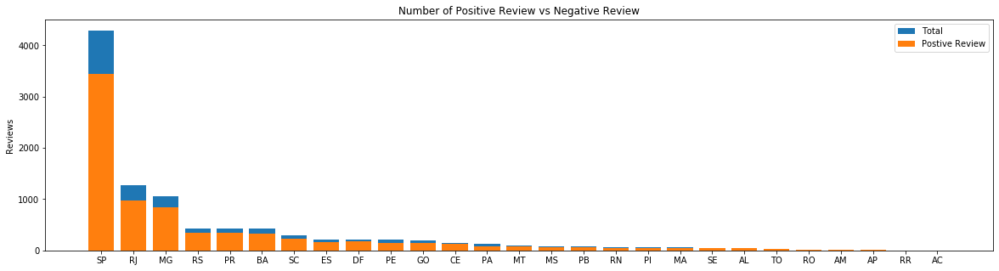

   customer_state  review_score  total       Avg
25             SP          3439   4290  0.801632
18             RJ           978   1270  0.770079
10             MG           844   1060  0.796226
22             RS           342    428  0.799065
17             PR           346    428  0.808411
   customer_state  review_score  total     Avg
20             RO            16     20  0.8000
2              AM            11     16  0.6875
3              AP             9      9  1.0000
21             RR             3      4  0.7500
0              AC             3      4  0.7500


In [112]:
univariate_barplots(final_dataset, 'customer_state', 'review_score', False)

In [113]:
sorted_approval_percentage('customer_state')

customer_statevs lowest % Positive Reviews
   customer_state  Quantity
19             RN  0.633803
2              AM  0.687500
16             PI  0.688525
9              MA  0.689655
13             PA  0.704918
customer_statevs highest % positive Review
   customer_state  Quantity
5              CE  0.812081
12             MT  0.851485
26             TO  0.878788
1              AL  0.886364
3              AP  1.000000
Total Number of row 27


### Observation 
 * Every Customer State always gave minimum 63% of Positive Feedback
 * Customer who lived in state like  CE ,MT ,TO AL ,AP always gave More than 80% of positive Feedback 

## Univariate Analysis:   Payment Sequential

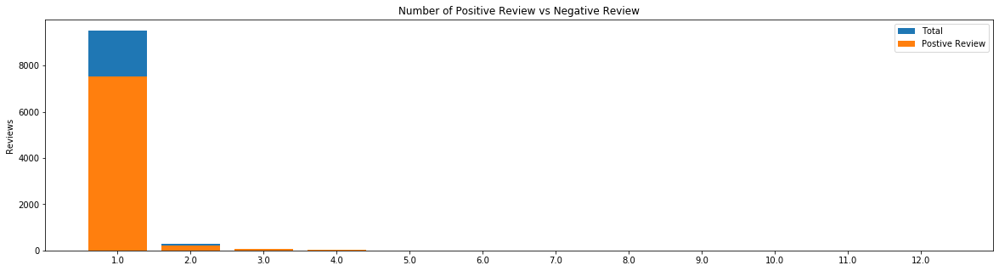

   payment_sequential  review_score  total       Avg
0                 1.0          7514   9516  0.789617
1                 2.0           213    285  0.747368
2                 3.0            50     60  0.833333
3                 4.0            20     22  0.909091
4                 5.0             9     11  0.818182
    payment_sequential  review_score  total  Avg
7                  8.0             1      1  1.0
8                  9.0             1      1  1.0
9                 10.0             1      1  1.0
10                11.0             1      1  1.0
11                12.0             1      1  1.0


In [114]:
univariate_barplots(final_dataset, 'payment_sequential', 'review_score', False)

In [115]:








sorted_approval_percentage('payment_sequential')

payment_sequentialvs lowest % Positive Reviews
   payment_sequential  Quantity
1                 2.0  0.747368
5                 6.0  0.750000
6                 7.0  0.750000
0                 1.0  0.789617
4                 5.0  0.818182
payment_sequentialvs highest % positive Review
    payment_sequential  Quantity
7                  8.0       1.0
8                  9.0       1.0
9                 10.0       1.0
10                11.0       1.0
11                12.0       1.0
Total Number of row 12


### Observation 
 * Customer who made a any payment sequential atleast gave 74.5% of Positive Feedback of Total
 * Customer who made a payment sequential of 8,9,10,11,12 always give Positive Feedback
 * Most of the Customer use payment sequential 1

## Univariate Analysis:   Payment Type

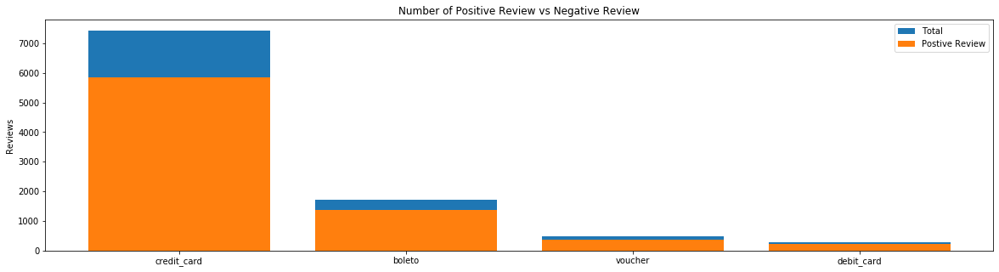

  payment_type  review_score  total       Avg
1  credit_card          5849   7424  0.787850
0       boleto          1369   1729  0.791787
3      voucher           382    481  0.794179
2   debit_card           220    277  0.794224
  payment_type  review_score  total       Avg
1  credit_card          5849   7424  0.787850
0       boleto          1369   1729  0.791787
3      voucher           382    481  0.794179
2   debit_card           220    277  0.794224


In [116]:
univariate_barplots(final_dataset, 'payment_type', 'review_score', False)

In [117]:
sorted_approval_percentage('payment_type')

payment_typevs lowest % Positive Reviews
  payment_type  Quantity
1  credit_card  0.787850
0       boleto  0.791787
3      voucher  0.794179
2   debit_card  0.794224
payment_typevs highest % positive Review
  payment_type  Quantity
1  credit_card  0.787850
0       boleto  0.791787
3      voucher  0.794179
2   debit_card  0.794224
Total Number of row 4


### Observation 
 * Customer who choose any type payment alteast give 79% of positive Review
 * Most of the Customer choose credit Card payment

## Univariate Analysis:   Payment Type

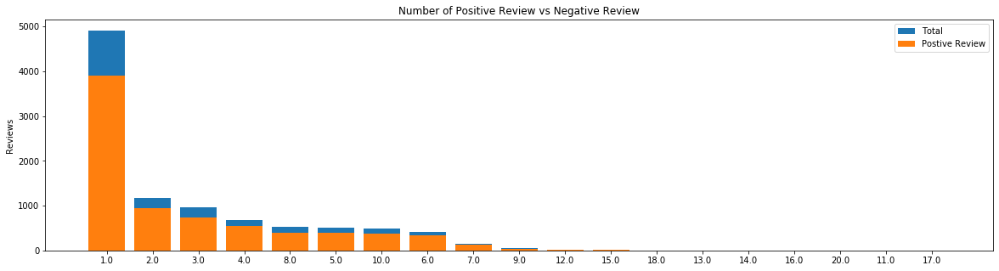

   payment_installments  review_score  total       Avg
0                   1.0          3910   4908  0.796659
1                   2.0           941   1176  0.800170
2                   3.0           740    964  0.767635
3                   4.0           544    688  0.790698
7                   8.0           394    522  0.754789
    payment_installments  review_score  total  Avg
13                  14.0             2      2  1.0
15                  16.0             2      2  1.0
18                  20.0             2      2  1.0
10                  11.0             1      1  1.0
16                  17.0             1      1  1.0


In [118]:
univariate_barplots(final_dataset, 'payment_installments', 'review_score', False)

In [119]:
sorted_approval_percentage('payment_installments')

payment_installmentsvs lowest % Positive Reviews
    payment_installments  Quantity
17                  18.0  0.600000
12                  13.0  0.666667
11                  12.0  0.692308
7                    8.0  0.754789
8                    9.0  0.764706
payment_installmentsvs highest % positive Review
    payment_installments  Quantity
13                  14.0       1.0
15                  16.0       1.0
16                  17.0       1.0
10                  11.0       1.0
18                  20.0       1.0
Total Number of row 19


### Observation 
 * Customer who choose any Number of payment installment alteast give 60% of positive Review
 * Most of the Customer choose One type of Payment Installment
 * Customer having payment Installment 14,16,17,11,20 always giev postive feedback

## Univariate Analysis:   Product Category Name

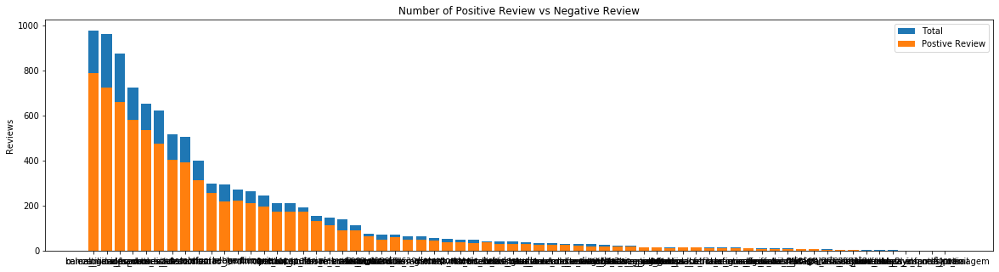

    product_category_name  review_score  total       Avg
11           beleza_saude           790    977  0.808598
13        cama_mesa_banho           724    962  0.752599
60     relogios_presentes           661    876  0.754566
65  utilidades_domesticas           579    725  0.798621
32          esporte_lazer           537    653  0.822358
             product_category_name  review_score  total  Avg
37  fashion_underwear_e_moda_praia             1      2  0.5
35   fashion_roupa_infanto_juvenil             1      1  1.0
17               cds_dvds_musicais             1      1  1.0
62        tablets_impressao_imagem             1      1  1.0
39                          flores             1      1  1.0


In [120]:
univariate_barplots(final_dataset, 'product_category_name', 'review_score', False)

In [121]:
sorted_approval_percentage('product_category_name')

product_category_namevs lowest % Positive Reviews
             product_category_name  Quantity
37  fashion_underwear_e_moda_praia  0.500000
27                    dvds_blu_ray  0.500000
15                 casa_conforto_2  0.500000
51               moveis_escritorio  0.642857
16                 casa_construcao  0.661972
product_category_namevs highest % positive Review
            product_category_name  Quantity
39                         flores       1.0
35  fashion_roupa_infanto_juvenil       1.0
34               fashion_calcados       1.0
62       tablets_impressao_imagem       1.0
2               alimentos_bebidas       1.0
Total Number of row 66


### Observation 
 * Each Product Category atleast recieve 50 % postive feedback from Customer
 * Some Product Category like alimentos_bebidas ,fashion_calcados etc always positve Feedback as they very less sold in website
 * beleza_saude product has highest sold product having 80 % of positive Feedback.

## Univariate Analysis:  product_name_lenght

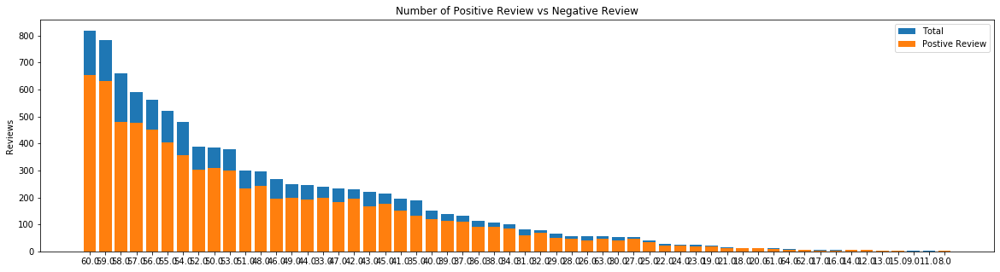

    product_name_lenght  review_score  total       Avg
51                 60.0           654    818  0.799511
50                 59.0           632    784  0.806122
49                 58.0           480    659  0.728376
48                 57.0           476    589  0.808149
47                 56.0           451    562  0.802491
   product_name_lenght  review_score  total  Avg
4                 13.0             4      4  1.0
6                 15.0             3      3  1.0
1                  9.0             0      1  0.0
2                 11.0             0      1  0.0
0                  8.0             1      1  1.0


In [122]:
univariate_barplots(final_dataset, 'product_name_lenght', 'review_score', False)

In [123]:
sorted_approval_percentage('product_name_lenght')

product_name_lenghtvs lowest % Positive Reviews
    product_name_lenght  Quantity
1                   9.0  0.000000
2                  11.0  0.000000
26                 35.0  0.698413
22                 31.0  0.707317
14                 23.0  0.708333
product_name_lenghtvs highest % positive Review
   product_name_lenght  Quantity
6                 15.0       1.0
5                 14.0       1.0
4                 13.0       1.0
3                 12.0       1.0
0                  8.0       1.0
Total Number of row 56


### Observation 
 * Product have product name Length 9 and 11 always recive negative Feedback
 * Except Product have product name length 9 and 11 recive atleast 69% os positive reviews
 * The maximum product having length name is 60

## Univariate Analysis:  product_name_lenght

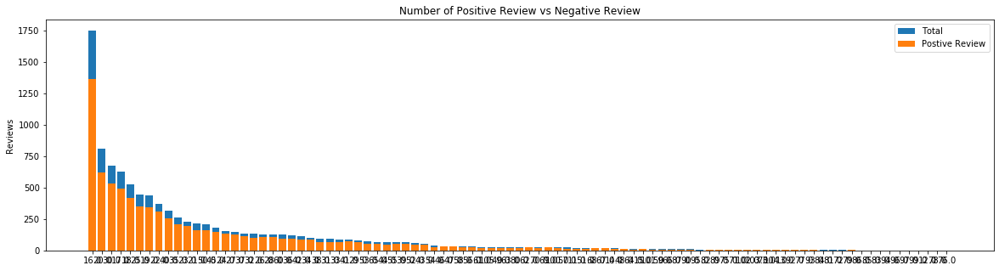

    product_length_cm  review_score  total       Avg
5                16.0          1364   1752  0.778539
9                20.0           621    813  0.763838
19               30.0           534    676  0.789941
6                17.0           493    631  0.781300
7                18.0           417    526  0.792776
    product_length_cm  review_score  total  Avg
83               97.0             1      1  1.0
84               99.0             1      1  1.0
1                12.0             1      1  1.0
66               78.0             1      1  1.0
64               76.0             1      1  1.0


In [124]:
univariate_barplots(final_dataset, 'product_length_cm', 'review_score', False)

In [125]:
sorted_approval_percentage('product_length_cm')

product_length_cmvs lowest % Positive Reviews
    product_length_cm  Quantity
82               96.0  0.000000
72               84.0  0.000000
81               95.0  0.200000
61               72.0  0.333333
69               81.0  0.333333
product_length_cmvs highest % positive Review
    product_length_cm  Quantity
60               71.0       1.0
67               79.0       1.0
74               86.0       1.0
71               83.0       1.0
76               89.0       1.0
Total Number of row 91


### Observation 
 * Product having product Length in cm  96 and 84 always recive negative Feedback
 * Except Product have product length in cm  96 and 84 recive atleast 20 % os positive reviews
 * The maximum product having product lenght is 16 

## Univariate Analysis:  seller_city

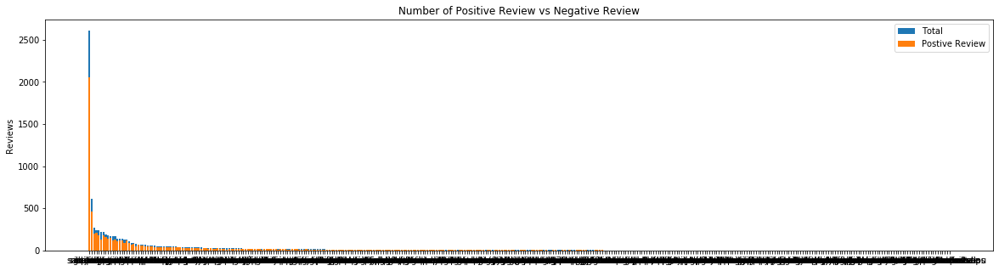

        seller_city  review_score  total       Avg
312       sao paulo          2056   2610  0.787739
135        ibitinga           462    618  0.747573
133       guarulhos           199    273  0.728938
93         curitiba           212    240  0.883333
267  rio de janeiro           180    239  0.753138
           seller_city  review_score  total  Avg
111    flores da cunha             1      1  1.0
115   formosa do oeste             1      1  1.0
119  francisco beltrao             1      1  1.0
270       rio do oeste             1      1  1.0
185         luiz alves             1      1  1.0


In [126]:
univariate_barplots(final_dataset, 'seller_city', 'review_score', False)

In [127]:
sorted_approval_percentage('seller_city')

seller_cityvs lowest % Positive Reviews
          seller_city  Quantity
169  juzeiro do norte       0.0
333            tanabi       0.0
340           timoteo       0.0
85   cordilheira alta       0.0
348              tupa       0.0
seller_cityvs highest % positive Review
           seller_city  Quantity
173            lajeado       1.0
174            lambari       1.0
175  laranjal paulista       1.0
252         porto belo       1.0
184           louveira       1.0
Total Number of row 370


### Observation 
 * seller city juzeiro do norte ,tanabi , timoteo, ncordilheira alta , tupa always reieve 100% Postive Feedback 
 * seller city lajeado , lambari , laranjal paulista , porto belo , louveira always recieve Negative Feedback

## Univariate Analysis:  seller_state

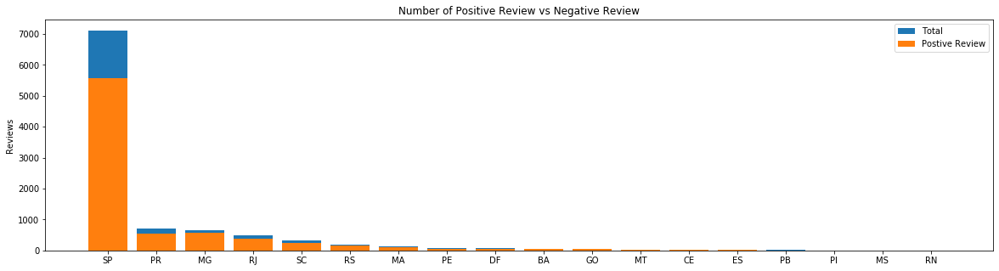

   seller_state  review_score  total       Avg
17           SP          5583   7111  0.785122
12           PR           552    697  0.791966
6            MG           564    665  0.848120
13           RJ           389    487  0.798768
16           SC           238    319  0.746082
   seller_state  review_score  total       Avg
3            ES            11     12  0.916667
9            PB             8     10  0.800000
11           PI             2      2  1.000000
7            MS             1      1  1.000000
14           RN             1      1  1.000000


In [128]:
univariate_barplots(final_dataset, 'seller_state', 'review_score', False)

In [129]:
sorted_approval_percentage('seller_state')

seller_statevs lowest % Positive Reviews
   seller_state  Quantity
1            CE  0.714286
0            BA  0.721311
16           SC  0.746082
2            DF  0.746269
5            MA  0.755245
seller_statevs highest % positive Review
   seller_state  Quantity
4            GO  0.906977
3            ES  0.916667
7            MS  1.000000
11           PI  1.000000
14           RN  1.000000
Total Number of row 18


### Observation 
 * Seller State MS , PI , RN always reieve 100% Postive Feedback 
 * Seller state SP has recived highest number of Feedback with 78 % of positive feedback

## Univariate Analysis:  seller_state

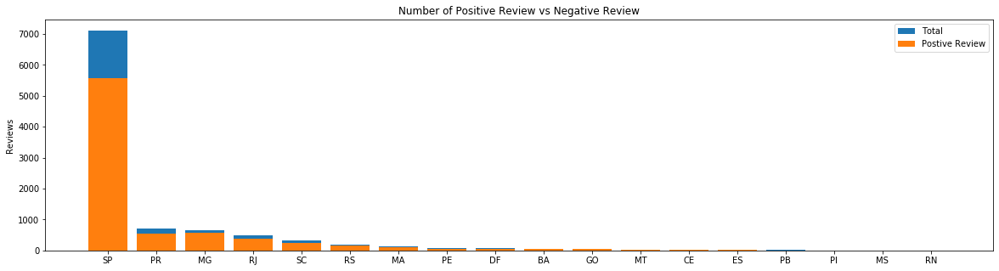

   seller_state  review_score  total       Avg
17           SP          5583   7111  0.785122
12           PR           552    697  0.791966
6            MG           564    665  0.848120
13           RJ           389    487  0.798768
16           SC           238    319  0.746082
   seller_state  review_score  total       Avg
3            ES            11     12  0.916667
9            PB             8     10  0.800000
11           PI             2      2  1.000000
7            MS             1      1  1.000000
14           RN             1      1  1.000000


In [130]:
univariate_barplots(final_dataset, 'seller_state', 'review_score', False)

In [131]:
sorted_approval_percentage('seller_state')

seller_statevs lowest % Positive Reviews
   seller_state  Quantity
1            CE  0.714286
0            BA  0.721311
16           SC  0.746082
2            DF  0.746269
5            MA  0.755245
seller_statevs highest % positive Review
   seller_state  Quantity
4            GO  0.906977
3            ES  0.916667
7            MS  1.000000
11           PI  1.000000
14           RN  1.000000
Total Number of row 18


In [132]:
# Printing First few row of dataset
final_dataset.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,0006ec9db01a64e59a68b2c340bf65a7,5d178120c29c61748ea95bac23cb8f25,delivered,2018-07-24 17:04:17,2018-07-24 17:24:20,2018-07-25 11:02:00,2018-07-31 01:04:15,2018-08-22 00:00:00,7ed0ea20347f67fe61d1c99fdf8556ae,21810,...,245.0,1.0,1383.0,50.0,10.0,40.0,14940,ibitinga,SP,bed_bath_table
1,000aed2e25dbad2f9ddb70584c5a2ded,fff5169e583fd07fac9fec88962f189d,delivered,2018-05-11 20:33:38,2018-05-11 20:57:03,2018-05-16 14:26:00,2018-05-18 16:46:31,2018-05-22 00:00:00,6457be0b331148fb5454efc88d1e03d9,13458,...,116.0,1.0,468.0,23.0,18.0,19.0,13030,campinas,SP,perfumery
2,00130c0eee84a3d909e75bc08c5c3ca1,47d656c08a282ec5ab4c1f18303a3a30,delivered,2018-06-11 21:17:00,2018-06-12 05:16:24,2018-06-12 14:22:00,2018-06-13 15:28:25,2018-06-20 00:00:00,b5910f24d2483d697b37e3857b621061,9820,...,982.0,1.0,150.0,17.0,13.0,13.0,12940,atibaia,SP,food
3,001e7cf2ad6bef3ade12ebc56ceaf0f3,d1684ed69f8fd574b7c344de923f379a,delivered,2018-05-19 10:29:23,2018-05-19 10:59:50,2018-05-21 14:34:00,2018-06-04 18:08:23,2018-06-05 00:00:00,43860f86362fea12550bfa19ef73015f,38550,...,394.0,1.0,1614.0,31.0,16.0,28.0,30111,belo horizonte,MG,health_beauty
4,002175704e8b209f61b9ad5cfd92b60e,a562db3c7cb9a68947debd30879b491e,delivered,2018-04-22 12:13:25,2018-04-24 17:24:48,2018-04-23 19:03:19,2018-05-02 20:38:44,2018-05-14 00:00:00,e7d41c19da317af0612170197303d5a9,14802,...,2887.0,1.0,588.0,19.0,14.0,17.0,3470,sao paulo,SP,audio


In [133]:
final_dataset.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english'],
      dtype='object')

In [134]:
final_dataset['review_comment_message']

0                   Excelente serviço de compras on line.
1       Mudo minha opinião assim que receber o produto...
2       Produto entregue adequadamente e muito rápido,...
3                     O produto chegou e estragou sozinho
4       Produto como descrito. Mas não gostei pq o som...
                              ...                        
9913    Nunca fiz uma compra pela lannister que demora...
9914                                     Muito satisfeita
9915    O produto chegou antes da data prevista, é tud...
9916    Encomendem um pouco mais, não tem o tamanho in...
9917    recomendo a loja...meu produto chegou antes do...
Name: review_comment_message, Length: 9911, dtype: object

### Count the total number of words present in product_category_name_english in each row final_dataset

In [135]:
no_words_in_product_cat_name_english = final_dataset["product_category_name_english"].astype(str).str.len() 

In [136]:
final_dataset['no_words_in_product_cat_name_english'] = no_words_in_product_cat_name_english

In [137]:
print(final_dataset.shape)
print('='*52)
print(final_dataset.columns)

(9911, 41)
Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english',
       'no_words_in_product_cat_name_engli

### Count the total number of words present in product_category_name_english in each row final_dataset

In [138]:
no_words_in_review_comment_title = final_dataset["review_comment_title"].astype(str).str.len() 
no_words_in_review_comment_msg = final_dataset["review_comment_message"].astype(str).str.len() 

In [139]:
final_dataset['no_words_in_review_comment_title'] = no_words_in_review_comment_title
final_dataset['no_words_in_review_comment_msg'] = no_words_in_review_comment_msg

In [140]:
print(final_dataset.shape)
print('='*52)
print(final_dataset.columns)

(9911, 43)
Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english', 'no_words_in_product_cat_name_english',
  

## Univariate Analysis:  no_words_in_review_comment_title

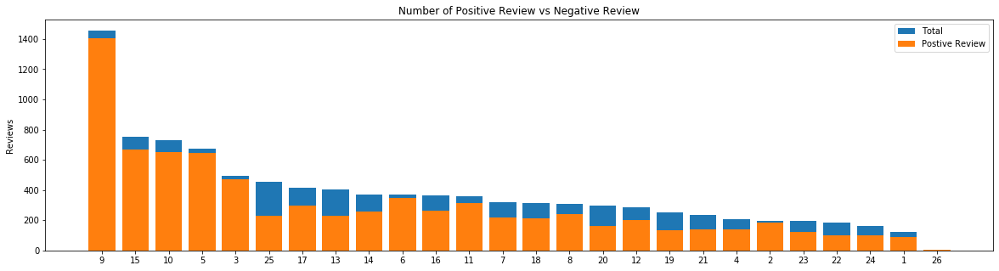

    no_words_in_review_comment_title  review_score  total       Avg
8                                  9          1406   1456  0.965659
14                                15           670    754  0.888594
9                                 10           650    730  0.890411
4                                  5           645    673  0.958395
2                                  3           472    493  0.957404
    no_words_in_review_comment_title  review_score  total       Avg
22                                23           123    193  0.637306
21                                22           101    185  0.545946
23                                24            99    163  0.607362
0                                  1            88    120  0.733333
25                                26             2      2  1.000000


In [141]:
univariate_barplots(final_dataset, 'no_words_in_review_comment_title', 'review_score', False)

In [142]:
sorted_approval_percentage('no_words_in_review_comment_title')

no_words_in_review_comment_titlevs lowest % Positive Reviews
    no_words_in_review_comment_title  Quantity
24                                25  0.497807
18                                19  0.521739
21                                22  0.545946
19                                20  0.549153
12                                13  0.567164
no_words_in_review_comment_titlevs highest % positive Review
    no_words_in_review_comment_title  Quantity
1                                  2  0.943590
2                                  3  0.957404
4                                  5  0.958395
8                                  9  0.965659
25                                26  1.000000
Total Number of row 26


### Observation 
 * Number of words in Review comment title with number of words 26 got 100 % positive Feedback    
 * Number of words in Review comment title with any Number of words got atleast 50% positive Feedback
 * Number of words in Review comment title wuth number 2,3,5,9 got more than 95 % positve Feedback

## Univariate Analysis:  no_words_in_review_comment_msg

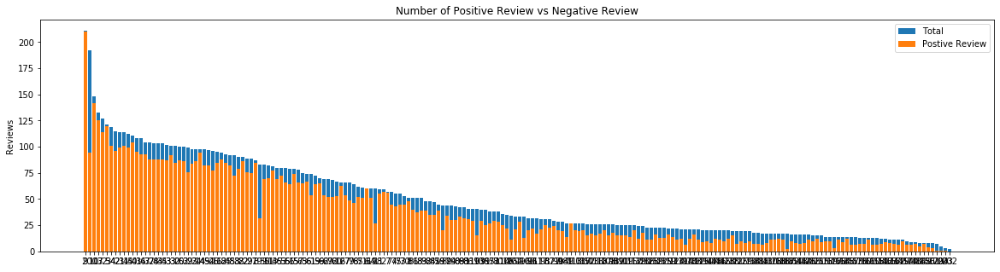

     no_words_in_review_comment_msg  review_score  total       Avg
8                                 9           210    211  0.995261
199                             200            94    192  0.489583
9                                10           142    148  0.959459
16                               17           125    133  0.939850
31                               32           114    127  0.897638
     no_words_in_review_comment_msg  review_score  total       Avg
200                             201             3      8  0.375000
178                             179             1      7  0.142857
203                             204             1      5  0.200000
202                             203             1      3  0.333333
201                             202             0      2  0.000000


In [143]:
univariate_barplots(final_dataset, 'no_words_in_review_comment_msg', 'review_score', False)

In [144]:
sorted_approval_percentage('no_words_in_review_comment_msg')

no_words_in_review_comment_msgvs lowest % Positive Reviews
     no_words_in_review_comment_msg  Quantity
201                             202  0.000000
186                             187  0.117647
178                             179  0.142857
203                             204  0.200000
176                             177  0.214286
no_words_in_review_comment_msgvs highest % positive Review
   no_words_in_review_comment_msg  Quantity
6                               7  0.982456
4                               5  0.991736
8                               9  0.995261
5                               6  1.000000
0                               1  1.000000
Total Number of row 204


In [145]:
final_dataset.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,no_words_in_product_cat_name_english,no_words_in_review_comment_title,no_words_in_review_comment_msg
0,0006ec9db01a64e59a68b2c340bf65a7,5d178120c29c61748ea95bac23cb8f25,delivered,2018-07-24 17:04:17,2018-07-24 17:24:20,2018-07-25 11:02:00,2018-07-31 01:04:15,2018-08-22 00:00:00,7ed0ea20347f67fe61d1c99fdf8556ae,21810,...,50.0,10.0,40.0,14940,ibitinga,SP,bed_bath_table,14,3,37
1,000aed2e25dbad2f9ddb70584c5a2ded,fff5169e583fd07fac9fec88962f189d,delivered,2018-05-11 20:33:38,2018-05-11 20:57:03,2018-05-16 14:26:00,2018-05-18 16:46:31,2018-05-22 00:00:00,6457be0b331148fb5454efc88d1e03d9,13458,...,23.0,18.0,19.0,13030,campinas,SP,perfumery,9,20,107
2,00130c0eee84a3d909e75bc08c5c3ca1,47d656c08a282ec5ab4c1f18303a3a30,delivered,2018-06-11 21:17:00,2018-06-12 05:16:24,2018-06-12 14:22:00,2018-06-13 15:28:25,2018-06-20 00:00:00,b5910f24d2483d697b37e3857b621061,9820,...,17.0,13.0,13.0,12940,atibaia,SP,food,4,15,71
3,001e7cf2ad6bef3ade12ebc56ceaf0f3,d1684ed69f8fd574b7c344de923f379a,delivered,2018-05-19 10:29:23,2018-05-19 10:59:50,2018-05-21 14:34:00,2018-06-04 18:08:23,2018-06-05 00:00:00,43860f86362fea12550bfa19ef73015f,38550,...,31.0,16.0,28.0,30111,belo horizonte,MG,health_beauty,13,7,35
4,002175704e8b209f61b9ad5cfd92b60e,a562db3c7cb9a68947debd30879b491e,delivered,2018-04-22 12:13:25,2018-04-24 17:24:48,2018-04-23 19:03:19,2018-05-02 20:38:44,2018-05-14 00:00:00,e7d41c19da317af0612170197303d5a9,14802,...,19.0,14.0,17.0,3470,sao paulo,SP,audio,5,9,73


In [146]:
print(final_dataset.columns)

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english', 'no_words_in_product_cat_name_english',
       'no_wo

<h2> Data PreProcessing </h2>

In [147]:
## We are going to drop order_id, customer_id ,customer_unique_id ,order_item_id ,product_id ,seller_id,review_id,
final_dataset  =  final_dataset.drop(['order_id','customer_id','customer_unique_id','order_item_id','product_id','seller_id','review_id'], axis=1)
print(final_dataset.shape)
print(final_dataset.columns)

(9911, 36)
Index(['order_status', 'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'shipping_limit_date', 'price',
       'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_score',
       'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english', 'no_words_in_product_cat_name_english',
       'no_words_in_review_comment_title', 'no_words_in_review_comment_msg'],
      dtype='object')


 ## Text preprocessing


In [148]:
print(final_dataset['review_comment_title'][2])
print(final_dataset['review_comment_message'][10])
print(final_dataset['product_category_name_english'][25])

Super Recomendo
Recebi tudo certinho, recomendo.
sports_leisure


## Preprocessing of review_comment_title

In [149]:
# printing some random reviews comment Title
print(final_dataset['review_comment_title'].values[0])
print("="*50)
print(final_dataset['review_comment_title'].values[50])
print("="*50)
print(final_dataset['review_comment_title'].values[100])
print("="*50)
print(final_dataset['review_comment_title'].values[1000])
print("="*50)
print(final_dataset['review_comment_title'].values[5000])
print("="*50)

Boa
Recomendo
Muito Boa 
Vendedor Recomendavel
Muito bom


In [150]:
from collections import Counter
review_comment_title_clean = list(final_dataset['review_comment_title'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in review_comment_title_clean:
    temp = ""
    # consider we have text like this "Muito Boa , Vendedor Recomendavel
    for j in i.split(','): 
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty)
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

final_dataset['preprocessed_review_comment_title'] = sub_cat_list
final_dataset.drop(['review_comment_title'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in final_dataset['preprocessed_review_comment_title'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

In [151]:
print(final_dataset.columns)
print(final_dataset.shape)

Index(['order_status', 'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'shipping_limit_date', 'price',
       'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_score',
       'review_comment_message', 'review_creation_date',
       'review_answer_timestamp', 'product_category_name',
       'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'seller_zip_code_prefix',
       'seller_city', 'seller_state', 'product_category_name_english',
       'no_words_in_product_cat_name_english',
       'no_words_in_review_comment_title', 'no_words_in_review_comment_msg',
       'preprocessed_review_comment_title'],
      dtype='object')
(9911,

## Preprocessing of product_category_name_english

In [152]:
# printing some random reviews comment Title
print(final_dataset['product_category_name_english'].values[0])
print("="*50)
print(final_dataset['product_category_name_english'].values[50])
print("="*50)
print(final_dataset['product_category_name_english'].values[100])
print("="*50)
print(final_dataset['product_category_name_english'].values[1000])
print("="*50)
print(final_dataset['product_category_name_english'].values[5000])
print("="*50)

bed_bath_table
computers_accessories
furniture_living_room
consoles_games
bed_bath_table


### As product_category_name_english is already Preprocessed 

## Preprocessing of product_category_name_english

In [153]:
# printing some random reviews comment Title
print(final_dataset['review_comment_message'].values[0])
print("="*50)
print(final_dataset['review_comment_message'].values[50])
print("="*50)
print(final_dataset['review_comment_message'].values[100])
print("="*50)
print(final_dataset['review_comment_message'].values[1000])
print("="*50)
print(final_dataset['review_comment_message'].values[5000])
print("="*50)

Excelente serviço de compras on line.
O produto atendeu as minhas expectativas, recomendo aos interessados!
Meu produto veio falta peças 
Produto entregue no prazo e conforme descrição.
Satisfeita


In [154]:
# Removing HTML Tag , \r tags, \n (enter) with space Removed all Special Character  
from tqdm import tqdm
preprocessed_review_comment_message= []
# tqdm is for printing the status bar
for sentance in tqdm(final_dataset['review_comment_message'].values):
    sentance = sentance.replace('\r', ' ')
    sentance = sentance.replace('\\"', ' ')
    sentance = sentance.replace('\n', ' ')
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = re.sub(r'[^\w]', ' ', sentance)
    sentance = re.sub(r"\s+", " ", sentance)
    sentance = re.sub('[^A-Za-z0-9]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    preprocessed_review_comment_message.append(sentance.lower().strip())
final_dataset['preprocessed_review_comment_message'] = preprocessed_review_comment_message
final_dataset.drop(['review_comment_message'], axis=1, inplace=True)

100%|███████████████████████████████████████████████████████████████████████████| 9911/9911 [00:00<00:00, 35921.21it/s]


In [155]:
print(final_dataset.columns)
print(final_dataset.shape)

Index(['order_status', 'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'shipping_limit_date', 'price',
       'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_score',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english', 'no_words_in_product_cat_name_english',
       'no_words_in_review_comment_title', 'no_words_in_review_comment_msg',
       'preprocessed_review_comment_title',
       'preprocessed_review_comment_message'],
      dtype='ob

In [156]:
# printing some random reviews comment Title
print(final_dataset['preprocessed_review_comment_message'].values[0])
print("="*50)
print(final_dataset['preprocessed_review_comment_message'].values[50])
print("="*50)
print(final_dataset['preprocessed_review_comment_message'].values[100])
print("="*50)
print(final_dataset['preprocessed_review_comment_message'].values[1000])
print("="*50)
print(final_dataset['preprocessed_review_comment_message'].values[5000])
print("="*50)

excelente servi o de compras on line
o produto atendeu as minhas expectativas recomendo aos interessados
meu produto veio falta pe as
produto entregue no prazo e conforme descri o
satisfeita


## Feature Engineering  Time Data Set

### Working Days Estimated Delivery Time
- Gets the days between order approval and estimated delivery date. If Difference Between them is large then customer might Undatisfied with delivery and if small then customer might give a good feedback

In [157]:
x1 = final_dataset['order_approved_at'][100]
print(x1)
x2 = final_dataset['order_estimated_delivery_date'][100]
print(x2)
print(pd.to_datetime(x1).day)
print(pd.to_datetime(x2).day)
print(np.abs(pd.to_datetime(x2).day - pd.to_datetime(x1).day))

2018-06-25 18:14:44
2018-07-23 00:00:00
25
23
2


In [158]:
final_dataset['diff_estimated_approval_date'] = final_dataset.apply(lambda row: np.abs(pd.to_datetime(row['order_approved_at']).day - pd.to_datetime(row['order_estimated_delivery_date']).day),axis=1)

In [159]:
print(final_dataset.shape)

(9911, 37)


### Working Days Actual Delivery Time
- Gets the days between order Approval and delivered Customer Date. If Difference Between them is large then customer might Undatisfied with delivery and if small then customer might give a good feedback

In [160]:
final_dataset['diff_delivered_approval_date'] = final_dataset.apply(lambda row: np.abs(pd.to_datetime(row['order_approved_at']).day - pd.to_datetime(row['order_delivered_customer_date']).day),axis=1)

### Working Days Delivery Time Delta
- The difference between the actual and estimated date. If the differnce  is Negative then we can conclude that Delivery is faster and customer might happy and diff is positive then we can say that delivery is Late than Estimated.

- We can pose this Feature as a Binary Feature
- 0 - Early Delivery
- 1 - Late Delivery

In [161]:
x1 = final_dataset['order_estimated_delivery_date'][5000]
print(x1)
x2 = final_dataset['order_delivered_customer_date'][5000]
print(x2)
print(pd.to_datetime(x1).day)
print(pd.to_datetime(x2).day)
print(np.abs(pd.to_datetime(x2).day - pd.to_datetime(x1).day))

2018-08-07 00:00:00
2018-08-04 17:47:37
7
4
3


In [162]:
final_dataset['is_late'] = final_dataset.order_delivered_customer_date > final_dataset.order_estimated_delivery_date

In [163]:
final_dataset['is_late'].value_counts()

False    9055
True      856
Name: is_late, dtype: int64

### Approving time :-
-  Difference between order_approved_at and order_purchase_timestamp, if differnce between them is less then customer might get happy with Faster approving rate.

In [164]:
x1 = final_dataset['order_purchase_timestamp'][300]
print(x1)
x2 = final_dataset['order_approved_at'][300]
print(x2)
print(pd.to_datetime(x1).day)
print(pd.to_datetime(x2).day)
print(np.abs(pd.to_datetime(x2).day - pd.to_datetime(x1).day))

2018-05-16 16:00:21
2018-05-17 03:34:49
16
17
1


In [165]:
final_dataset['approving_time'] = final_dataset.apply(lambda row: np.abs(pd.to_datetime(row['order_approved_at']).day - pd.to_datetime(row['order_purchase_timestamp']).day),axis=1)

### Processing Time
-  Difference between order_delivered_carrier_date and order_approved_at, if difference between them is less then customer might get happy with Faster Processing rate.  Customer may recieved the product Earlier than Estimated date

In [166]:
final_dataset['processing_time'] = final_dataset.apply(lambda row: np.abs(pd.to_datetime(row['order_delivered_carrier_date']).day - pd.to_datetime(row['order_approved_at']).day),axis=1)

### Delivery Time
-  Difference between order_delivered_customer_date and order_delivered_carrier_date, if difference between them is less then customer might get happy with Faster Delivery.  Customer may recieved the product Earlier than Estimated date

In [167]:
final_dataset['delivery_time'] = final_dataset.apply(lambda row: np.abs(pd.to_datetime(row['order_delivered_customer_date']).day - pd.to_datetime(row['order_delivered_carrier_date']).day),axis=1)

### Seller on  Time
-  Difference between order_delivered_carrier_date and shipping_limit_date, if difference between them is less then customer might get happy with Seller Service.  Customer may recieved the product Earlier than Estimated date

In [168]:
final_dataset['seller_on_time'] = final_dataset.order_delivered_carrier_date < final_dataset.shipping_limit_date

In [169]:
final_dataset['seller_on_time'].value_counts()

True     9082
False     829
Name: seller_on_time, dtype: int64

### Total Delivery Time 
-  Difference between order_purchase_timestamp and order_delivered_customer_date, if difference between them is less then customer might get happy with Olist Service.  Customer may recieved the product Earlier than Expectation

In [170]:
final_dataset['total_delivery_time'] = final_dataset.apply(lambda row: np.abs(pd.to_datetime(row['order_delivered_customer_date']).day - pd.to_datetime(row['order_purchase_timestamp']).day),axis=1)

In [171]:
x = final_dataset['order_purchase_timestamp'][10]
print(x)
print(pd.to_datetime(x).dayofweek)

2018-07-04 06:45:05
2


### Purchase day of Week 
- Customer Purchase alos depend weekend and weekdays , some customer prefer to have shopping weekend and some in weekdays, so day per week can also become good Feature

In [172]:
final_dataset['purchase_dayofweek'] = final_dataset.apply(lambda row: pd.to_datetime(row['order_purchase_timestamp']).dayofweek,axis=1)

In [173]:
final_dataset['purchase_dayofweek'].value_counts()

0    1700
2    1629
1    1621
3    1510
4    1333
6    1070
5    1048
Name: purchase_dayofweek, dtype: int64

In [174]:
print(final_dataset.columns)
print(final_dataset.shape)

Index(['order_status', 'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'shipping_limit_date', 'price',
       'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_score',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english', 'no_words_in_product_cat_name_english',
       'no_words_in_review_comment_title', 'no_words_in_review_comment_msg',
       'preprocessed_review_comment_title',
       'preprocessed_review_comment_message', 'diff_estimated_

### After Completing Feature Engineering With Time we droping order_approved_at,    order_purchase_timestamp,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,shipping_limit_date,review_answer_timestamp

In [175]:
final_dataset.drop(['order_approved_at','order_purchase_timestamp','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date','shipping_limit_date','review_answer_timestamp','review_creation_date' ], axis=1, inplace=True)

In [176]:
final_dataset['order_status'].value_counts()

delivered    9911
Name: order_status, dtype: int64

In [177]:
# As all the order statud delivered and none of order goes undelivered, so we are going order_status
final_dataset.drop(['order_status'], axis=1, inplace=True)

In [178]:
print(final_dataset.shape)
print(final_dataset.columns)

(9911, 36)
Index(['customer_zip_code_prefix', 'customer_city', 'customer_state', 'price',
       'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_score',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'product_category_name_english', 'no_words_in_product_cat_name_english',
       'no_words_in_review_comment_title', 'no_words_in_review_comment_msg',
       'preprocessed_review_comment_title',
       'preprocessed_review_comment_message', 'diff_estimated_approval_date',
       'diff_delivered_approval_date', 'is_late', 'approving_time',
       'processing_time', 'delivery_time', 'seller_on_time',
       'total_delivery_time', 'purchase_dayofweek'],
      dtype='object')


## Feature Engineering price , freight_value ,purchase_dayofweek

### Average Product Value
- Cheaper products might have lower quality, leaving customers unhappy and unsatisfied

In [179]:
# Calculate the average product value.
final_dataset['average_product_value'] = final_dataset.price / len(final_dataset.price)

### Total Order Cost
- If customer expends more in product , he would  expect better Quality of Product

In [180]:
final_dataset['total_order_cost'] = final_dataset.price + final_dataset.freight_value

### Order Freight Ratio
- If a customer pays more for freight_value, He would expect a better service.

In [181]:
# Calculate the order freight ratio.
final_dataset['order_freight_ratio'] = final_dataset.freight_value / final_dataset.price

In [182]:
#Seperating Review Score column and Feature culumn of Final Dataset 
y = final_dataset['review_score'].values
X = final_dataset.drop(['review_score'], axis=1)
X.head(5)

,customer_zip_code_prefix,customer_city,customer_state,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,...,is_late,approving_time,processing_time,delivery_time,seller_on_time,total_delivery_time,purchase_dayofweek,average_product_value,total_order_cost,order_freight_ratio
0,21810,rio de janeiro,RJ,74.0,23.32,1.0,credit_card,4.0,97.32,cama_mesa_banho,...,False,0,1,6,True,7,1,0.007466,97.32,0.315135
1,13458,santa barbara d'oeste,SP,144.0,8.77,1.0,credit_card,1.0,152.77,perfumaria,...,False,0,5,2,True,7,4,0.014529,152.77,0.060903
2,9820,sao bernardo do campo,SP,27.9,7.94,1.0,boleto,1.0,35.84,alimentos,...,False,1,0,1,True,2,0,0.002815,35.84,0.284588
3,38550,coromandel,MG,35.9,15.20,1.0,credit_card,2.0,51.10,beleza_saude,...,False,0,2,17,True,15,5,0.003622,51.10,0.423398
4,14802,araraquara,SP,109.9,13.21,1.0,credit_card,3.0,123.11,audio,...,False,2,1,21,True,20,6,0.011089,123.11,0.120200


<h1> Detailed Conclusion Exploratory Data Analysis</h1>

<h2> Reading Dataset and Removing Duplicate and Null Value</h2>

- First Read all the 9 dataset and remove all the rows which have duplicate values in the dataset.
- After removing all duplicate value ,Merge all the data set and make a dataframe
- Remove all null values from final_dataset , we left with 9911 datapoint in a final_datset
- Review score less than 3 we classified as a Negative(0) and greater than 3 classified as postive (0)
- Final DataSet set is a Imabalance Dataset
- The Number of positive Reviews in a dataset is greater than Negative Reviews.
- Total Number of Positive datapoint = 7820(78.90%)
- Total Number of Positive datapoint = 2091(21.09)

<h3> Detailed Analysis of product_photos_qty,customer_city,customer_state, payment_sequential,payment_type, product_category_name , product_name_lenght , seller_city , seller_state</h3>

 - Product Having No .of photos with 2,3,7 have more than 80 % chances of Positive Feedback 
 - Product having No. of Photos with 15, 17  having 100% chances of getting Positve Feedback
 - This Feature would might help Prediction of Positive Review and Treated as Categorical Feature
 
<h4>Customer_city</h4>

 - sao paulo customer city has recieved highest Number of Review Score of Total 1581 and 78% is a Positive Feedback
 
<h4>customer_state</h4>
 
 - Every Customer State always gave minimum 63% of Positive Feedback
 - SP State has given maximum review score among all and 80% are Positive Feedback , can become Categorical Feature
 
<h4>payment_sequential</h4>

 - Customer who made a any payment sequential atleast gave 74.5% of Positive Feedback of Total. Payment_Sequential can be treated as Categorical Feature
 
<h4>payment_type</h4>

 - Customer who choose any type payment alteast give 79% of positive Review
 - Most of the Customer choose credit Card payment and Cerdit card can become as good Feature while predicting score

<h4>product_category_name</h4>

  - Each Product Category atleast recieve 50 % postive feedback from Customer
  - beleza_saude product category name recieves highest Number review Score and 80% of them is positve Review

<h4>product_name_lenght</h4>

  - product name lenght having length 60 got highest number of reviews and 90 % of them is positve Feedback
  
<h4>seller_city</h4>
 
 - sao paulo city has recived highest review score and 78 % has positive Feedback. 
 - Seller city can be treated as a Categorical Feature
 
<h4>seller_state</h4>

 - Seller State SP has recieved maximum review of total 7111 and 78% of them is posive Feedback.
 - Seller State can Become important Categorical Feature.
 
 ===============================================================================================================================

 - customer_zip_code_prefix , 'price', 'freight_value', payment_value ,product_description_lenght , product_weight_g , product_length_cm , product_height_cm ,product_height_cm ,product_width_cm,
seller_zip_code_prefix can be treated as  Numerical Feature </h4>

<h1> Feature Engineering <h1/>

<h3> Feature Engineering With Text Words review_comment_title, review_comment_message</h3>

- Preprocess the Review Comment Title and Review Comment Message
- Create a new Feature number of words in review_comment_title and Number of Review Cooment test.


<h3> Feature Engineering With Time Data Set </h3>
 
<h4> Working Days Estimated Delivery Time </h4>
 
 
 - Gets the days between order approval and estimated delivery date. If Difference Between them is large then customer might Undatisfied with delivery and if small then customer might give a good feedback. 
 - Difference between order_estimated_delivery_date and order_approved_at in Number of Days can become Important Feature for Review Score
 
<h4> Working Days Actual Delivery Time </h4>


 - Gets the days between order Approval and delivered Customer Date. If Difference Between them is large then customer might Undatisfied with delivery and if small then customer might give a good feedback
 - Difference between order_delivered_customer_date and order_approved_at in Number of Days can become Important Feature for Review Score
 
<h4> Working Days Delivery Time Delta </h4>
 
 
 - The difference between the actual and estimated date. If the differnce is Negative then we can conclude that Delivery is faster and customer might happy and diff is positive then we can say that delivery is Late than Estimated.
 
 - is_late Feature is Boolean if order_delivered_customer_date greater than order_estimated_delivery_date is True otherwise False


<h4> Approving Time </h4>
 
 
 - Approving Time is defined as difference between order_approved_at and order_delivered_carrier_date . Better Approving Time customer might get Happy and give good review and bad review  otherwise
 
 
<h4> Processing Time </h4>

 -  Processing Time is defined as a difference order_approved_at and order_delivered_carrier_date. Better Approving Time customer might get Happy and give good review and bad review  otherwise
 
<h4> Delivery Time </h4>

 - Delivery Time is defined as a difference order_delivered_carrier_date and order_delivered_customer_date. Better Approving Time customer might get Happy and give good review and bad review  otherwise.
 
<h4> Seller on Time </h4>

 - Seller on Time is Boolean Value .If shipping_limit_date is greater than order_delivered_carrier_date is classified as True or False Otherwise. Seller Delivery also matter when customer givea feedback.
 
<h4> Total Delivery Time </h4>

 - Total Delivery Time is defined as Difference between order_purchase_timestamp and order_delivered_customer_date. if difference between them is less then customer might get happy with Olist Service.  Customer may recieved the product Earlier than Expectation.
 
<h4> Purchase day of Week  </h4>

 - Customer Purchase also depend weekend and weekdays , some customer prefer to have shopping weekend and some in weekdays, so day per week can also become good Feature
 - Purchase day of week can also become as Important Feature Predicting Reviwes.

<h3> Feature Engineering with price , freight_value ,purchase_dayofweek </h3>

<h4> Average Product Value </h4>

 - Cheaper products might have lower quality, leaving customers unhappy and unsatisfied. Average Product value might become Important Feature While Predecting Review Score.
 
 - Average Product value can be calculated as price divided by total number of Data point.
 
<h4> Total Order Cost </h4>
 
 - If customer expends more in product , he would expect better Quality of Product
 
 - Total Order Cost calculated as  final_dataset.price + final_dataset.freight_value 
 
<h4> Order Freight Ratio </h4>

 - If a customer pays more for freight_value, He would expect a better service.
 
 - Order Freight Ratio can be calculated as a freight_value divided by price

<h1> Machine Learning Model With Hyper Paramater Tunning</h1>

## Splitting data into Train and cross validation(or test): Stratified Sampling

In [183]:
# train test split
# To avoid the issue of data-leakag, make sure to split your data first and then vectorize it.
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)      

In [184]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)


In [185]:
final_dataset['payment_sequential'].value_counts()

1.0     9516
2.0      285
3.0       60
4.0       22
5.0       11
6.0        8
7.0        4
9.0        1
11.0       1
12.0       1
10.0       1
8.0        1
Name: payment_sequential, dtype: int64

## One Hot Encoding of Categorical Feature

In [186]:
# Make Data Model ready- Encoding customer_city
print("Before vectorizations")

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)
vectorizer = CountVectorizer()
vectorizer.fit(X_train['customer_city'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
# 
    X_train_customer_city = vectorizer.transform(X_train['customer_city'].values)
X_cv_customer_city= vectorizer.transform(X_cv['customer_city'].values)
X_test_customer_city = vectorizer.transform(X_test['customer_city'].values)

print("After vectorizations")
print(X_train_customer_city.shape, y_train.shape)
print(X_cv_customer_city.shape, y_cv.shape)
print(X_test_customer_city.shape, y_test.shape)
print(vectorizer.get_feature_names()[:50])
print("="*100)

Before vectorizations
(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 1088) (4448,)
(2192, 1088) (2192,)
(3271, 1088) (3271,)
['abaetetuba', 'abreu', 'acailandia', 'acarau', 'adelia', 'afonso', 'agostinho', 'agua', 'aguas', 'agudo', 'agudos', 'aimores', 'aiuaba', 'ajuda', 'alagoinhas', 'alambari', 'aldeia', 'alegre', 'alegrete', 'aleixo', 'alem', 'alfenas', 'almas', 'almeida', 'almirante', 'alpercata', 'alpinopolis', 'alta', 'alto', 'aluminio', 'alvares', 'alves', 'alvinopolis', 'alvorada', 'amaro', 'america', 'americana', 'amoreira', 'amparo', 'anadia', 'ananindeua', 'anapolis', 'andorinha', 'andradina', 'andre', 'angatuba', 'angelo', 'angical', 'angra', 'anhembi']


In [187]:
# Make Data Model ready- Encoding customer_state
print("Before vectorizations")

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)
vectorizer = CountVectorizer()
vectorizer.fit(X_train['customer_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
# 
X_train_customer_state = vectorizer.transform(X_train['customer_state'].values)
X_cv_customer_state= vectorizer.transform(X_cv['customer_state'].values)
X_test_customer_state = vectorizer.transform(X_test['customer_state'].values)

print("After vectorizations")
print(X_train_customer_state.shape, y_train.shape)
print(X_cv_customer_state.shape, y_cv.shape)
print(X_test_customer_state.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

Before vectorizations
(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 27) (4448,)
(2192, 27) (2192,)
(3271, 27) (3271,)
['ac', 'al', 'am', 'ap', 'ba', 'ce', 'df', 'es', 'go', 'ma', 'mg', 'ms', 'mt', 'pa', 'pb', 'pe', 'pi', 'pr', 'rj', 'rn', 'ro', 'rr', 'rs', 'sc', 'se', 'sp', 'to']


In [188]:
X_1 = X_train['payment_sequential'][:,np.newaxis]
X_2 = X_cv['payment_sequential'][:,np.newaxis]
X_3 = X_test['payment_sequential'][:,np.newaxis]

In [189]:
# Make Data Model ready- Encoding payment_sequential
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(X_1)
X_train_payment_sequential = enc.transform(X_1)
X_cv_payment_sequential = enc.transform(X_2)
X_test_payment_sequential = enc.transform(X_3)

print("After vectorizations")
print(X_train_payment_sequential.shape, y_train.shape)
print(X_cv_payment_sequential.shape, y_cv.shape)
print(X_test_payment_sequential.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 9) (4448,)
(2192, 9) (2192,)
(3271, 9) (3271,)


In [190]:
# Make Data Model ready- Encoding 'payment_type'
print("Before vectorizations")

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)
vectorizer = CountVectorizer()
vectorizer.fit(X_train['payment_type'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
# 
X_train_payment_type = vectorizer.transform(X_train['payment_type'].values)
X_cv_payment_type= vectorizer.transform(X_cv['payment_type'].values)
X_test_payment_type = vectorizer.transform(X_test['payment_type'].values)

print("After vectorizations")
print(X_train_payment_type.shape, y_train.shape)
print(X_cv_payment_type.shape, y_cv.shape)
print(X_test_payment_type.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

Before vectorizations
(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 4) (4448,)
(2192, 4) (2192,)
(3271, 4) (3271,)
['boleto', 'credit_card', 'debit_card', 'voucher']


In [191]:
X_1 = X_train['payment_installments'][:,np.newaxis]
X_2 = X_cv['payment_installments'][:,np.newaxis]
X_3 = X_test['payment_installments'][:,np.newaxis]

In [192]:
# Make Data Model ready- Encoding payment_installments
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(X_1)
X_train_payment_installments = enc.transform(X_1)
X_cv_payment_installments = enc.transform(X_2)
X_test_payment_installments = enc.transform(X_3)

print("After vectorizations")
print(X_train_payment_installments.shape, y_train.shape)
print(X_cv_payment_installments.shape, y_cv.shape)
print(X_test_payment_installments.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 16) (4448,)
(2192, 16) (2192,)
(3271, 16) (3271,)


In [193]:
X_1 = X_train['product_photos_qty'][:,np.newaxis]
X_2 = X_cv['product_photos_qty'][:,np.newaxis]
X_3 = X_test['product_photos_qty'][:,np.newaxis]

In [194]:
# Make Data Model ready- Encoding payment_installments
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(X_1)
X_train_product_photos_qty = enc.transform(X_1)
X_cv_product_photos_qty = enc.transform(X_2)
X_test_product_photos_qty = enc.transform(X_3)

print("After vectorizations")
print(X_train_product_photos_qty.shape, y_train.shape)
print(X_cv_product_photos_qty.shape, y_cv.shape)
print(X_test_product_photos_qty.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 11) (4448,)
(2192, 11) (2192,)
(3271, 11) (3271,)


In [195]:
# Make Data Model ready- Encoding 'seller_city'
print("Before vectorizations")

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)
vectorizer = CountVectorizer()
vectorizer.fit(X_train['seller_city'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
# 
X_train_seller_city= vectorizer.transform(X_train['seller_city'].values)
X_cv_seller_city= vectorizer.transform(X_cv['seller_city'].values)
X_test_seller_city = vectorizer.transform(X_test['seller_city'].values)

print("After vectorizations")
print(X_train_seller_city.shape, y_train.shape)
print(X_cv_seller_city.shape, y_cv.shape)
print(X_test_seller_city.shape, y_test.shape)
print(vectorizer.get_feature_names()[:50])
print("="*100)

Before vectorizations
(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 329) (4448,)
(2192, 329) (2192,)
(3271, 329) (3271,)
['aldeia', 'alegre', 'alfenas', 'alta', 'alves', 'americana', 'amparo', 'ampere', 'anapolis', 'andre', 'angra', 'aparecida', 'apucarana', 'araguari', 'arapongas', 'araraquara', 'araras', 'araucaria', 'artur', 'aruja', 'arvorezinha', 'assis', 'atibaia', 'auriflama', 'baependi', 'bahia', 'bandeirantes', 'barbara', 'barra', 'barueri', 'batatais', 'bauru', 'bebedouro', 'belo', 'bento', 'bernardo', 'bertioga', 'betim', 'birigui', 'blumenau', 'bom', 'bombinhas', 'bonito', 'borda', 'botucatu', 'braco', 'braganca', 'brasil', 'brasilia', 'brejao']


In [196]:
# Make Data Model ready- Encoding 'seller_state'
print("Before vectorizations")

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)
vectorizer = CountVectorizer()
vectorizer.fit(X_train['seller_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
# 
X_train_seller_state= vectorizer.transform(X_train['seller_state'].values)
X_cv_seller_state= vectorizer.transform(X_cv['seller_state'].values)
X_test_seller_state = vectorizer.transform(X_test['seller_state'].values)

print("After vectorizations")
print(X_train_seller_state.shape, y_train.shape)
print(X_cv_seller_state.shape, y_cv.shape)
print(X_test_seller_state.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

Before vectorizations
(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 17) (4448,)
(2192, 17) (2192,)
(3271, 17) (3271,)
['ba', 'ce', 'df', 'es', 'go', 'ma', 'mg', 'ms', 'mt', 'pb', 'pe', 'pi', 'pr', 'rj', 'rs', 'sc', 'sp']


In [197]:
# Make Data Model ready- Encoding 'product_category_name_english'
print("Before vectorizations")

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)
vectorizer = CountVectorizer()
vectorizer.fit(X_train['product_category_name_english'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
# 
X_train_product_category_name_english= vectorizer.transform(X_train['product_category_name_english'].values)
X_cv_product_category_name_english= vectorizer.transform(X_cv['product_category_name_english'].values)
X_test_product_category_name_english = vectorizer.transform(X_test['product_category_name_english'].values)

print("After vectorizations")
print(X_train_product_category_name_english.shape, y_train.shape)
print(X_cv_product_category_name_english.shape, y_cv.shape)
print(X_test_product_category_name_english.shape, y_test.shape)
print(vectorizer.get_feature_names()[:63])
print("="*100)

Before vectorizations
(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 63) (4448,)
(2192, 63) (2192,)
(3271, 63) (3271,)
['agro_industry_and_commerce', 'air_conditioning', 'art', 'arts_and_craftmanship', 'audio', 'auto', 'baby', 'bed_bath_table', 'books_general_interest', 'books_imported', 'books_technical', 'christmas_supplies', 'cine_photo', 'computers', 'computers_accessories', 'consoles_games', 'construction_tools_construction', 'construction_tools_lights', 'construction_tools_safety', 'cool_stuff', 'costruction_tools_garden', 'costruction_tools_tools', 'diapers_and_hygiene', 'drinks', 'dvds_blu_ray', 'electronics', 'fashion_bags_accessories', 'fashion_male_clothing', 'fashion_shoes', 'fixed_telephony', 'flowers', 'food', 'food_drink', 'furniture_bedroom', 'furniture_decor', 'furniture_living_room', 'garden_tools', 'health_beauty', 'home_appliances', 'home_appliances_2', 'home_comfort_2', 'home_confort', 'home_construction', 'housewares', 'indust

In [198]:
X_1 = X_train['no_words_in_product_cat_name_english'][:,np.newaxis]
X_2 = X_cv['no_words_in_product_cat_name_english'][:,np.newaxis]
X_3 = X_test['no_words_in_product_cat_name_english'][:,np.newaxis]

In [199]:
# Make Data Model ready- Encoding payment_installments
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(X_1)
X_train_no_words_in_product_cat_name_english = enc.transform(X_1)
X_cv_no_words_in_product_cat_name_english = enc.transform(X_2)
X_test_no_words_in_product_cat_name_english = enc.transform(X_3)

print("After vectorizations")
print(X_train_no_words_in_product_cat_name_english.shape, y_train.shape)
print(X_cv_no_words_in_product_cat_name_english.shape, y_cv.shape)
print(X_test_no_words_in_product_cat_name_english.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 27) (4448,)
(2192, 27) (2192,)
(3271, 27) (3271,)


## Column Standerdization of Numerical Feature

In [200]:
# Make Data Model ready- Encoding customer_zip_code_prefix 

from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['customer_zip_code_prefix'].values.reshape(1,-1))

X_train_customer_zip_code_prefix= normalizer.transform(X_train['customer_zip_code_prefix'].values.reshape(1,-1)).T
X_cv_customer_zip_code_prefix = normalizer.transform(X_cv['customer_zip_code_prefix'].values.reshape(1,-1)).T
X_test_customer_zip_code_prefix = normalizer.transform(X_test['customer_zip_code_prefix'].values.reshape(1,-1)).T

print("After vectorizations")
print(X_train_customer_zip_code_prefix.shape, y_train.shape)
print(X_cv_customer_zip_code_prefix.shape, y_cv.shape)
print(X_test_customer_zip_code_prefix.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 1) (4448,)
(2192, 1) (2192,)
(3271, 1) (3271,)


In [201]:
# Make Data Model ready- Encoding price 

from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['price'].values.reshape(1,-1))

X_train_price= normalizer.transform(X_train['price'].values.reshape(1,-1)).T
X_cv_price = normalizer.transform(X_cv['price'].values.reshape(1,-1)).T
X_test_price = normalizer.transform(X_test['price'].values.reshape(1,-1)).T

print("After vectorizations")
print(X_train_price.shape, y_train.shape)
print(X_train_price.shape, y_cv.shape)
print(X_train_price.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 1) (4448,)
(4448, 1) (2192,)
(4448, 1) (3271,)


In [202]:
# Make Data Model ready- Encoding freight_value 

from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['freight_value'].values.reshape(1,-1))

X_train_freight_value= normalizer.transform(X_train['freight_value'].values.reshape(1,-1)).T
X_cv_freight_value= normalizer.transform(X_cv['freight_value'].values.reshape(1,-1)).T
X_test_freight_value = normalizer.transform(X_test['freight_value'].values.reshape(1,-1)).T

print("After vectorizations")
print(X_train_freight_value.shape, y_train.shape)
print(X_cv_freight_value.shape, y_cv.shape)
print(X_test_freight_value.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 1) (4448,)
(2192, 1) (2192,)
(3271, 1) (3271,)


In [203]:
# Make Data Model ready- Encoding payment_value 

from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['payment_value'].values.reshape(1,-1))

X_train_payment_value = normalizer.transform(X_train['payment_value'].values.reshape(1,-1)).T
X_cv_payment_value = normalizer.transform(X_cv['payment_value'].values.reshape(1,-1)).T
X_test_payment_value = normalizer.transform(X_test['payment_value'].values.reshape(1,-1)).T

print("After vectorizations")
print(X_train_payment_value.shape, y_train.shape)
print(X_cv_payment_value.shape, y_cv.shape)
print(X_test_payment_value.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 1) (4448,)
(2192, 1) (2192,)
(3271, 1) (3271,)


In [204]:
# Make Data Model ready- Encoding payment_value 

from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['seller_zip_code_prefix'].values.reshape(1,-1))

X_train_seller_zip_code_prefix  = normalizer.transform(X_train['seller_zip_code_prefix'].values.reshape(1,-1)).T
X_cv_seller_zip_code_prefix  = normalizer.transform(X_cv['seller_zip_code_prefix'].values.reshape(1,-1)).T
X_test_seller_zip_code_prefix  = normalizer.transform(X_test['seller_zip_code_prefix'].values.reshape(1,-1)).T

print("After vectorizations")
print(X_train_seller_zip_code_prefix.shape, y_train.shape)
print(X_cv_seller_zip_code_prefix.shape, y_cv.shape)
print(X_test_seller_zip_code_prefix.shape, y_test.shape)
print("="*100)

After vectorizations
(4448, 1) (4448,)
(2192, 1) (2192,)
(3271, 1) (3271,)


<h2> Set 1 : - Bag Of Words on Text Featuere<h2/>

## Bag of Words in preprocessed_review_comment_title

In [205]:
# Make Data Model Ready: encoding eassay BOW
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = CountVectorizer(min_df=10,max_features=5000,ngram_range=(1,2))
vectorizer.fit(X_train['preprocessed_review_comment_title'].values) # fit has to happen only on train data
# we use the fitted CountVectorizer to convert the text to vector
X_train_preprocessed_review_comment_title_bow = vectorizer.transform(X_train['preprocessed_review_comment_title'].values)
X_cv_preprocessed_review_comment_title_bow = vectorizer.transform(X_cv['preprocessed_review_comment_title'].values)
X_test_preprocessed_review_comment_title_bow = vectorizer.transform(X_test['preprocessed_review_comment_title'].values)

print("After vectorizations")
print(X_train_preprocessed_review_comment_title_bow.shape, y_train.shape)
print(X_cv_preprocessed_review_comment_title_bow.shape, y_cv.shape)
print(X_test_preprocessed_review_comment_title_bow.shape, y_test.shape)
print("="*100)

(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 48) (4448,)
(2192, 48) (2192,)
(3271, 48) (3271,)


## Bag of Words in preprocessed_review_comment_title

In [206]:
# Make Data Model Ready: encoding eassay BOW
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = CountVectorizer(min_df=10,max_features=900,ngram_range=(1,2))
vectorizer.fit(X_train['preprocessed_review_comment_message'].values) # fit has to happen only on train data
# we use the fitted CountVectorizer to convert the text to vector
X_train_preprocessed_review_comment_message_bow = vectorizer.transform(X_train['preprocessed_review_comment_message'].values)
X_cv_preprocessed_review_comment_message_bow = vectorizer.transform(X_cv['preprocessed_review_comment_message'].values)
X_test_preprocessed_review_comment_message_bow = vectorizer.transform(X_test['preprocessed_review_comment_message'].values)

print("After vectorizations")
print(X_train_preprocessed_review_comment_message_bow.shape, y_train.shape)
print(X_cv_preprocessed_review_comment_message_bow.shape, y_cv.shape)
print(X_test_preprocessed_review_comment_message_bow.shape, y_test.shape)
print("="*100)

(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 900) (4448,)
(2192, 900) (2192,)
(3271, 900) (3271,)


In [0]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_customer_city,X_train_customer_state ,X_train_payment_sequential,X_train_payment_type,X_train_payment_installments,X_train_product_photos_qty,X_train_seller_city,X_train_seller_state,X_train_product_category_name_english,X_train_customer_zip_code_prefix ,X_train_price,X_train_freight_value ,X_train_payment_value,X_train_seller_zip_code_prefix ,X_train_preprocessed_review_comment_title_bow ,X_train_preprocessed_review_comment_message_bow)).tocsr()
X_cr = hstack((X_cv_customer_city,X_cv_customer_state ,X_cv_payment_sequential,X_cv_payment_type,X_cv_payment_installments,X_cv_product_photos_qty,X_cv_seller_city,X_cv_seller_state,X_cv_product_category_name_english,X_cv_customer_zip_code_prefix ,X_cv_price,X_cv_freight_value ,X_cv_payment_value,X_cv_seller_zip_code_prefix ,X_cv_preprocessed_review_comment_title_bow ,X_cv_preprocessed_review_comment_message_bow)).tocsr()
X_te = hstack((X_test_customer_city,X_test_customer_state ,X_test_payment_sequential,X_test_payment_type,X_test_payment_installments,X_test_product_photos_qty,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,X_test_customer_zip_code_prefix ,X_test_price,X_test_freight_value ,X_test_payment_value,X_test_seller_zip_code_prefix ,X_test_preprocessed_review_comment_title_bow ,X_test_preprocessed_review_comment_message_bow)).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(4448, 2504) (4448,)
(2192, 2504) (2192,)
(3271, 2504) (3271,)


<h3> Confusion Matrix , Recall and precesion Calculation Function Using heatmap </h3>

In [0]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    
    B =(C/C.sum(axis=0))
    plt.figure(figsize=(20,4))
    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

<h2>Building a random model (Finding worst-case log-loss) </h2>

Log loss on Test Data using Random Model 0.9031864799614365


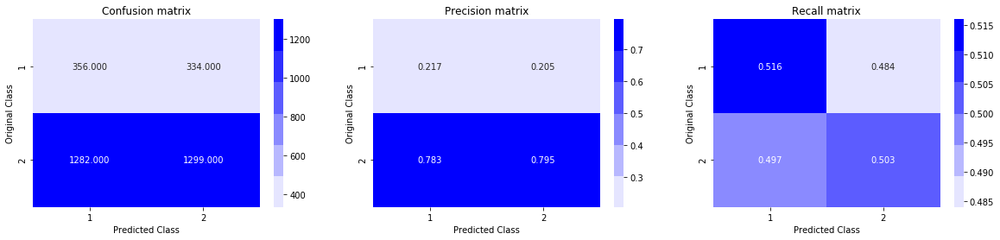

In [0]:
# we need to generate 9 numbers and the sum of numbers should be 1
# one solution is to genarate 9 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
# we create a output array that has exactly same size as the CV data
from sklearn.metrics.classification import accuracy_score, log_loss
test_len = len(y_test)
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test, predicted_y, eps=1e-15))

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

### Conclusion From Random Model 
- Log loss value is lies between o and 1
- In a Random Model we getting Log -loss of 0.90
- Our Main objective is to decrease the loss as low as possible and compulsory less than Random , as Romdom model is Considered as Worse model

<h2>Appling KNN With HyperParameter Tunning along with Calibration  </h2>

<br>Apply KNN on different kind of featurization</br> 

In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.calibration import CalibratedClassifierCV
from tqdm import tqdm
k_size = list(range(1,100,5))
for k_neighbour in k_size:
    clf = KNeighborsClassifier(n_neighbors=k_neighbour, n_jobs=-1)
    clf.fit(X_tr, y_train)
    #Using Model Calibration
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    print('For values of K = ', k_neighbour, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  1 The log loss is: 0.4652393013675358
For values of K =  6 The log loss is: 0.41282571401835955
For values of K =  11 The log loss is: 0.40278373606220524
For values of K =  16 The log loss is: 0.3972031334439632
For values of K =  21 The log loss is: 0.3925188240017866
For values of K =  26 The log loss is: 0.3881405851386035
For values of K =  31 The log loss is: 0.3862452126779247
For values of K =  36 The log loss is: 0.38566471370083244
For values of K =  41 The log loss is: 0.38360028125904644
For values of K =  46 The log loss is: 0.3840112603050892
For values of K =  51 The log loss is: 0.3836090592400853
For values of K =  56 The log loss is: 0.38362325551604476
For values of K =  61 The log loss is: 0.3823929303532775
For values of K =  66 The log loss is: 0.3835738382515291
For values of K =  71 The log loss is: 0.38218918752206044
For values of K =  76 The log loss is: 0.38188593087258704
For values of K =  81 The log loss is: 0.382491827100028
For values

<h4> Training with best hyper parameters </h4>

In [0]:
best_k = 81
#Training with best hyper parameters
clf = KNeighborsClassifier(n_neighbors=best_k, n_jobs=-1)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', best_k, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  81 The log loss is: 0.382491827100028


In [0]:
#Printing Log loss
pred_train_y = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train_y, labels=clf.classes_, eps=1e-15))
pred_cv_y = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv_y, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.3512123614908254
CV Log-Loss is 0.382491827100028


Test Log-Loss is 0.37644108107311436


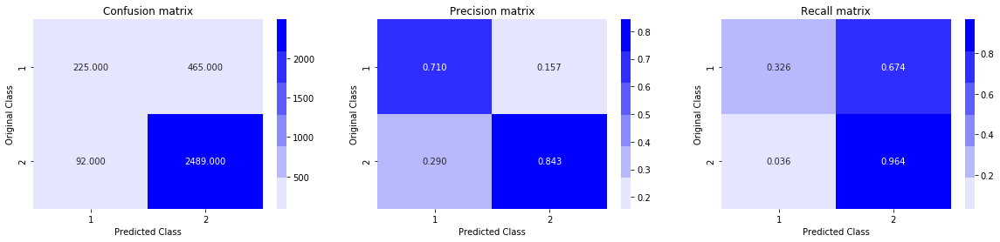

In [0]:
#Printing Test log loss
pred_test_y = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test_y,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  KNN </h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.3573
- CV Log-Loss is 0.3788
- Test Log-Loss is 0.38732
- performance of Knn is better than Random Model 

## Naive Bayes with HyperParameter Tunning along With Calibration 

In [0]:
base = 0.00000001
K=[]
for i in range(0,10):
    K.append(base*8)
    base = base*8
K

[8e-08,
 6.4e-07,
 5.12e-06,
 4.096e-05,
 0.00032768,
 0.00262144,
 0.02097152,
 0.16777216,
 1.34217728,
 10.73741824]

For values of K =  8e-08 The log loss is: 0.31430785712625126
For values of K =  6.4e-07 The log loss is: 0.3101174847114498
For values of K =  5.12e-06 The log loss is: 0.30586978755040156
For values of K =  4.096e-05 The log loss is: 0.3000117235852077
For values of K =  0.00032768 The log loss is: 0.29146939769085783
For values of K =  0.00262144 The log loss is: 0.28192782466464605
For values of K =  0.02097152 The log loss is: 0.274695448404446
For values of K =  0.16777216 The log loss is: 0.2717076573525384
For values of K =  1.34217728 The log loss is: 0.2795186488519999
For values of K =  10.73741824 The log loss is: 0.36708983545639307


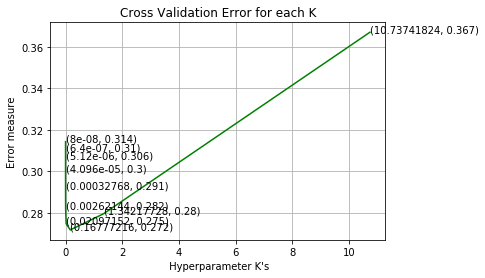

In [0]:
import matplotlib.pyplot as plt
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import roc_auc_score
log_error_array=[]

for i in K:
    naivebayes = MultinomialNB(alpha=i,class_prior=[0.5,0.5])
    naivebayes.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(naivebayes , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    naive_bayes_predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, naive_bayes_predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of K = ', i, "The log loss is:",log_loss(y_cv, naive_bayes_predict_y, labels=naivebayes.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(K, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = MultinomialNB(alpha=K[best_k])
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
naive_bayes_predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', K[best_k], "The log loss is:",log_loss(y_cv, naive_bayes_predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.16777216 The log loss is: 0.2806806734707247


In [0]:
#Printing Log loss
naive_pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, naive_pred_train, labels=clf.classes_, eps=1e-15))
naive_pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, naive_pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.23156755961898925
CV Log-Loss is 0.2806806734707247


Test Log-Loss is 0.27920067396485937


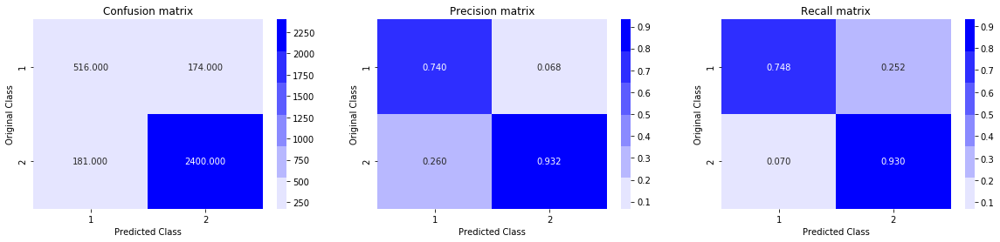

In [0]:
#Printing Test log loss
naive_pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, naive_pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(naive_pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Naive Bayes Model</h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.22
- CV Log-Loss is 0.28
- Test Log-Loss is 0.2832
- performance of Naive Bayes is better than KNN Model 
- The Difference between cn and test loss is almost same ,so we can conclude that there is no chance of Overfitting 
- We are getting Precison and Recall matrix as campared to KNN

 ## Logistic Regression with hyperparameter tuning 

For values of alpha =  1e-05 The log loss is: 0.2808372750380595
For values of alpha =  0.0001 The log loss is: 0.2671416853493271
For values of alpha =  0.001 The log loss is: 0.24808578736350484
For values of alpha =  0.01 The log loss is: 0.28278143263346955
For values of alpha =  0.1 The log loss is: 0.3472193415965513
For values of alpha =  1 The log loss is: 0.46767651063500626
For values of alpha =  10 The log loss is: 0.5015831146063408


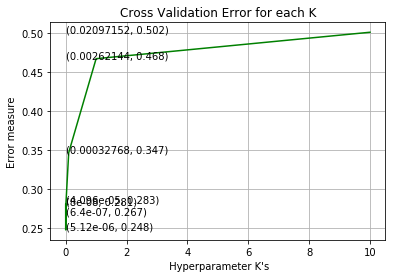

In [0]:
from sklearn.linear_model import SGDClassifier
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.


log_error_array=[]

for i in alpha:
    clf = SGDClassifier(alpha=i,penalty='l2', loss='log', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = SGDClassifier(alpha=alpha[best_k], penalty='l2', loss='log', random_state=42)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', alpha[best_k], "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.001 The log loss is: 0.24808578736350484


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.16373900847055028
CV Log-Loss is 0.24808578736350484


Test Log-Loss is 0.25772608875817665


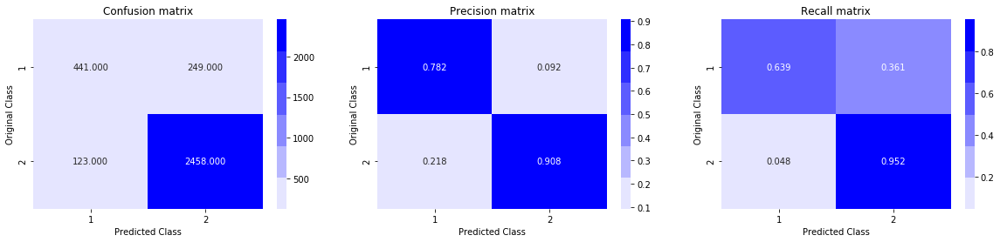

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Logistic Regression  Model</h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.1710
- CV Log-Loss is 0.2763
- Test Log-Loss is 0.2694
- performance of Naive Bayes is better than Logistic Regression 
- The Difference between train and cv loss is 0.1 it means there is slight chance of overfitting. 
- We are getting Precison and Recall matrix as campared to KNN and naive bayes

## Linear SVM with hyperparameter tuning

For values of alpha =  1e-05 The log loss is: 0.2792339020551233
For values of alpha =  0.0001 The log loss is: 0.2738666019927578
For values of alpha =  0.001 The log loss is: 0.25752974709207443
For values of alpha =  0.01 The log loss is: 0.26544137310205546
For values of alpha =  0.1 The log loss is: 0.30975734100285707
For values of alpha =  1 The log loss is: 0.47167492656864557
For values of alpha =  10 The log loss is: 0.5046489613984122


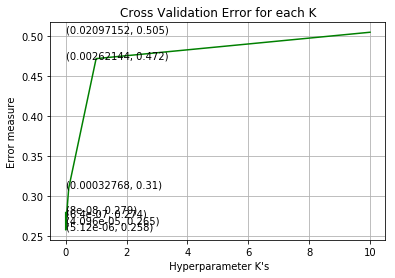

In [0]:
from sklearn.linear_model import SGDClassifier
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.


log_error_array=[]

for i in alpha:
    clf = SGDClassifier(alpha=i,penalty='l2', loss='hinge', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = SGDClassifier(alpha=alpha[best_k], penalty='l2', loss='hinge', random_state=42)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', alpha[best_k], "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.001 The log loss is: 0.25752974709207443


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.16939319849819687
CV Log-Loss is 0.25752974709207443


Test Log-Loss is 0.2677241704711804


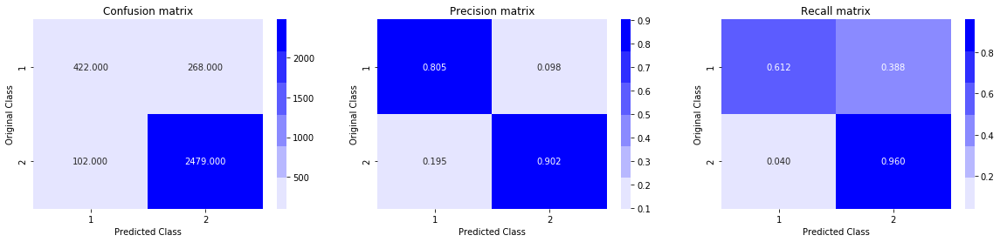

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

## Decision Tree

In [0]:
from sklearn.tree import DecisionTreeClassifier
log_error_array=[]
max_depth = list(range(1,17,3))
min_samples_split_values = list(range(2,34,5))
for depth in (max_depth):
    for min_sample in min_samples_split_values:
        clf=DecisionTreeClassifier(min_samples_split=min_sample,max_depth=depth,class_weight='balanced')
        clf.fit(X_tr, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(X_tr, y_train)
        cv_predict_y = sig_clf.predict_proba(X_cr)
        log_error_array.append(log_loss(y_cv, cv_predict_y, labels=clf.classes_, eps=1e-15))
        print ('log_loss for min_sample_split = ',min_sample,'and maxdepth =',depth,'is',log_loss(y_cv, cv_predict_y, labels=clf
                                                                                                  .classes_, eps=1e-15))



log_loss for min_sample_split =  2 and maxdepth = 1 is 0.47979644061936044
log_loss for min_sample_split =  7 and maxdepth = 1 is 0.47979644061936044
log_loss for min_sample_split =  12 and maxdepth = 1 is 0.47979644061936044
log_loss for min_sample_split =  17 and maxdepth = 1 is 0.47979644061936044
log_loss for min_sample_split =  22 and maxdepth = 1 is 0.47979644061936044
log_loss for min_sample_split =  27 and maxdepth = 1 is 0.47979644061936044
log_loss for min_sample_split =  32 and maxdepth = 1 is 0.47979644061936044
log_loss for min_sample_split =  2 and maxdepth = 4 is 0.42053214902632047
log_loss for min_sample_split =  7 and maxdepth = 4 is 0.4204978889288866
log_loss for min_sample_split =  12 and maxdepth = 4 is 0.4210584009422895
log_loss for min_sample_split =  17 and maxdepth = 4 is 0.4196717916627441
log_loss for min_sample_split =  22 and maxdepth = 4 is 0.421320264611042
log_loss for min_sample_split =  27 and maxdepth = 4 is 0.4203608232693291
log_loss for min_sampl

<h4> Best log loss we are getting at min_samples_split = 32 and  maxdepth = 13 </h4>

In [0]:
clf = DecisionTreeClassifier(min_samples_split=32,max_depth=13,class_weight='balanced')
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print ('log_loss for min_sample_split = ',32,'and maxdepth =',13,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for min_sample_split =  32 and maxdepth = 13 is 0.3686077436532265


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.30893825432604605
CV Log-Loss is 0.3686077436532265


Test Log-Loss is 0.37076972798636065


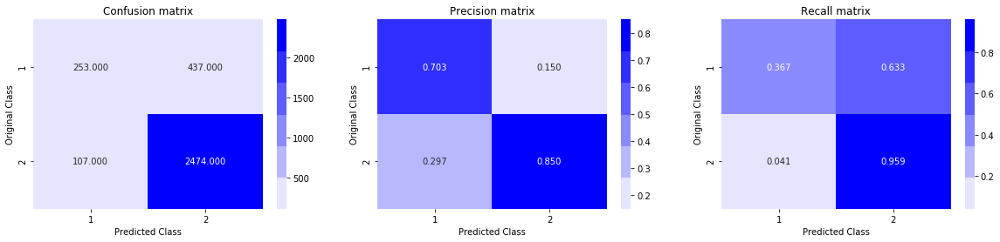

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Desion Tree Model Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.323
- CV Log-Loss is0.361
- Test Log-Loss is  0.369
- performance of Random Forest  is not very good but there is very chance of overfitting as there is very less

## XGBoost Randomised Search

In [0]:
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'max_depth': [2,3,4,5,6,7,8],
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0,3],
    'n_estimators': [5,10,50,100,200,250]}
clf = xgb.XGBClassifier(n_jobs=-1 ,eval_metric = 'logloss' ,early_stopping_rounds = 10, objective = 'binary:logistic', eta = 0.02 )
randomized_search = RandomizedSearchCV(clf, param_grid, n_iter=30,n_jobs=-1, verbose=0, cv=5,scoring='neg_log_loss', refit=False, random_state=42)

/usr/local/lib/python3.5/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [0]:
randomized_search.fit(X_tr, y_train)

[13:04:43] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:04:43] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:04:43] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. P

RandomizedSearchCV(cv=5, error_score='raise',
          estimator=XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
       colsample_bynode=None, colsample_bytree=None,
       early_stopping_rounds=10, eta=0.02, eval_metric='logloss',
       gamma=None, gpu_id=None, importance_type='gain',
       interaction_constraints=None, learning_..._pos_weight=None, subsample=None, tree_method=None,
       validate_parameters=None, verbosity=None),
          fit_params=None, iid=True, n_iter=30, n_jobs=-1,
          param_distributions={'learning_rate': [0.001, 0.01, 0.1, 0.2, 0, 3], 'max_depth': [2, 3, 4, 5, 6, 7, 8], 'n_estimators': [5, 10, 50, 100, 200, 250]},
          pre_dispatch='2*n_jobs', random_state=42, refit=False,
          return_train_score='warn', scoring='neg_log_loss', verbose=0)

In [0]:
print(randomized_search.best_params_)

{'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200}


In [0]:
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.1
params['max_depth'] = 8
params['n_estimators'] = 200

d_train = xgb.DMatrix(X_tr, label=y_train)
d_test = xgb.DMatrix(X_te, label=y_test)

watchlist = [(d_train, 'train'), (d_test, 'valid')]

bst = xgb.train(params, d_train, 400, watchlist, early_stopping_rounds=20, verbose_eval=10)

xgdmat = xgb.DMatrix(X_tr,y_train)
predict_y = bst.predict(d_test)
print("The test log loss is:",log_loss(y_test, predict_y, eps=1e-15))

[13:05:06] WARNING: /workspace/src/learner.cc:480: 
Parameters: { n_estimators } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-logloss:0.63871	valid-logloss:0.64314
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 20 rounds.
[10]	train-logloss:0.38368	valid-logloss:0.42168
[20]	train-logloss:0.29884	valid-logloss:0.34859
[30]	train-logloss:0.25697	valid-logloss:0.31473
[40]	train-logloss:0.23280	valid-logloss:0.29573
[50]	train-logloss:0.21494	valid-logloss:0.28354
[60]	train-logloss:0.20079	valid-logloss:0.27395
[70]	train-logloss:0.19037	valid-logloss:0.26723
[80]	train-logloss:0.18064	valid-logloss:0.26264
[90]	train-logloss:0.17225	valid-logloss:0.25878
[100]	train-logloss:

<h3> Conlusion from  Xgboost Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.1149
- CV Log-Loss is 0.2359
- Test Log-Loss is  0.2360
- Log loss of Random Forest is  very good  
- there is  chance of overfitting  as the difference between train and test loss is high

Total number of data points : 3271


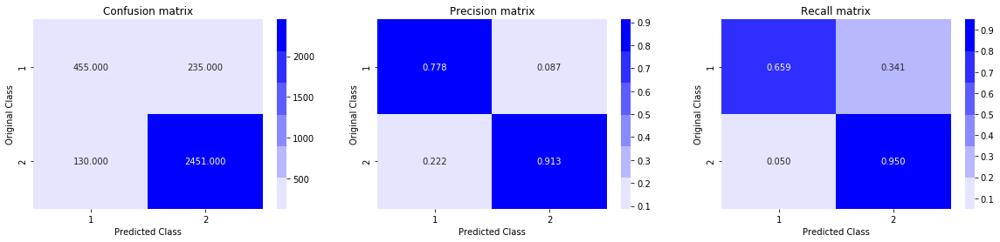

In [0]:
predicted_y =np.array(predict_y>0.5,dtype=int)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

## Random Forest with Hyper Paramter Tunning

In [0]:
from sklearn.ensemble import RandomForestClassifier
max_depth = [3, 4, 5, 6]
n_estimator = [100,150,200,250]
for depth in max_depth:
    for estimator in n_estimator:
        clf=RandomForestClassifier(n_estimators=estimator,n_jobs=-1, max_depth=depth)
        clf.fit(X_tr, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(X_tr, y_train)
        predict_y = sig_clf.predict_proba(X_cr)
        print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for n_estimator =  100 and maxdepth = 3 is 0.3317312096209339
log_loss for n_estimator =  150 and maxdepth = 3 is 0.32651899511536514
log_loss for n_estimator =  200 and maxdepth = 3 is 0.32994511983148755
log_loss for n_estimator =  250 and maxdepth = 3 is 0.32918168587945457
log_loss for n_estimator =  100 and maxdepth = 4 is 0.32920296947194444
log_loss for n_estimator =  150 and maxdepth = 4 is 0.32412109361899966
log_loss for n_estimator =  200 and maxdepth = 4 is 0.3264181195438268
log_loss for n_estimator =  250 and maxdepth = 4 is 0.3256740887930872
log_loss for n_estimator =  100 and maxdepth = 5 is 0.3203178027554142
log_loss for n_estimator =  150 and maxdepth = 5 is 0.3246943920551199
log_loss for n_estimator =  200 and maxdepth = 5 is 0.3230147480006986
log_loss for n_estimator =  250 and maxdepth = 5 is 0.3222705616950973
log_loss for n_estimator =  100 and maxdepth = 6 is 0.31856238022400685
log_loss for n_estimator =  150 and maxdepth = 6 is 0.3203123978237405


<h4> Best log loss we are getting at n_estimators = 250 and  maxdepth = 3 </h4>

In [0]:
clf = RandomForestClassifier(n_estimators=250,n_jobs=-1, max_depth=3)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print ('log_loss for n_estimators = ',250,'and maxdepth =',3,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for n_estimators =  250 and maxdepth = 3 is 0.32543098800666304


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.2919769151699735
CV Log-Loss is 0.3254309880066629


Test Log-Loss is 0.32208740428924276


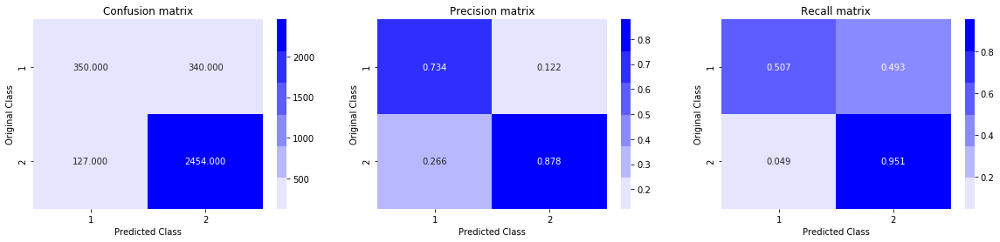

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Random Forest Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.29
- CV Log-Loss is0.31
- Test Log-Loss is  0.31
- performance of Random Forest is good as campared to decison tree.
- there is very less difference in train and cv loss so very less chance of overfitting.

## Set2 : TFIDF on Text Feature

## Bag of Words in preprocessed_review_comment_title

In [0]:
# Make Data Model Ready: encoding eassay tfidf
from sklearn.feature_extraction.text import TfidfVectorizer
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,2))
vectorizer.fit(X_train['preprocessed_review_comment_title'].values) # fit has to happen only on train data
# we use the fitted CountVectorizer to convert the text to vector
X_train_preprocessed_review_comment_title_tfidf = vectorizer.transform(X_train['preprocessed_review_comment_title'].values)
X_cv_preprocessed_review_comment_title_tfidf = vectorizer.transform(X_cv['preprocessed_review_comment_title'].values)
X_test_preprocessed_review_comment_title_tfidf = vectorizer.transform(X_test['preprocessed_review_comment_title'].values)

print("After vectorizations")
print(X_train_preprocessed_review_comment_title_tfidf.shape, y_train.shape)
print(X_cv_preprocessed_review_comment_title_tfidf.shape, y_cv.shape)
print(X_test_preprocessed_review_comment_title_tfidf.shape, y_test.shape)
print("="*100)

(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 46) (4448,)
(2192, 46) (2192,)
(3271, 46) (3271,)


In [0]:
# Make Data Model Ready: encoding eassay tfidf
from sklearn.feature_extraction.text import TfidfVectorizer

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,2))
vectorizer.fit(X_train['preprocessed_review_comment_message'].values) # fit has to happen only on train data
# we use the fitted CountVectorizer to convert the text to vector
X_train_preprocessed_review_comment_message_tfidf = vectorizer.transform(X_train['preprocessed_review_comment_message'].values)
X_cv_preprocessed_review_comment_message_tfidf = vectorizer.transform(X_cv['preprocessed_review_comment_message'].values)
X_test_preprocessed_review_comment_message_tfidf = vectorizer.transform(X_test['preprocessed_review_comment_message'].values)

print("After vectorizations")
print(X_train_preprocessed_review_comment_message_tfidf.shape, y_train.shape)
print(X_cv_preprocessed_review_comment_message_tfidf.shape, y_cv.shape)
print(X_test_preprocessed_review_comment_message_tfidf.shape, y_test.shape)
print("="*100)

(4448, 38) (4448,)
(2192, 38) (2192,)
(3271, 38) (3271,)
After vectorizations
(4448, 957) (4448,)
(2192, 957) (2192,)
(3271, 957) (3271,)


In [0]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_customer_city,X_train_customer_state ,X_train_payment_sequential,X_train_payment_type,X_train_payment_installments,X_train_product_photos_qty,X_train_seller_city,X_train_seller_state,X_train_product_category_name_english,X_train_customer_zip_code_prefix ,X_train_price,X_train_freight_value ,X_train_payment_value,X_train_seller_zip_code_prefix ,X_train_preprocessed_review_comment_title_tfidf,X_train_preprocessed_review_comment_message_tfidf )).tocsr()
X_cr = hstack((X_cv_customer_city,X_cv_customer_state ,X_cv_payment_sequential,X_cv_payment_type,X_cv_payment_installments,X_cv_product_photos_qty,X_cv_seller_city,X_cv_seller_state,X_cv_product_category_name_english,X_cv_customer_zip_code_prefix ,X_cv_price,X_cv_freight_value ,X_cv_payment_value,X_cv_seller_zip_code_prefix ,X_cv_preprocessed_review_comment_title_tfidf,X_cv_preprocessed_review_comment_message_tfidf )).tocsr()
X_te = hstack((X_test_customer_city,X_test_customer_state ,X_test_payment_sequential,X_test_payment_type,X_test_payment_installments,X_test_product_photos_qty,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,X_test_customer_zip_code_prefix ,X_test_price,X_test_freight_value ,X_test_payment_value,X_test_seller_zip_code_prefix ,X_test_preprocessed_review_comment_title_tfidf,X_test_preprocessed_review_comment_message_tfidf )).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(4448, 2561) (4448,)
(2192, 2561) (2192,)
(3271, 2561) (3271,)


<h2>Building a random model (Finding worst-case log-loss) TFIDF</h2>

Log loss on Test Data using Random Model 0.900344503108922


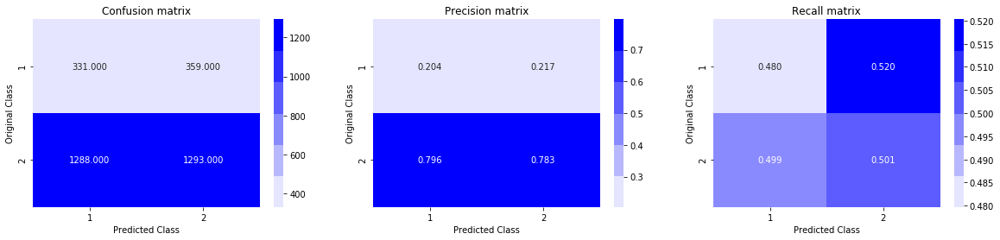

In [0]:
# we need to generate 9 numbers and the sum of numbers should be 1
# one solution is to genarate 9 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
# we create a output array that has exactly same size as the CV data
from sklearn.metrics.classification import accuracy_score, log_loss
test_len = len(y_test)
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test, predicted_y, eps=1e-15))

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

### Conclusion From Random Model 
- Log loss value is lies between o and 1
- In a Random Model we getting Log -loss of 0.91
- Our Main objective is to decrease the loss as low as possible and compulsory less than Random , as Romdom model is Considered as Worse model

<h2>Appling KNN With HyperParameter Tunning along with Calibration  </h2>

<br>Apply KNN on different kind of featurization</br> 

In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.calibration import CalibratedClassifierCV
from tqdm import tqdm
k_size = list(range(1,100,5))
for k_neighbour in k_size:
    clf = KNeighborsClassifier(n_neighbors=k_neighbour, n_jobs=-1)
    clf.fit(X_tr, y_train)
    #Using Model Calibration
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    print('For values of K = ', k_neighbour, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  1 The log loss is: 0.5034415790339758
For values of K =  6 The log loss is: 0.49001041278514473
For values of K =  11 The log loss is: 0.48234792826844375
For values of K =  16 The log loss is: 0.4766210641427991
For values of K =  21 The log loss is: 0.4751605216103367
For values of K =  26 The log loss is: 0.47385111919596595
For values of K =  31 The log loss is: 0.46737313157458865
For values of K =  36 The log loss is: 0.465171352813623
For values of K =  41 The log loss is: 0.4631922616794904
For values of K =  46 The log loss is: 0.4607310300367736
For values of K =  51 The log loss is: 0.45838542193523774
For values of K =  56 The log loss is: 0.45747188052279714
For values of K =  61 The log loss is: 0.4561623736526998
For values of K =  66 The log loss is: 0.4542390687406483
For values of K =  71 The log loss is: 0.45441372349917425
For values of K =  76 The log loss is: 0.4535635477839066
For values of K =  81 The log loss is: 0.4515865353242208
For values

<h4> Training with best hyper parameters </h4>

In [0]:
best_k = 81
#Training with best hyper parameters
clf = KNeighborsClassifier(n_neighbors=best_k, n_jobs=-1)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', best_k, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  81 The log loss is: 0.4515865353242208


In [0]:
#Printing Log loss
pred_train_y = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train_y, labels=clf.classes_, eps=1e-15))
pred_cv_y = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv_y, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.4383626541406311
CV Log-Loss is 0.4515865353242208


Test Log-Loss is 0.46044926744628933


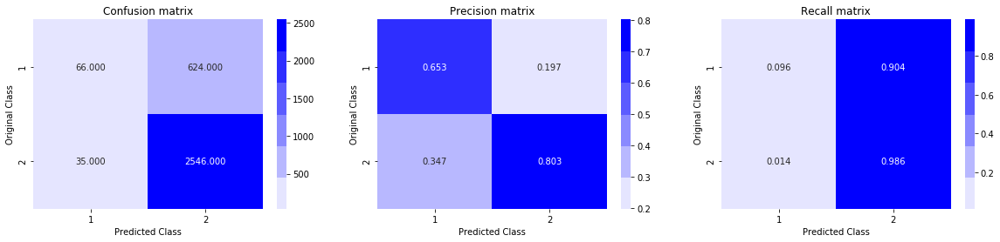

In [0]:
#Printing Test log loss
pred_test_y = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test_y,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  KNN </h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.44
- CV Log-Loss is 0.45
- Test Log-Loss is 0.45
- performance of Knn is better than Random Model 
- as there very less deifference between train error and cv error , so no chnace of overfitting

## Naive Bayes with HyperParameter Tunning along With Calibration 

In [0]:
base = 0.00000001
K=[]
for i in range(0,10):
    K.append(base*8)
    base = base*8
K

[8e-08,
 6.4e-07,
 5.12e-06,
 4.096e-05,
 0.00032768,
 0.00262144,
 0.02097152,
 0.16777216,
 1.34217728,
 10.73741824]

For values of K =  8e-08 The log loss is: 0.3270403693972494
For values of K =  6.4e-07 The log loss is: 0.3242173167765613
For values of K =  5.12e-06 The log loss is: 0.3200168151572933
For values of K =  4.096e-05 The log loss is: 0.3141989269207895
For values of K =  0.00032768 The log loss is: 0.30543162512201893
For values of K =  0.00262144 The log loss is: 0.2920058557384111
For values of K =  0.02097152 The log loss is: 0.27294050687617993
For values of K =  0.16777216 The log loss is: 0.256095480317485
For values of K =  1.34217728 The log loss is: 0.2675863978646076
For values of K =  10.73741824 The log loss is: 0.42527624066416864


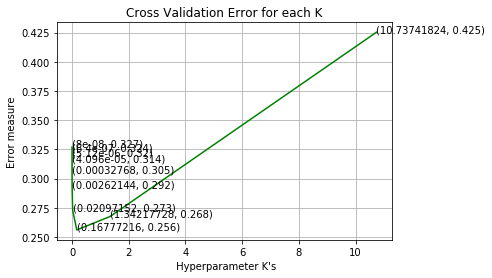

In [0]:
import matplotlib.pyplot as plt
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import roc_auc_score
log_error_array=[]

for i in K:
    naivebayes = MultinomialNB(alpha=i,class_prior=[0.5,0.5])
    naivebayes.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(naivebayes , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    naive_bayes_predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, naive_bayes_predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of K = ', i, "The log loss is:",log_loss(y_cv, naive_bayes_predict_y, labels=naivebayes.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(K, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = MultinomialNB(alpha=K[best_k])
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
naive_bayes_predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', K[best_k], "The log loss is:",log_loss(y_cv, naive_bayes_predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.16777216 The log loss is: 0.26888217606603276


In [0]:
#Printing Log loss
naive_pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, naive_pred_train, labels=clf.classes_, eps=1e-15))
naive_pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, naive_pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.18287692340772918
CV Log-Loss is 0.26888217606603276


Test Log-Loss is 0.26858665301500195


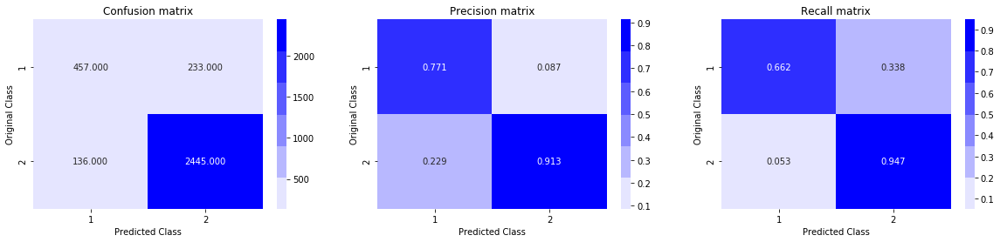

In [0]:
#Printing Test log loss
naive_pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, naive_pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(naive_pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Naive Bayes Model</h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.1635
- CV Log-Loss is 0.2394
- Test Log-Loss is 0.24
- Performance of Naive Bayes is better than KNN Model 
- The Difference between CV and test loss is 0.07 ,so We can conclude that there less chance overfitting 
- We are getting better Precison and Recall matrix as campared to KNN

 ## Logistic Regression with hyperparameter tuning 

For values of alpha =  1e-05 The log loss is: 0.2629932360245178
For values of alpha =  0.0001 The log loss is: 0.254360741099356
For values of alpha =  0.001 The log loss is: 0.2535277718854511
For values of alpha =  0.01 The log loss is: 0.2999340235855282
For values of alpha =  0.1 The log loss is: 0.47586488402605964
For values of alpha =  1 The log loss is: 0.5124555005807193
For values of alpha =  10 The log loss is: 0.5138511389885753


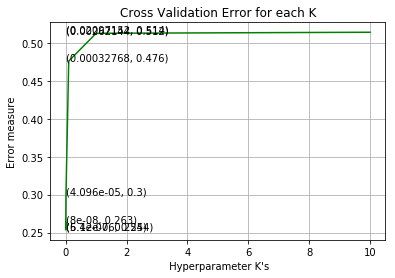

In [0]:
from sklearn.linear_model import SGDClassifier
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.


log_error_array=[]

for i in alpha:
    clf = SGDClassifier(alpha=i,penalty='l2', loss='log', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = SGDClassifier(alpha=alpha[best_k], penalty='l2', loss='log', random_state=42)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', alpha[best_k], "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.001 The log loss is: 0.2535277718854511


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.1796621974934453
CV Log-Loss is 0.2535277718854511


Test Log-Loss is 0.2562255092306477


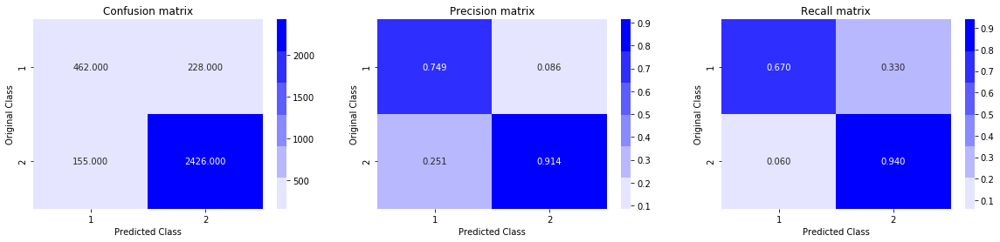

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Logistic Regression  Model</h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.1310
- CV Log-Loss is 0.25
- Test Log-Loss is 0.24
- performance of Logistic Regression is better than  KNN and Naive Bayes 
- The Difference between train and cv loss is 0.12 it means there is chance of overfitting. 
- We are getting Precison and Recall matrix as campared to KNN and naive bayes

## Linear SVM with hyperparameter tuning

For values of alpha =  1e-05 The log loss is: 0.26548060784121974
For values of alpha =  0.0001 The log loss is: 0.26585613202225156
For values of alpha =  0.001 The log loss is: 0.2546546584155308
For values of alpha =  0.01 The log loss is: 0.2697039221253631
For values of alpha =  0.1 The log loss is: 0.41463341398243797
For values of alpha =  1 The log loss is: 0.5115946461388273
For values of alpha =  10 The log loss is: 0.5139734048196096


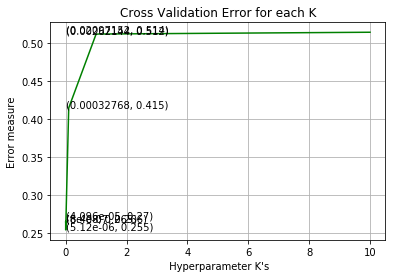

In [0]:
from sklearn.linear_model import SGDClassifier
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.


log_error_array=[]

for i in alpha:
    clf = SGDClassifier(alpha=i,penalty='l2', loss='hinge', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = SGDClassifier(alpha=alpha[best_k], penalty='l2', loss='hinge', random_state=42)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', alpha[best_k], "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.001 The log loss is: 0.2546546584155308


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.17549466059830485
CV Log-Loss is 0.2546546584155308


Test Log-Loss is 0.2571640541394271


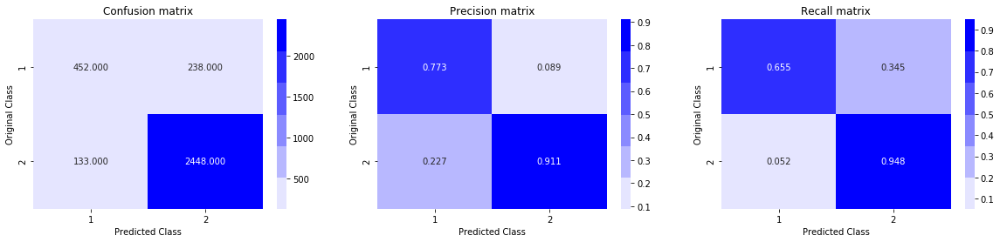

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from Linear SVM Model</h3>

- There is not very much difference between svm and logistic Regression 

## Decision Tree with Hyperparameter Tunning

In [0]:
from sklearn.tree import DecisionTreeClassifier
log_error_array=[]
max_depth = list(range(1,17,3))
min_samples_split_values = list(range(2,34,5))
for depth in (max_depth):
    for min_sample in min_samples_split_values:
        clf=DecisionTreeClassifier(min_samples_split=min_sample,max_depth=depth,class_weight='balanced')
        clf.fit(X_tr, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(X_tr, y_train)
        cv_predict_y = sig_clf.predict_proba(X_cr)
        log_error_array.append(log_loss(y_cv, cv_predict_y, labels=clf.classes_, eps=1e-15))
        print ('log_loss for min_sample_split = ',min_sample,'and maxdepth =',depth,'is',log_loss(y_cv, cv_predict_y, labels=clf
                                                                                                  .classes_, eps=1e-15))



log_loss for min_sample_split =  2 and maxdepth = 1 is 0.4888485076161299
log_loss for min_sample_split =  7 and maxdepth = 1 is 0.4888485076161299
log_loss for min_sample_split =  12 and maxdepth = 1 is 0.4888485076161299
log_loss for min_sample_split =  17 and maxdepth = 1 is 0.4888485076161299
log_loss for min_sample_split =  22 and maxdepth = 1 is 0.4888485076161299
log_loss for min_sample_split =  27 and maxdepth = 1 is 0.4888485076161299
log_loss for min_sample_split =  32 and maxdepth = 1 is 0.4888485076161299
log_loss for min_sample_split =  2 and maxdepth = 4 is 0.41716830823840045
log_loss for min_sample_split =  7 and maxdepth = 4 is 0.41757035658249037
log_loss for min_sample_split =  12 and maxdepth = 4 is 0.4168348892276315
log_loss for min_sample_split =  17 and maxdepth = 4 is 0.4162987015733154
log_loss for min_sample_split =  22 and maxdepth = 4 is 0.4176205510325024
log_loss for min_sample_split =  27 and maxdepth = 4 is 0.41867367598830935
log_loss for min_sample_sp

<h4> Best log loss we are getting at min_samples_split = 27 and  maxdepth = 16 </h4>

In [0]:
clf = DecisionTreeClassifier(min_samples_split=27 ,max_depth=16,class_weight='balanced')
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print ('log_loss for min_sample_split = ',27,'and maxdepth =',16,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for min_sample_split =  27 and maxdepth = 16 is 0.37765711563923543


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.29727889459402845
CV Log-Loss is 0.37765711563923543


Test Log-Loss is 0.38056074185263056


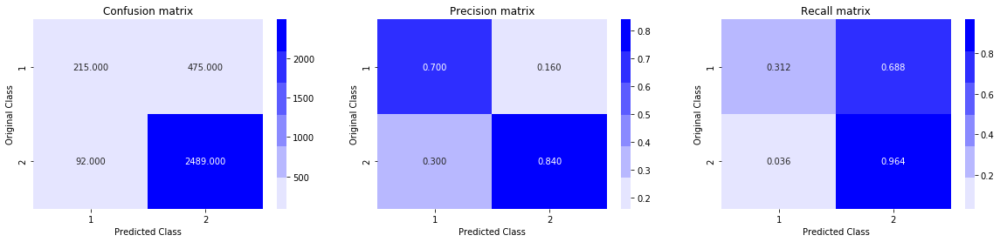

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Desion Tree Model Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.30
- CV Log-Loss is 0.361
- Test Log-Loss is  0.3662
- Log loss of Decision Tree is not very good as logistic regression and SVM.
- There is very less difference between train and CV , so very less chance of overfitting.

## XGBoost Randomised Search

In [0]:
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'max_depth': [2,3,4,5,6,7,8],
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0,3],
    'n_estimators': [5,10,50,100,200,250]}
clf = xgb.XGBClassifier(n_jobs=-1 ,eval_metric = 'logloss' ,early_stopping_rounds = 10, objective = 'binary:logistic', eta = 0.02 )
randomized_search = RandomizedSearchCV(clf, param_grid, n_iter=30,n_jobs=-1, verbose=0, cv=5,scoring='neg_log_loss', refit=False, random_state=42)

In [0]:
randomized_search.fit(X_tr, y_train)

[13:07:57] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:07:57] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.

[13:07:57] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Pl

RandomizedSearchCV(cv=5, error_score='raise',
          estimator=XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
       colsample_bynode=None, colsample_bytree=None,
       early_stopping_rounds=10, eta=0.02, eval_metric='logloss',
       gamma=None, gpu_id=None, importance_type='gain',
       interaction_constraints=None, learning_..._pos_weight=None, subsample=None, tree_method=None,
       validate_parameters=None, verbosity=None),
          fit_params=None, iid=True, n_iter=30, n_jobs=-1,
          param_distributions={'learning_rate': [0.001, 0.01, 0.1, 0.2, 0, 3], 'max_depth': [2, 3, 4, 5, 6, 7, 8], 'n_estimators': [5, 10, 50, 100, 200, 250]},
          pre_dispatch='2*n_jobs', random_state=42, refit=False,
          return_train_score='warn', scoring='neg_log_loss', verbose=0)

In [0]:
print(randomized_search.best_params_)

{'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 200}


In [0]:
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.1
params['max_depth'] = 8
params['n_estimators'] = 200

d_train = xgb.DMatrix(X_tr, label=y_train)
d_test = xgb.DMatrix(X_te, label=y_test)

watchlist = [(d_train, 'train'), (d_test, 'valid')]

bst = xgb.train(params, d_train, 400, watchlist, early_stopping_rounds=20, verbose_eval=10)

xgdmat = xgb.DMatrix(X_tr,y_train)
predict_y = bst.predict(d_test)
print("The test log loss is:",log_loss(y_test, predict_y, eps=1e-15))

[13:08:33] WARNING: /workspace/src/learner.cc:480: 
Parameters: { n_estimators } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-logloss:0.63764	valid-logloss:0.64284
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 20 rounds.
[10]	train-logloss:0.37659	valid-logloss:0.41996
[20]	train-logloss:0.29211	valid-logloss:0.34952
[30]	train-logloss:0.24901	valid-logloss:0.31707
[40]	train-logloss:0.22422	valid-logloss:0.29611
[50]	train-logloss:0.20672	valid-logloss:0.28558
[60]	train-logloss:0.19371	valid-logloss:0.27573
[70]	train-logloss:0.18176	valid-logloss:0.26924
[80]	train-logloss:0.17120	valid-logloss:0.26514
[90]	train-logloss:0.16317	valid-logloss:0.26083
[100]	train-logloss:

Total number of data points : 3271


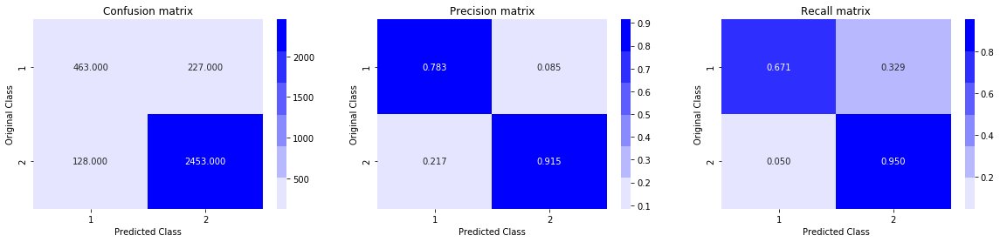

In [0]:
predicted_y =np.array(predict_y>0.5,dtype=int)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from XGboost Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.09
- CV Log-Loss is 0.23
- Test Log-Loss is  0.23
- Log loss of Decision Tree is not very good as logistic regression and SVM.
- There is very less difference between train and CV , so very less chance of overfitting.

## Random Forest with Hyper Paramter Tunning

In [0]:
from sklearn.ensemble import RandomForestClassifier
max_depth = [3, 4, 5, 6]
n_estimator = [100,150,200,250]
for depth in max_depth:
    for estimator in n_estimator:
        clf=RandomForestClassifier(n_estimators=estimator,n_jobs=-1, max_depth=depth)
        clf.fit(X_tr, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(X_tr, y_train)
        predict_y = sig_clf.predict_proba(X_cr)
        print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for n_estimator =  100 and maxdepth = 3 is 0.33034581551211056
log_loss for n_estimator =  150 and maxdepth = 3 is 0.33511927788116586
log_loss for n_estimator =  200 and maxdepth = 3 is 0.3269525928610915
log_loss for n_estimator =  250 and maxdepth = 3 is 0.32230187456955933
log_loss for n_estimator =  100 and maxdepth = 4 is 0.32133545140511627
log_loss for n_estimator =  150 and maxdepth = 4 is 0.3236554921449829
log_loss for n_estimator =  200 and maxdepth = 4 is 0.32305248139358733
log_loss for n_estimator =  250 and maxdepth = 4 is 0.3206288430303827
log_loss for n_estimator =  100 and maxdepth = 5 is 0.3251565512661494
log_loss for n_estimator =  150 and maxdepth = 5 is 0.3223629535734804
log_loss for n_estimator =  200 and maxdepth = 5 is 0.3224337312640018
log_loss for n_estimator =  250 and maxdepth = 5 is 0.320734121351875
log_loss for n_estimator =  100 and maxdepth = 6 is 0.31785210789296564
log_loss for n_estimator =  150 and maxdepth = 6 is 0.31653682603012734


<h4> Best log loss we are getting at n_estimators = 150 and maxdepth = 4 </h4>

In [0]:
clf = RandomForestClassifier(n_estimators=150,n_jobs=-1, max_depth=4)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print ('log_loss for n_estimators = ',250,'and maxdepth =',3,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for n_estimators =  250 and maxdepth = 3 is 0.3254340147199075


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.2803399923954622
CV Log-Loss is 0.3254340147199075


Test Log-Loss is 0.31993354620353803


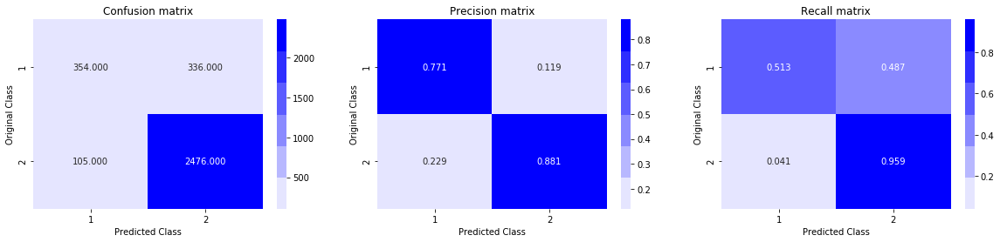

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Random Forest Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.28
- CV Log-Loss is0.316
- Test Log-Loss is  0.310
- Log Loss of Random Forest is good as campared to decison tree.
- There is very less difference in train and cv loss so very less chance of overfitting.

In [0]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectoriser","Model" ,"Hyper Parameter K or Aplha","Train_AUC","Test_AUC"]
x.add_row(["BOW", "Random","No",0.90,0.90 ])
x.add_row(["BOW", "KNN","81",0.35,0.27 ])
x.add_row(["BOW", "Naive Bayes","0.16",0.35,0.27 ])
x.add_row(["BOW", "Logistic Regression","0.001",0.17,0.26])
x.add_row(["BOW", "Linear SVM","0.001",0.36,0.25])
x.add_row(["TF-IDF", "Random","No",0.90,0.90 ])
x.add_row(["TF-IDF", "KNN","76",0.44,0.45 ])
x.add_row(["TF-IDF", "Naive Bayes","0.16",0.16,0.24 ])
x.add_row(["TF-IDF", "Logistic Regression","0.001",0.16,0.24])
x.add_row(["TF-IDF", "Linear SVM","0.001",0.13,0.24])
print(x)

+------------+---------------------+----------------------------+-----------+----------+
| Vectoriser |        Model        | Hyper Parameter K or Aplha | Train_AUC | Test_AUC |
+------------+---------------------+----------------------------+-----------+----------+
|    BOW     |        Random       |             No             |    0.9    |   0.9    |
|    BOW     |         KNN         |             81             |    0.35   |   0.27   |
|    BOW     |     Naive Bayes     |            0.16            |    0.35   |   0.27   |
|    BOW     | Logistic Regression |           0.001            |    0.17   |   0.26   |
|    BOW     |      Linear SVM     |           0.001            |    0.36   |   0.25   |
|   TF-IDF   |        Random       |             No             |    0.9    |   0.9    |
|   TF-IDF   |         KNN         |             76             |    0.44   |   0.45   |
|   TF-IDF   |     Naive Bayes     |            0.16            |    0.16   |   0.24   |
|   TF-IDF   | Logist

In [0]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectoriser","Model" ,"HyperPara-max-Depth","HyperParam-min_sample_split","n-Estomator","Train_AUC","Test_AUC"]
x.add_row(["BOW", "Decison Tree",13,32,"-----",0.32,0.36 ])
x.add_row(["BOW", "XGBoost",5,"-----",200,0.114,0.2360 ])
x.add_row(["BOW", "Random Forest",3,"-----",250,0.29,0.31 ])

x.add_row(["TF-IDF", "Decison Tree",16,27,"-----",0.30,0.36 ])
x.add_row(["TF-IDF", "XGBoost",8,"-----",200,0.09,0.2360 ])
x.add_row(["TF-IDF", "Random Forest",4,"-----",150,0.29,0.31 ])

print(x)

+------------+---------------+---------------------+-----------------------------+-------------+-----------+----------+
| Vectoriser |     Model     | HyperPara-max-Depth | HyperParam-min_sample_split | n-Estomator | Train_AUC | Test_AUC |
+------------+---------------+---------------------+-----------------------------+-------------+-----------+----------+
|    BOW     |  Decison Tree |          13         |              32             |    -----    |    0.32   |   0.36   |
|    BOW     |    XGBoost    |          5          |            -----            |     200     |   0.114   |  0.236   |
|    BOW     | Random Forest |          3          |            -----            |     250     |    0.29   |   0.31   |
|   TF-IDF   |  Decison Tree |          16         |              27             |    -----    |    0.3    |   0.36   |
|   TF-IDF   |    XGBoost    |          8          |            -----            |     200     |    0.09   |  0.236   |
|   TF-IDF   | Random Forest |          

<h1> 1 . Remove the low idf value and high idf value words from our data </h1>

In [0]:
vectorizer = TfidfVectorizer(min_df=5)
imp_tf = vectorizer.fit(X_train['preprocessed_review_comment_message'])
features = vectorizer.get_feature_names()
idf = vectorizer.idf_

In [0]:
sorted_idf_index = np.argsort(idf)[::-1]

In [0]:
df = pd.DataFrame(idf, columns= ["idf"])

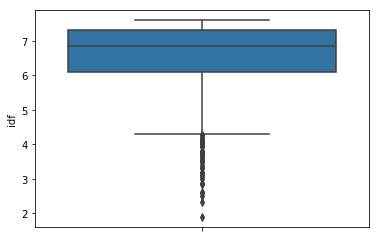

In [0]:
sns.boxplot(y = "idf", data = df )

In [0]:
df = df.sort_values(by=['idf'])

In [0]:
#https://www.geeksforgeeks.org/interquartile-range-and-quartile-deviation-using-numpy-and-scipy/
Q1 = np.percentile(df['idf'], 25, interpolation = 'midpoint')
print(Q1)
Q2 = np.percentile(df['idf'], 75, interpolation = 'midpoint')
print(Q2)

6.104597764801713
7.320993089126206


In [0]:
useless_words = []

for val in tqdm(sorted_idf_index):
  if idf[val] < Q1 or idf[val]>Q2:
    useless_words.append(features[val])


100%|██████████| 958/958 [00:00<00:00, 668910.14it/s]


In [0]:
useless_words[:20]

['ximo',
 'iguais',
 'medidas',
 'maravilha',
 'manta',
 'machucado',
 'lixo',
 'liguei',
 'levou',
 'kraft',
 'kits',
 'insatisfeita',
 'in',
 'impressora',
 'ideal',
 'enquanto',
 'hp',
 'hj',
 'grato',
 'gente']

In [0]:
def getImportantWords(sentences):
  usefullWordsSentence = []
  for sent in tqdm(sentences):
    sent = ' '.join(e for e in sent.split() if e not in useless_words)
    usefullWordsSentence.append(sent)
  return usefullWordsSentence

In [0]:
review_message_imp_words_train = getImportantWords(X_train['preprocessed_review_comment_message'])
review_message_imp_words_cv = getImportantWords(X_cv['preprocessed_review_comment_message'])
review_message_imp_words_test = getImportantWords(X_test['preprocessed_review_comment_message'])

100%|██████████| 3271/3271 [00:00<00:00, 10557.91it/s]


In [0]:
# prepare tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
t = Tokenizer()
t.fit_on_texts(review_message_imp_words_train)
vocab_size = len(t.word_index) + 1
# integer encode the documents
encoded_docs = t.texts_to_sequences(review_message_imp_words_train)
print(encoded_docs[:20])
# pad documents to a max length of 100 words
max_length = 200
padded_docs_imp_train = pad_sequences(encoded_docs, maxlen=max_length, padding='pre')
print(padded_docs_imp_train.shape)
# load the whole embedding into memory

Using TensorFlow backend.


[[3], [], [1, 1778, 1054, 4, 1], [311, 1779, 344, 281], [1, 6], [4, 1, 540, 733, 389, 145, 462, 1780, 541, 1781, 30, 345, 1055, 2, 1782], [3, 2, 1], [1783], [2], [5, 1784, 1056, 2, 1785, 98, 1786, 5, 1, 1057], [282], [542, 2, 312, 1058, 99, 1, 283, 1787, 1, 2, 9, 17, 2, 346, 11], [1, 2, 1], [1], [313], [2], [], [], [2, 463], [4, 1, 1]]
(4448, 200)


In [0]:
encoded_docs = t.texts_to_sequences(review_message_imp_words_cv)
padded_docs_imp_cv = pad_sequences(encoded_docs, maxlen=max_length, padding='pre')
print(padded_docs_imp_cv.shape)

(2192, 200)


In [0]:
encoded_docs = t.texts_to_sequences(review_message_imp_words_test)
padded_docs_imp_test = pad_sequences(encoded_docs, maxlen=max_length, padding='pre')
print(padded_docs_imp_test.shape)

(3271, 200)


In [0]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_customer_city,X_train_customer_state ,X_train_payment_sequential,X_train_payment_type,X_train_payment_installments,X_train_product_photos_qty,X_train_seller_city,X_train_seller_state,X_train_product_category_name_english,X_train_customer_zip_code_prefix ,X_train_price,X_train_freight_value ,X_train_payment_value,X_train_seller_zip_code_prefix  ,padded_docs_imp_train)).tocsr()
X_cr = hstack((X_cv_customer_city,X_cv_customer_state ,X_cv_payment_sequential,X_cv_payment_type,X_cv_payment_installments,X_cv_product_photos_qty,X_cv_seller_city,X_cv_seller_state,X_cv_product_category_name_english,X_cv_customer_zip_code_prefix ,X_cv_price,X_cv_freight_value ,X_cv_payment_value,X_cv_seller_zip_code_prefix  ,padded_docs_imp_cv)).tocsr()
X_te = hstack((X_test_customer_city,X_test_customer_state ,X_test_payment_sequential,X_test_payment_type,X_test_payment_installments,X_test_product_photos_qty,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,X_test_customer_zip_code_prefix ,X_test_price,X_test_freight_value ,X_test_payment_value,X_test_seller_zip_code_prefix  ,padded_docs_imp_test)).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(4448, 1758) (4448,)
(2192, 1758) (2192,)
(3271, 1758) (3271,)


<h2>Appling KNN With HyperParameter Tunning along with Calibration  </h2>

<br>Apply KNN on different kind of featurization</br> 

In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.calibration import CalibratedClassifierCV
from tqdm import tqdm
k_size = list(range(1,100,5))
for k_neighbour in k_size:
    clf = KNeighborsClassifier(n_neighbors=k_neighbour, n_jobs=-1)
    clf.fit(X_tr, y_train)
    #Using Model Calibration
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    print('For values of K = ', k_neighbour, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  1 The log loss is: 0.4794932166440381
For values of K =  6 The log loss is: 0.45752934618777674
For values of K =  11 The log loss is: 0.45041889463183
For values of K =  16 The log loss is: 0.44989175099399736
For values of K =  21 The log loss is: 0.4501108382939094
For values of K =  26 The log loss is: 0.44812158545425224
For values of K =  31 The log loss is: 0.44774167109310803
For values of K =  36 The log loss is: 0.44739229204014763
For values of K =  41 The log loss is: 0.4478480960830313
For values of K =  46 The log loss is: 0.44809069715431765
For values of K =  51 The log loss is: 0.4482956877887076
For values of K =  56 The log loss is: 0.44920411308711755
For values of K =  61 The log loss is: 0.4497917084706739
For values of K =  66 The log loss is: 0.4504567464167582
For values of K =  71 The log loss is: 0.4507812125371225
For values of K =  76 The log loss is: 0.4515040402021946
For values of K =  81 The log loss is: 0.45242196177881283
For values

In [0]:
best_k = 16
#Training with best hyper parameters
clf = KNeighborsClassifier(n_neighbors=best_k, n_jobs=-1)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', best_k, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  16 The log loss is: 0.44989175099399736


In [0]:
#Printing Log loss
pred_train_y = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train_y, labels=clf.classes_, eps=1e-15))
pred_cv_y = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv_y, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.4057519748079457
CV Log-Loss is 0.44989175099399736


Test Log-Loss is 0.4376351195407731


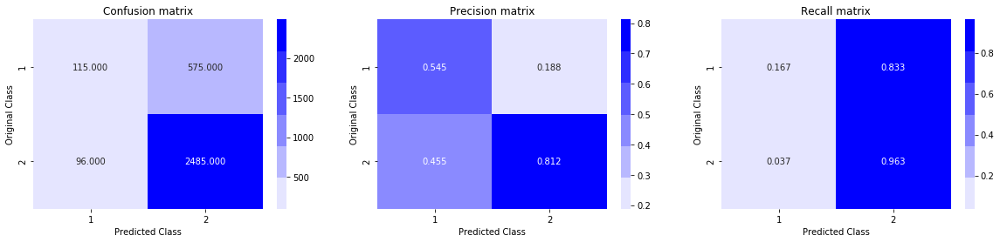

In [0]:
#Printing Test log loss
pred_test_y = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test_y,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  KNN </h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.41
- CV Log-Loss is 0.44
- Test Log-Loss is 0.44
- performance of Knn is better than Random Model 

## Naive Bayes with HyperParameter Tunning along With Calibration 

In [0]:
base = 0.00000001
K=[]
for i in range(0,10):
    K.append(base*8)
    base = base*8
K

[8e-08,
 6.4e-07,
 5.12e-06,
 4.096e-05,
 0.00032768,
 0.00262144,
 0.02097152,
 0.16777216,
 1.34217728,
 10.73741824]

For values of K =  8e-08 The log loss is: 0.4895293626909939
For values of K =  6.4e-07 The log loss is: 0.489324015183319
For values of K =  5.12e-06 The log loss is: 0.48887412758437676
For values of K =  4.096e-05 The log loss is: 0.4878968146546895
For values of K =  0.00032768 The log loss is: 0.48672992003320564
For values of K =  0.00262144 The log loss is: 0.48595667149351285
For values of K =  0.02097152 The log loss is: 0.48561441338697925
For values of K =  0.16777216 The log loss is: 0.4856540495669108
For values of K =  1.34217728 The log loss is: 0.48573185620280984
For values of K =  10.73741824 The log loss is: 0.4857740589864749


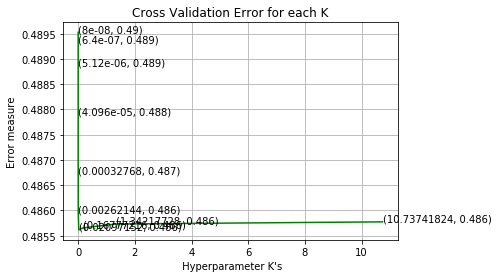

In [0]:
import matplotlib.pyplot as plt
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import roc_auc_score
log_error_array=[]

for i in K:
    naivebayes = MultinomialNB(alpha=i,class_prior=[0.5,0.5])
    naivebayes.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(naivebayes , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    naive_bayes_predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, naive_bayes_predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of K = ', i, "The log loss is:",log_loss(y_cv, naive_bayes_predict_y, labels=naivebayes.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(K, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = MultinomialNB(alpha=K[best_k])
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
naive_bayes_predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', K[best_k], "The log loss is:",log_loss(y_cv, naive_bayes_predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.02097152 The log loss is: 0.4853435097439474


In [0]:
#Printing Log loss
naive_pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, naive_pred_train, labels=clf.classes_, eps=1e-15))
naive_pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, naive_pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.46532649239888346
CV Log-Loss is 0.4853435097439474


Test Log-Loss is 0.47052531108393936


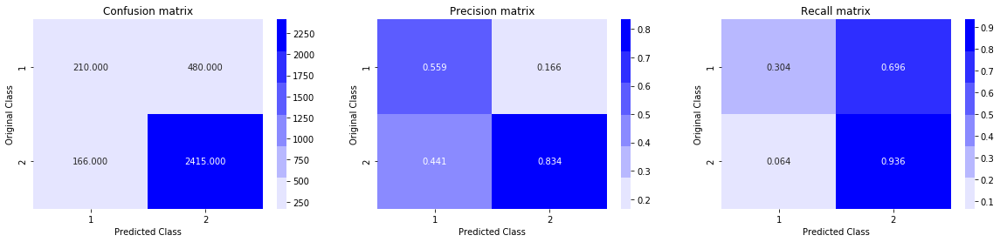

In [0]:
#Printing Test log loss
naive_pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, naive_pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(naive_pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Naive Bayes Model</h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.46
- CV Log-Loss is 0.47
- Test Log-Loss is 0.48
- performance of Naive Bayes is worsr than KNN Model 
- The Difference between cn and test loss is almost same ,so we can conclude that there is no chance of Overfitting 
- We are getting Precison and Recall matrix 

 ## Logistic Regression with hyperparameter tuning 

For values of alpha =  1e-05 The log loss is: 0.5149719498355062
For values of alpha =  0.0001 The log loss is: 0.5149719498355062
For values of alpha =  0.001 The log loss is: 0.5149719498355062
For values of alpha =  0.01 The log loss is: 0.5111431482474361
For values of alpha =  0.1 The log loss is: 0.5127272160792266
For values of alpha =  1 The log loss is: 0.5088823281260928
For values of alpha =  10 The log loss is: 0.5098627038390389


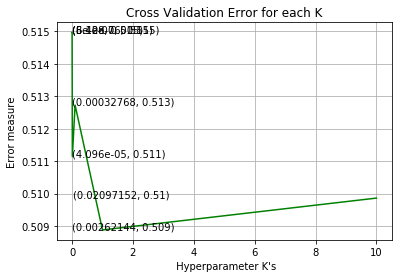

In [0]:
from sklearn.linear_model import SGDClassifier
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.


log_error_array=[]

for i in alpha:
    clf = SGDClassifier(alpha=i,penalty='l2', loss='log', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = SGDClassifier(alpha=alpha[best_k], penalty='l2', loss='log', random_state=42)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', alpha[best_k], "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  1 The log loss is: 0.5088823281260928


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.5002224382100326
CV Log-Loss is 0.5088823281260928


Test Log-Loss is 0.5067198080336024


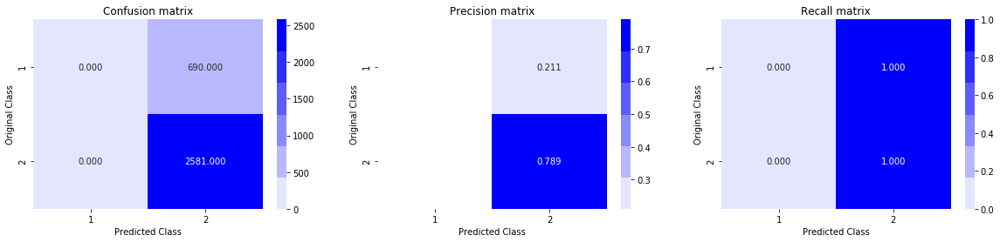

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Logistic Regression  Model</h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.5038
- CV Log-Loss is 0.5025
- Test Log-Loss is 0.5138
- performance of Naive Bayes is better than Logistic Regression 
- The Difference between train and cv loss issame  it means there is no  chance of overfitting. 

## Linear SVM with hyperparameter tuning

For values of alpha =  1e-05 The log loss is: 0.5149719498355062
For values of alpha =  0.0001 The log loss is: 0.5149719498355062
For values of alpha =  0.001 The log loss is: 0.5149719498355062
For values of alpha =  0.01 The log loss is: 0.5149719498355062
For values of alpha =  0.1 The log loss is: 0.5091770066455127
For values of alpha =  1 The log loss is: 0.5109710704270998
For values of alpha =  10 The log loss is: 0.5108802447400563


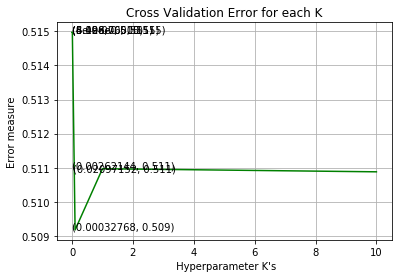

In [0]:
from sklearn.linear_model import SGDClassifier
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.


log_error_array=[]

for i in alpha:
    clf = SGDClassifier(alpha=i,penalty='l2', loss='hinge', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = SGDClassifier(alpha=alpha[best_k], penalty='l2', loss='hinge', random_state=42)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', alpha[best_k], "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.1 The log loss is: 0.5091770066455127


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.5017121619277729
CV Log-Loss is 0.5091770066455127


Test Log-Loss is 0.5067171774657012


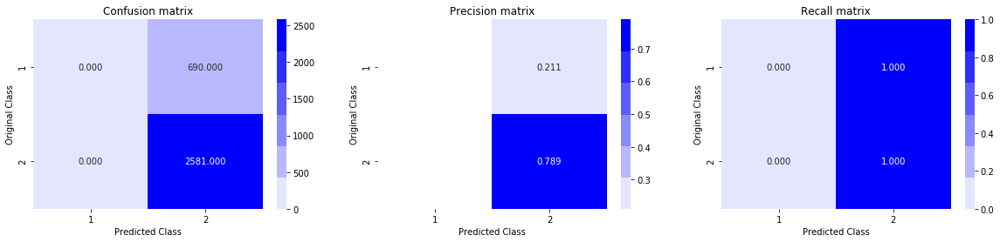

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

## Decision Tree

In [0]:
from sklearn.tree import DecisionTreeClassifier
log_error_array=[]
max_depth = list(range(1,17,3))
min_samples_split_values = list(range(2,34,5))
for depth in (max_depth):
    for min_sample in min_samples_split_values:
        clf=DecisionTreeClassifier(min_samples_split=min_sample,max_depth=depth,class_weight='balanced')
        clf.fit(X_tr, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(X_tr, y_train)
        cv_predict_y = sig_clf.predict_proba(X_cr)
        log_error_array.append(log_loss(y_cv, cv_predict_y, labels=clf.classes_, eps=1e-15))
        print ('log_loss for min_sample_split = ',min_sample,'and maxdepth =',depth,'is',log_loss(y_cv, cv_predict_y, labels=clf
                                                                                                  .classes_, eps=1e-15))



log_loss for min_sample_split =  2 and maxdepth = 1 is 0.43485793226314917
log_loss for min_sample_split =  7 and maxdepth = 1 is 0.43485793226314917
log_loss for min_sample_split =  12 and maxdepth = 1 is 0.43485793226314917
log_loss for min_sample_split =  17 and maxdepth = 1 is 0.43485793226314917
log_loss for min_sample_split =  22 and maxdepth = 1 is 0.43485793226314917
log_loss for min_sample_split =  27 and maxdepth = 1 is 0.43485793226314917
log_loss for min_sample_split =  32 and maxdepth = 1 is 0.43485793226314917
log_loss for min_sample_split =  2 and maxdepth = 4 is 0.4265157567084325
log_loss for min_sample_split =  7 and maxdepth = 4 is 0.4265157567084325
log_loss for min_sample_split =  12 and maxdepth = 4 is 0.4265157567084325
log_loss for min_sample_split =  17 and maxdepth = 4 is 0.42573368938088424
log_loss for min_sample_split =  22 and maxdepth = 4 is 0.42573368938088424
log_loss for min_sample_split =  27 and maxdepth = 4 is 0.42573368938088424
log_loss for min_sa

<h4> Best log loss we are getting at min_samples_split = 32 and  maxdepth = 4 </h4>

In [0]:
clf = DecisionTreeClassifier(min_samples_split=32,max_depth=4,class_weight='balanced')
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print ('log_loss for min_sample_split = ',32,'and maxdepth =',13,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for min_sample_split =  32 and maxdepth = 13 is 0.42573368938088424


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.3955913533150024
CV Log-Loss is 0.42573368938088424


Test Log-Loss is 0.4122057651459766


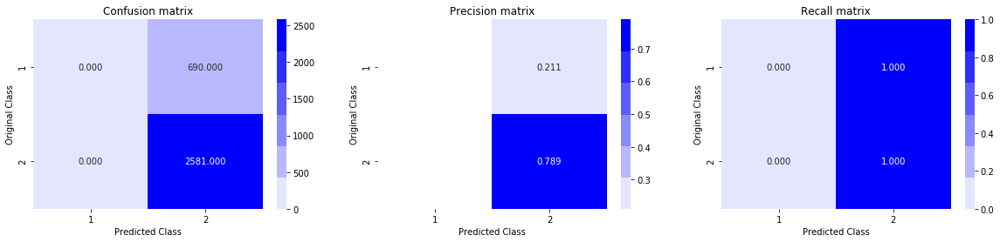

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Desion Tree Model Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.28
- CV Log-Loss is0.40
- Test Log-Loss is  0.41
- Log loss of Random Forest is low as campared to knn,naive bayes ,Logistic regression , SVM

## XGBoost Randomised Search

In [0]:
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'max_depth': [2,3,4,5,6,7,8],
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0,3],
    'n_estimators': [5,10,50,100,200,250]}
clf = xgb.XGBClassifier(n_jobs=-1 ,eval_metric = 'logloss' ,early_stopping_rounds = 10, objective = 'binary:logistic', eta = 0.02 )
randomized_search = RandomizedSearchCV(clf, param_grid, n_iter=30,n_jobs=-1, verbose=0, cv=5,scoring='neg_log_loss', refit=False, random_state=42)

In [0]:
randomized_search.fit(X_tr, y_train)

[13:11:32] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.

[13:11:32] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.



[13:11:32] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. P

RandomizedSearchCV(cv=5, error_score='raise',
          estimator=XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
       colsample_bynode=None, colsample_bytree=None,
       early_stopping_rounds=10, eta=0.02, eval_metric='logloss',
       gamma=None, gpu_id=None, importance_type='gain',
       interaction_constraints=None, learning_..._pos_weight=None, subsample=None, tree_method=None,
       validate_parameters=None, verbosity=None),
          fit_params=None, iid=True, n_iter=30, n_jobs=-1,
          param_distributions={'learning_rate': [0.001, 0.01, 0.1, 0.2, 0, 3], 'max_depth': [2, 3, 4, 5, 6, 7, 8], 'n_estimators': [5, 10, 50, 100, 200, 250]},
          pre_dispatch='2*n_jobs', random_state=42, refit=False,
          return_train_score='warn', scoring='neg_log_loss', verbose=0)

In [0]:
print(randomized_search.best_params_)

{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100}


In [0]:
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.1
params['max_depth'] = 6
params['n_estimators'] = 100

d_train = xgb.DMatrix(X_tr, label=y_train)
d_test = xgb.DMatrix(X_te, label=y_test)

watchlist = [(d_train, 'train'), (d_test, 'valid')]

bst = xgb.train(params, d_train, 400, watchlist, early_stopping_rounds=20, verbose_eval=10)

xgdmat = xgb.DMatrix(X_tr,y_train)
predict_y = bst.predict(d_test)
print("The test log loss is:",log_loss(y_test, predict_y, eps=1e-15))

[13:11:56] WARNING: /workspace/src/learner.cc:480: 
Parameters: { n_estimators } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-logloss:0.64085	valid-logloss:0.64558
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 20 rounds.
[10]	train-logloss:0.39676	valid-logloss:0.44289
[20]	train-logloss:0.32309	valid-logloss:0.40010
[30]	train-logloss:0.28574	valid-logloss:0.38949
[40]	train-logloss:0.26918	valid-logloss:0.38693
[50]	train-logloss:0.25666	valid-logloss:0.38799
[60]	train-logloss:0.24344	valid-logloss:0.38770
Stopping. Best iteration:
[42]	train-logloss:0.26631	valid-logloss:0.38675

The test log loss is: 0.3879584188822763


Total number of data points : 3271


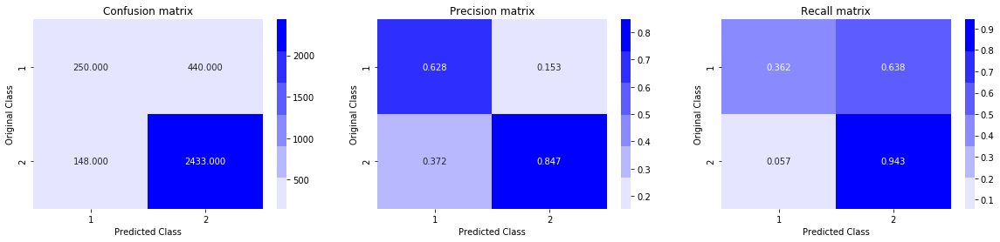

In [0]:
predicted_y =np.array(predict_y>0.5,dtype=int)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from XGboost Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.24
- CV Log-Loss is 0.39
- Test Log-Loss is  0.40
- Log loss of XGBoost is  very good as logistic regression,KNN,Naive Bayes and SVM etc.
- There is very less difference between train and CV , so very less chance of overfitting.

## Random Forest with Hyper Paramter Tunning

In [0]:
from sklearn.ensemble import RandomForestClassifier
max_depth = [3, 4, 5, 6]
n_estimator = [100,150,200,250]
for depth in max_depth:
    for estimator in n_estimator:
        clf=RandomForestClassifier(n_estimators=estimator,n_jobs=-1, max_depth=depth)
        clf.fit(X_tr, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(X_tr, y_train)
        predict_y = sig_clf.predict_proba(X_cr)
        print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for n_estimator =  100 and maxdepth = 3 is 0.4392196893149102
log_loss for n_estimator =  150 and maxdepth = 3 is 0.4382661198712692
log_loss for n_estimator =  200 and maxdepth = 3 is 0.4411413468774835
log_loss for n_estimator =  250 and maxdepth = 3 is 0.4379260499005662
log_loss for n_estimator =  100 and maxdepth = 4 is 0.43830356701227147
log_loss for n_estimator =  150 and maxdepth = 4 is 0.43954087241469303
log_loss for n_estimator =  200 and maxdepth = 4 is 0.4380414283299384
log_loss for n_estimator =  250 and maxdepth = 4 is 0.4380417304916183
log_loss for n_estimator =  100 and maxdepth = 5 is 0.4377938148369565
log_loss for n_estimator =  150 and maxdepth = 5 is 0.43749157724577303
log_loss for n_estimator =  200 and maxdepth = 5 is 0.43567555490680415
log_loss for n_estimator =  250 and maxdepth = 5 is 0.4369635968368601
log_loss for n_estimator =  100 and maxdepth = 6 is 0.4360002317165867
log_loss for n_estimator =  150 and maxdepth = 6 is 0.4349490608764906
lo

<h4> Best log loss we are getting at n_estimators = 150 and maxdepth = 4 </h4>

In [0]:
clf = RandomForestClassifier(n_estimators=150,n_jobs=-1, max_depth=4)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print ('log_loss for n_estimators = ',250,'and maxdepth =',3,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for n_estimators =  250 and maxdepth = 3 is 0.43725052421731164


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.41641094927674593
CV Log-Loss is 0.4372505242173117


Test Log-Loss is 0.4177358864292773


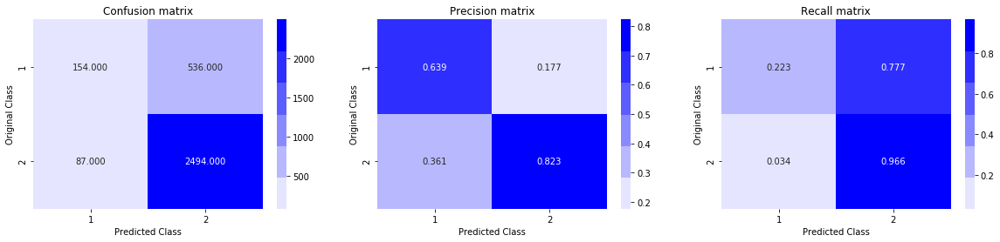

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Random Forest Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.41
- CV Log-Loss is0.42
- Test Log-Loss is  0.43
- Log Loss of Random Forest is good as campared to decison tree.
- There is very less difference in train and cv loss so very less chance of overfitting.

<h1> 2. FastText Text Vector </h1>

In [0]:
import fasttext.util

In [0]:
ft = fasttext.load_model('cc.pt.300.bin')

In [0]:
glove_words =  set(ft.words)

<h2> Fastext Vector preprocessed_review_comment_message </h2> 

In [0]:
# average Fastext Vector
# compute average Fastext for each preprocessed_review_comment_message
fasttext_review_comment_vectors_train = []; # the avg-fastext for each preprocessed_review_comment_message is stored in this list
for sentence in tqdm(X_train['preprocessed_review_comment_message']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the preprocessed_review_comment_message
    for word in sentence.split(): # for each word in a preprocessed_review_comment_message
        if word in glove_words:
            vector += ft[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    fasttext_review_comment_vectors_train.append(vector)

print(len(fasttext_review_comment_vectors_train))
print(len(fasttext_review_comment_vectors_train[0]))

100%|██████████| 4448/4448 [00:00<00:00, 6022.66it/s]

4448
300


In [0]:
# average Fastext Vector
# compute average Fastext for each preprocessed_review_comment_message
fasttext_review_comment_vectors_cv = []; # the avg-fastext for each preprocessed_review_comment_message is stored in this list
for sentence in tqdm(X_cv['preprocessed_review_comment_message']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the preprocessed_review_comment_message
    for word in sentence.split(): # for each word in a preprocessed_review_comment_message
        if word in glove_words:
            vector += ft[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    fasttext_review_comment_vectors_cv.append(vector)

print(len(fasttext_review_comment_vectors_cv))
print(len(fasttext_review_comment_vectors_cv[0]))

100%|██████████| 2192/2192 [00:00<00:00, 6296.37it/s]

2192
300


In [0]:
# average Fastext Vector
# compute average Fastext for each preprocessed_review_comment_message
fasttext_review_comment_vectors_test = []; # the avg-fastext for each preprocessed_review_comment_message is stored in this list
for sentence in tqdm(X_test['preprocessed_review_comment_message']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the preprocessed_review_comment_message
    for word in sentence.split(): # for each word in a preprocessed_review_comment_message
        if word in glove_words:
            vector += ft[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    fasttext_review_comment_vectors_test.append(vector)

print(len(fasttext_review_comment_vectors_test))
print(len(fasttext_review_comment_vectors_test[0]))

100%|██████████| 3271/3271 [00:00<00:00, 6030.85it/s]

3271
300


<h2> Fastext Vector preprocessed_review_comment_title </h2> 

In [0]:
# average Fastext Vector
# compute average Fastext for each preprocessed_review_comment_message
fasttext_review_title_vectors_train = []; # the avg-fastext for each preprocessed_review_comment_message is stored in this list
for sentence in tqdm(X_train['preprocessed_review_comment_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the preprocessed_review_comment_message
    for word in sentence.split(): # for each word in a preprocessed_review_comment_message
        if word in glove_words:
            vector += ft[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    fasttext_review_title_vectors_train.append(vector)

print(len(fasttext_review_title_vectors_train))
print(len(fasttext_review_title_vectors_train[0]))

100%|██████████| 4448/4448 [00:00<00:00, 88265.63it/s]

4448
300


In [0]:
# average Fastext Vector
# compute average Fastext for each preprocessed_review_comment_message
fasttext_review_title_vectors_cv = []; # the avg-fastext for each preprocessed_review_comment_message is stored in this list
for sentence in tqdm(X_cv['preprocessed_review_comment_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the preprocessed_review_comment_message
    for word in sentence.split(): # for each word in a preprocessed_review_comment_message
        if word in glove_words:
            vector += ft[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    fasttext_review_title_vectors_cv.append(vector)

print(len(fasttext_review_title_vectors_cv))
print(len(fasttext_review_title_vectors_cv[0]))

100%|██████████| 2192/2192 [00:00<00:00, 88879.90it/s]

2192
300


In [0]:
# average Fastext Vector
# compute average Fastext for each preprocessed_review_comment_message
fasttext_review_title_vectors_test = []; # the avg-fastext for each preprocessed_review_comment_message is stored in this list
for sentence in tqdm(X_test['preprocessed_review_comment_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the preprocessed_review_comment_message
    for word in sentence.split(): # for each word in a preprocessed_review_comment_message
        if word in glove_words:
            vector += ft[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    fasttext_review_title_vectors_test.append(vector)

print(len(fasttext_review_title_vectors_test))
print(len(fasttext_review_title_vectors_test[0]))

100%|██████████| 3271/3271 [00:00<00:00, 90404.85it/s]

3271
300


In [0]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_customer_city,X_train_customer_state ,X_train_payment_sequential,X_train_payment_type,X_train_payment_installments,X_train_product_photos_qty,X_train_seller_city,X_train_seller_state,X_train_product_category_name_english,X_train_customer_zip_code_prefix ,X_train_price,X_train_freight_value ,X_train_payment_value,X_train_seller_zip_code_prefix ,fasttext_review_comment_vectors_train,fasttext_review_title_vectors_train )).tocsr()
X_cr = hstack((X_cv_customer_city,X_cv_customer_state ,X_cv_payment_sequential,X_cv_payment_type,X_cv_payment_installments,X_cv_product_photos_qty,X_cv_seller_city,X_cv_seller_state,X_cv_product_category_name_english,X_cv_customer_zip_code_prefix ,X_cv_price,X_cv_freight_value ,X_cv_payment_value,X_cv_seller_zip_code_prefix ,fasttext_review_comment_vectors_cv,fasttext_review_title_vectors_cv )).tocsr()
X_te = hstack((X_test_customer_city,X_test_customer_state ,X_test_payment_sequential,X_test_payment_type,X_test_payment_installments,X_test_product_photos_qty,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,X_test_customer_zip_code_prefix ,X_test_price,X_test_freight_value ,X_test_payment_value,X_test_seller_zip_code_prefix,fasttext_review_title_vectors_test,fasttext_review_comment_vectors_test )).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(4448, 2158) (4448,)
(2192, 2158) (2192,)
(3271, 2158) (3271,)


In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.calibration import CalibratedClassifierCV
from tqdm import tqdm
k_size = list(range(1,100,10))
for k_neighbour in k_size:
    clf = KNeighborsClassifier(n_neighbors=k_neighbour, n_jobs=-1)
    clf.fit(X_tr, y_train)
    #Using Model Calibration
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr, y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    print('For values of K = ', k_neighbour, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  1 The log loss is: 0.5023698372898524
For values of K =  11 The log loss is: 0.47524527108689957
For values of K =  21 The log loss is: 0.4705468470461084
For values of K =  31 The log loss is: 0.4652783702255174
For values of K =  41 The log loss is: 0.46288622804339624
For values of K =  51 The log loss is: 0.45906646202861
For values of K =  61 The log loss is: 0.45710365117685686
For values of K =  71 The log loss is: 0.45683197628955896
For values of K =  81 The log loss is: 0.4566431347799704
For values of K =  91 The log loss is: 0.45426325534612494


In [0]:
best_k = 41
#Training with best hyper parameters
clf = KNeighborsClassifier(n_neighbors=best_k, n_jobs=-1)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', best_k, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  41 The log loss is: 0.46288622804339624


In [0]:
#Printing Log loss
pred_train_y = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train_y, labels=clf.classes_, eps=1e-15))
pred_cv_y = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv_y, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.43837771083750604
CV Log-Loss is 0.46288622804339624


Test Log-Loss is 0.512528686293131


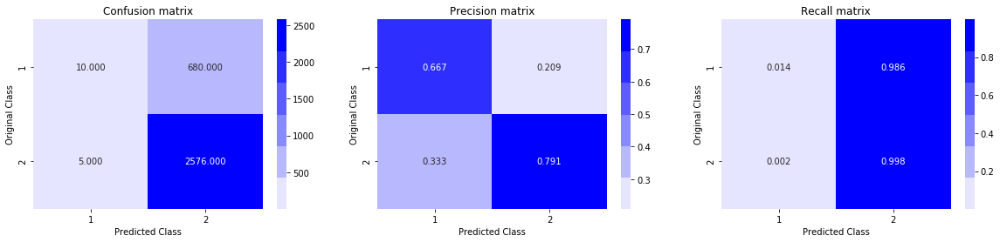

In [0]:
#Printing Test log loss
pred_test_y = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test_y,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  KNN </h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.44
- CV Log-Loss is 0.46
- Test Log-Loss is 0.51
- performance of Knn is better than Random Model 

 ## Logistic Regression with hyperparameter tuning 

For values of alpha =  1e-05 The log loss is: 0.32377377735481067
For values of alpha =  0.0001 The log loss is: 0.3137537795789457
For values of alpha =  0.001 The log loss is: 0.3132315741231221
For values of alpha =  0.01 The log loss is: 0.3629158994931905
For values of alpha =  0.1 The log loss is: 0.46161008115878993
For values of alpha =  1 The log loss is: 0.5122508309889185
For values of alpha =  10 The log loss is: 0.5143920913569663


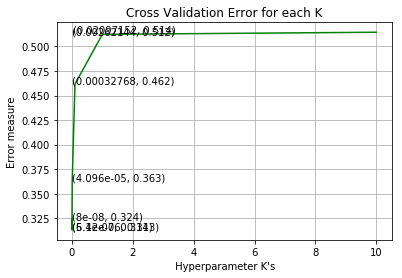

In [0]:
from sklearn.linear_model import SGDClassifier
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.


log_error_array=[]

for i in alpha:
    clf = SGDClassifier(alpha=i,penalty='l2', loss='log', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = SGDClassifier(alpha=alpha[best_k], penalty='l2', loss='log', random_state=42)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', alpha[best_k], "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.001 The log loss is: 0.3132315741231221


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.267173818824774
CV Log-Loss is 0.3132315741231221


Test Log-Loss is 0.5615908790246699


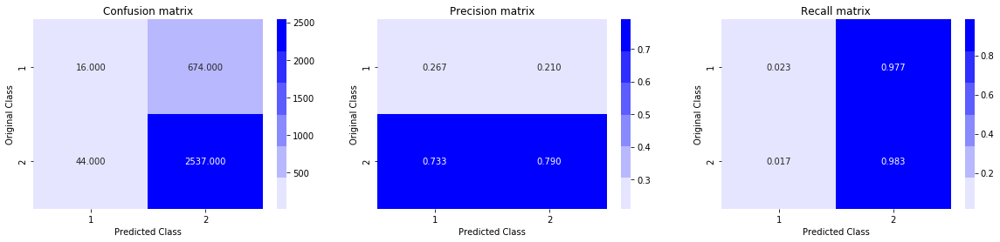

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Logistic Regression  Model</h3>

- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.25
- CV Log-Loss is 0.41
- Test Log-Loss is 0.47
- The Difference between train and cv loss is 0.06 it means there is slight chance of overfitting. 
- We are getting Precison and Recall matrix as campared to KNN

## Linear SVM with hyperparameter tuning

For values of alpha =  1e-05 The log loss is: 0.31781305721236497
For values of alpha =  0.0001 The log loss is: 0.3226693955779419
For values of alpha =  0.001 The log loss is: 0.3115779068787504
For values of alpha =  0.01 The log loss is: 0.3330039709846237
For values of alpha =  0.1 The log loss is: 0.4395080479730546
For values of alpha =  1 The log loss is: 0.5130392305894959
For values of alpha =  10 The log loss is: 0.5145367881353533


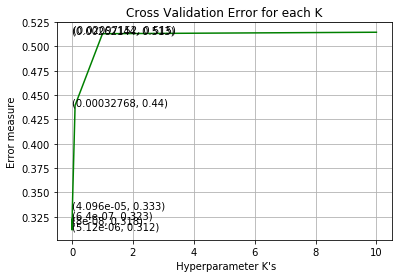

In [0]:
from sklearn.linear_model import SGDClassifier
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.


log_error_array=[]

for i in alpha:
    clf = SGDClassifier(alpha=i,penalty='l2', loss='hinge', random_state=42)
    clf.fit(X_tr, y_train)
    sig_clf = CalibratedClassifierCV(clf , method="sigmoid")
    sig_clf.fit(X_tr,y_train)
    predict_y = sig_clf.predict_proba(X_cr)
    log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    
    
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((K[i],np.round(txt,3)), (K[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each K")
plt.xlabel(" Hyperparameter K's")
plt.ylabel("Error measure")
plt.show()


In [0]:
best_k = np.argmin(log_error_array)
#Training with best hyper parameters
clf = SGDClassifier(alpha=alpha[best_k], penalty='l2', loss='hinge', random_state=42)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print('For values of K = ', alpha[best_k], "The log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

For values of K =  0.001 The log loss is: 0.3115779068787504


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.2649197378190011
CV Log-Loss is 0.3115779068787504


Test Log-Loss is 0.5195530907995929


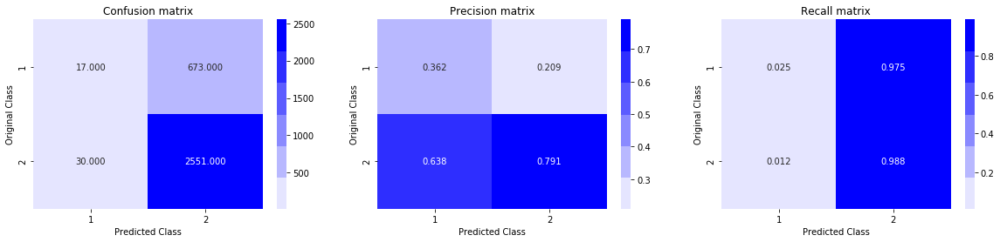

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

## Decision Tree

In [0]:
from sklearn.tree import DecisionTreeClassifier
log_error_array=[]
max_depth = list(range(1,17,3))
min_samples_split_values = list(range(2,34,5))
for depth in (max_depth):
    for min_sample in min_samples_split_values:
        clf=DecisionTreeClassifier(min_samples_split=min_sample,max_depth=depth,class_weight='balanced')
        clf.fit(X_tr, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(X_tr, y_train)
        cv_predict_y = sig_clf.predict_proba(X_cr)
        log_error_array.append(log_loss(y_cv, cv_predict_y, labels=clf.classes_, eps=1e-15))
        print ('log_loss for min_sample_split = ',min_sample,'and maxdepth =',depth,'is',log_loss(y_cv, cv_predict_y, labels=clf
                                                                                                  .classes_, eps=1e-15))



log_loss for min_sample_split =  2 and maxdepth = 1 is 0.4385087089317339
log_loss for min_sample_split =  7 and maxdepth = 1 is 0.4385087089317339
log_loss for min_sample_split =  12 and maxdepth = 1 is 0.4385087089317339
log_loss for min_sample_split =  17 and maxdepth = 1 is 0.4385087089317339
log_loss for min_sample_split =  22 and maxdepth = 1 is 0.4385087089317339
log_loss for min_sample_split =  27 and maxdepth = 1 is 0.4385087089317339
log_loss for min_sample_split =  32 and maxdepth = 1 is 0.4385087089317339
log_loss for min_sample_split =  2 and maxdepth = 4 is 0.3313677643813946
log_loss for min_sample_split =  7 and maxdepth = 4 is 0.33167490459183846
log_loss for min_sample_split =  12 and maxdepth = 4 is 0.33135980988188823
log_loss for min_sample_split =  17 and maxdepth = 4 is 0.3319891169396557
log_loss for min_sample_split =  22 and maxdepth = 4 is 0.3319576241614635
log_loss for min_sample_split =  27 and maxdepth = 4 is 0.3313450828028428
log_loss for min_sample_spl

<h4> Best log loss we are getting at min_samples_split = 12 and  maxdepth = 7 </h4>

In [0]:
clf = DecisionTreeClassifier(min_samples_split=27,max_depth=4,class_weight='balanced')
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print ('log_loss for min_sample_split = ',27,'and maxdepth =',4,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for min_sample_split =  27 and maxdepth = 4 is 0.33159801383354565


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.3091316491021493
CV Log-Loss is 0.33159801383354565


Test Log-Loss is 0.5682675182521673


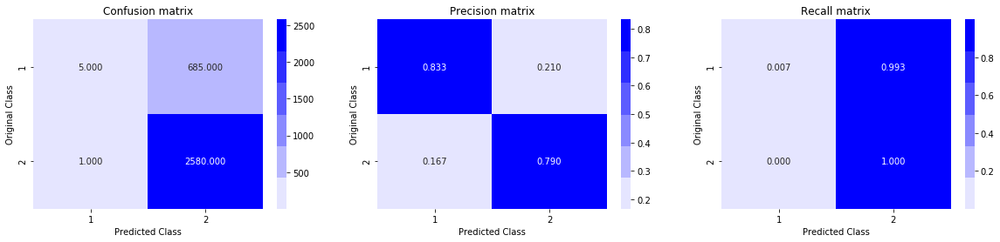

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Desion Tree Model Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.31
- CV Log-Loss is0.34
- Test Log-Loss is  0.066
- performance of Random Forest  is not very good but there is very chance of overfitting as there is very less

## XGBoost Randomised Search

In [0]:
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'max_depth': [2,3,4,5,6,7,8],
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0,3],
    'n_estimators': [5,10,50,100,200,250]}
clf = xgb.XGBClassifier(n_jobs=-1 ,eval_metric = 'logloss' ,early_stopping_rounds = 10, objective = 'binary:logistic', eta = 0.02 )
randomized_search = RandomizedSearchCV(clf, param_grid, n_iter=30,n_jobs=-1, verbose=0, cv=5,scoring='neg_log_loss', refit=False, random_state=42)

In [0]:
randomized_search.fit(X_tr, y_train)

[13:20:30] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:20:30] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:20:30] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. P

RandomizedSearchCV(cv=5, error_score='raise',
          estimator=XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
       colsample_bynode=None, colsample_bytree=None,
       early_stopping_rounds=10, eta=0.02, eval_metric='logloss',
       gamma=None, gpu_id=None, importance_type='gain',
       interaction_constraints=None, learning_..._pos_weight=None, subsample=None, tree_method=None,
       validate_parameters=None, verbosity=None),
          fit_params=None, iid=True, n_iter=30, n_jobs=-1,
          param_distributions={'learning_rate': [0.001, 0.01, 0.1, 0.2, 0, 3], 'max_depth': [2, 3, 4, 5, 6, 7, 8], 'n_estimators': [5, 10, 50, 100, 200, 250]},
          pre_dispatch='2*n_jobs', random_state=42, refit=False,
          return_train_score='warn', scoring='neg_log_loss', verbose=0)

In [0]:
print(randomized_search.best_params_)

{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100}


In [0]:
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.1
params['max_depth'] = 6
params['n_estimators'] = 100

d_train = xgb.DMatrix(X_tr, label=y_train)
d_test = xgb.DMatrix(X_te, label=y_test)

watchlist = [(d_train, 'train'), (d_test, 'valid')]

bst = xgb.train(params, d_train, 400, watchlist, early_stopping_rounds=20, verbose_eval=10)

xgdmat = xgb.DMatrix(X_tr,y_train)
predict_y = bst.predict(d_test)
print("The test log loss is:",log_loss(y_test, predict_y, eps=1e-15))

[13:32:22] WARNING: /workspace/src/learner.cc:480: 
Parameters: { n_estimators } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-logloss:0.62976	valid-logloss:0.64470
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 20 rounds.
[10]	train-logloss:0.31384	valid-logloss:0.52027
[20]	train-logloss:0.20182	valid-logloss:0.58492
Stopping. Best iteration:
[9]	train-logloss:0.33134	valid-logloss:0.51828

The test log loss is: 0.5986109120029306


Total number of data points : 3271


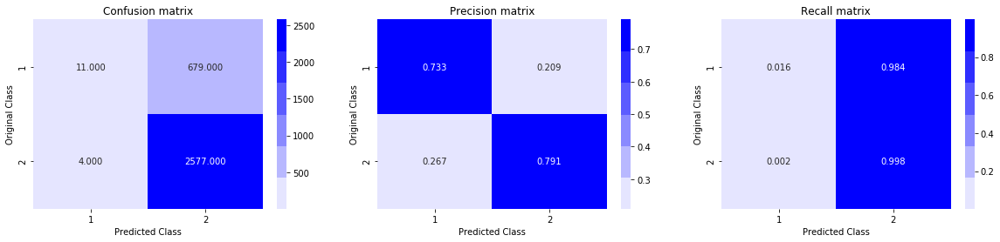

In [0]:
predicted_y =np.array(predict_y>0.5,dtype=int)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from XGboost Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.35
- CV Log-Loss is 0.52
- Test Log-Loss is  0.65
- Log loss of Decision Tree is not very good as logistic regression and SVM.
- There is very large differeen train and CV , so more  chance of overfitting.

## Random Forest with Hyper Paramter Tunning

In [0]:
from sklearn.ensemble import RandomForestClassifier
max_depth = [3, 4, 5, 6]
n_estimator = [100,150,200,250]
for depth in max_depth:
    for estimator in n_estimator:
        clf=RandomForestClassifier(n_estimators=estimator,n_jobs=-1, max_depth=depth)
        clf.fit(X_tr, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(X_tr, y_train)
        predict_y = sig_clf.predict_proba(X_cr)
        print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for n_estimator =  100 and maxdepth = 3 is 0.3125460182654457
log_loss for n_estimator =  150 and maxdepth = 3 is 0.31350582406904276
log_loss for n_estimator =  200 and maxdepth = 3 is 0.30862428977341355
log_loss for n_estimator =  250 and maxdepth = 3 is 0.31124506074830965
log_loss for n_estimator =  100 and maxdepth = 4 is 0.2996214789341002
log_loss for n_estimator =  150 and maxdepth = 4 is 0.29873057148681986
log_loss for n_estimator =  200 and maxdepth = 4 is 0.30173794735692755
log_loss for n_estimator =  250 and maxdepth = 4 is 0.30025750944987567
log_loss for n_estimator =  100 and maxdepth = 5 is 0.2915257279548853
log_loss for n_estimator =  150 and maxdepth = 5 is 0.29015025125922295
log_loss for n_estimator =  200 and maxdepth = 5 is 0.2915932271185668
log_loss for n_estimator =  250 and maxdepth = 5 is 0.29079948599867445
log_loss for n_estimator =  100 and maxdepth = 6 is 0.28556811370916585
log_loss for n_estimator =  150 and maxdepth = 6 is 0.28256699838902

<h4> Best log loss we are getting at n_estimators = 150 and maxdepth = 6 </h4>

In [0]:
clf = RandomForestClassifier(n_estimators=150,n_jobs=-1, max_depth=6)
clf.fit(X_tr, y_train)
#Using Model Calibration
clf_sig = CalibratedClassifierCV(clf, method="sigmoid")
clf_sig.fit(X_tr, y_train)
predict_y = clf_sig.predict_proba(X_cr)
print ('log_loss for n_estimators = ',250,'and maxdepth =',3,'is',log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

log_loss for n_estimators =  250 and maxdepth = 3 is 0.28504358477591035


In [0]:
#Printing Log loss
pred_train = clf_sig.predict_proba(X_tr)
print("Train Log-Loss is",log_loss(y_train, pred_train, labels=clf.classes_, eps=1e-15))
pred_cv = clf_sig.predict_proba(X_cr)
print("CV Log-Loss is",log_loss(y_cv, pred_cv, labels=clf.classes_, eps=1e-15))

Train Log-Loss is 0.22316198723568223
CV Log-Loss is 0.2850435847759104


Test Log-Loss is 0.6351312188629746


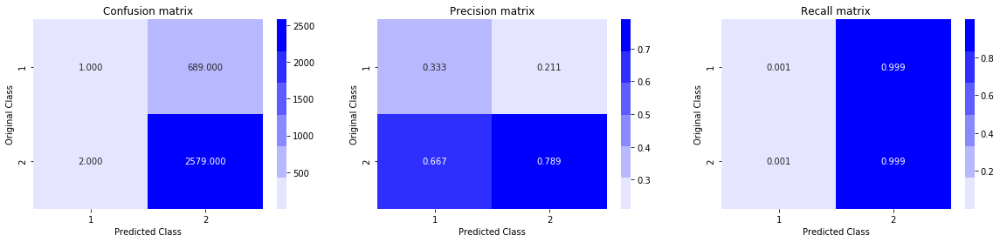

In [0]:
#Printing Test log loss
pred_test = clf_sig.predict_proba(X_te)
print("Test Log-Loss is",log_loss(y_test, pred_test, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h3> Conlusion from  Random Forest Model</h3>


- Here We are Choosing log -loss as performence Metric
- Train Log-Loss is 0.21
- CV Log-Loss is0.29
- Test Log-Loss is  0.64
- Log Loss of Random Forest is good as campared to decison tree.
- There is very less difference in train and cv loss so very less chance of overfitting.

<h2> Pretty Table of IDF Scores and Fastext </h2>

In [0]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectoriser","Model" ,"Hyper Parameter K or Aplha","Train_AUC","Test_AUC"]

x.add_row(["IDF_scores", "KNN","16",0.41,0.44 ])
x.add_row(["IDF_scores", "Naive Bayes","0.16",0.46,0.48 ])
x.add_row(["IDF_scores", "Logistic Regression","0.1",0.50,0.51])
x.add_row(["IDF_scores", "Linear SVM","1",0.50,0.51])
x.add_row(["Fastext", "KNN","41",0.44,0.46 ])
x.add_row(["Fastext", "Logistic Regression","0.1",0.25,0.41])
x.add_row(["Fastext", "Linear SVM","1",0.25,0.41])
print(x)

+------------+---------------------+----------------------------+-----------+----------+
| Vectoriser |        Model        | Hyper Parameter K or Aplha | Train_AUC | Test_AUC |
+------------+---------------------+----------------------------+-----------+----------+
| IDF_scores |         KNN         |             16             |    0.41   |   0.44   |
| IDF_scores |     Naive Bayes     |            0.16            |    0.46   |   0.48   |
| IDF_scores | Logistic Regression |            0.1             |    0.5    |   0.51   |
| IDF_scores |      Linear SVM     |             1              |    0.5    |   0.51   |
|  Fastext   |         KNN         |             41             |    0.44   |   0.46   |
|  Fastext   | Logistic Regression |            0.1             |    0.25   |   0.41   |
|  Fastext   |      Linear SVM     |             1              |    0.25   |   0.41   |
+------------+---------------------+----------------------------+-----------+----------+


In [0]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectoriser","Model" ,"HyperPara-max-Depth","HyperParam-min_sample_split","n-Estomator","Train_AUC","Test_AUC"]
x.add_row(["IDF_scores", "Decison Tree",13,32,"-----",0.28,0.40 ])
x.add_row(["IDF_scores", "XGBoost",6,"-----",100,0.24,0.39 ])
x.add_row(["IDF_scores", "Random Forest",3,"-----",250,0.41,0.43 ])

x.add_row(["TF-IDF", "Decison Tree",7,12,"-----",0.31,0.66 ])
x.add_row(["TF-IDF", "XGBoost",8,"-----",200,0.09,0.2360 ])
x.add_row(["TF-IDF", "Random Forest",6,"-----",150,0.21,0.29 ])

print(x)

+------------+---------------+---------------------+-----------------------------+-------------+-----------+----------+
| Vectoriser |     Model     | HyperPara-max-Depth | HyperParam-min_sample_split | n-Estomator | Train_AUC | Test_AUC |
+------------+---------------+---------------------+-----------------------------+-------------+-----------+----------+
| IDF_scores |  Decison Tree |          13         |              32             |    -----    |    0.28   |   0.4    |
| IDF_scores |    XGBoost    |          6          |            -----            |     100     |    0.24   |   0.39   |
| IDF_scores | Random Forest |          3          |            -----            |     250     |    0.41   |   0.43   |
|   TF-IDF   |  Decison Tree |          7          |              12             |    -----    |    0.31   |   0.66   |
|   TF-IDF   |    XGBoost    |          8          |            -----            |     200     |    0.09   |  0.236   |
|   TF-IDF   | Random Forest |          

<h2> Pretty Table of IDF Scores ,Fastext  Bag of words and Tfiidf</h2>

In [0]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectoriser","Model" ,"Hyper Parameter K or Aplha","Train_AUC","Test_AUC"]
x.add_row(["BOW", "Random","No",0.90,0.90 ])
x.add_row(["BOW", "KNN","81",0.35,0.27 ])
x.add_row(["BOW", "Naive Bayes","0.16",0.35,0.27 ])
x.add_row(["BOW", "Logistic Regression","0.001",0.17,0.26])
x.add_row(["BOW", "Linear SVM","0.001",0.36,0.25])
x.add_row(["TF-IDF", "Random","No",0.90,0.90 ])
x.add_row(["TF-IDF", "KNN","76",0.44,0.45 ])
x.add_row(["TF-IDF", "Naive Bayes","0.16",0.16,0.24 ])
x.add_row(["TF-IDF", "Logistic Regression","0.001",0.16,0.24])
x.add_row(["TF-IDF", "Linear SVM","0.001",0.13,0.24])

x.add_row(["IDF_scores", "KNN","16",0.41,0.44 ])
x.add_row(["IDF_scores", "Naive Bayes","0.16",0.46,0.48 ])
x.add_row(["IDF_scores", "Logistic Regression","0.1",0.50,0.51])
x.add_row(["IDF_scores", "Linear SVM","1",0.50,0.51])
x.add_row(["Fastext", "KNN","41",0.44,0.46 ])
x.add_row(["Fastext", "Logistic Regression","0.1",0.25,0.41])
x.add_row(["Fastext", "Linear SVM","1",0.25,0.41])
print(x)

+------------+---------------------+----------------------------+-----------+----------+
| Vectoriser |        Model        | Hyper Parameter K or Aplha | Train_AUC | Test_AUC |
+------------+---------------------+----------------------------+-----------+----------+
|    BOW     |        Random       |             No             |    0.9    |   0.9    |
|    BOW     |         KNN         |             81             |    0.35   |   0.27   |
|    BOW     |     Naive Bayes     |            0.16            |    0.35   |   0.27   |
|    BOW     | Logistic Regression |           0.001            |    0.17   |   0.26   |
|    BOW     |      Linear SVM     |           0.001            |    0.36   |   0.25   |
|   TF-IDF   |        Random       |             No             |    0.9    |   0.9    |
|   TF-IDF   |         KNN         |             76             |    0.44   |   0.45   |
|   TF-IDF   |     Naive Bayes     |            0.16            |    0.16   |   0.24   |
|   TF-IDF   | Logist

In [0]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectoriser","Model" ,"HyperPara-max-Depth","HyperParam-min_sample_split","n-Estomator","Train_AUC","Test_AUC"]
x.add_row(["IDF_scores", "Decison Tree",13,32,"-----",0.28,0.40 ])
x.add_row(["IDF_scores", "XGBoost",6,"-----",100,0.24,0.39 ])
x.add_row(["IDF_scores", "Random Forest",3,"-----",250,0.41,0.43 ])

x.add_row(["TF-IDF", "Decison Tree",7,12,"-----",0.31,0.66 ])
x.add_row(["TF-IDF", "XGBoost",8,"-----",200,0.09,0.2360 ])
x.add_row(["TF-IDF", "Random Forest",6,"-----",150,0.21,0.29 ])

x.add_row(["BOW", "Decison Tree",13,32,"-----",0.32,0.36 ])
x.add_row(["BOW", "XGBoost",5,"-----",200,0.114,0.2360 ])
x.add_row(["BOW", "Random Forest",3,"-----",250,0.29,0.31 ])

x.add_row(["TF-IDF", "Decison Tree",16,27,"-----",0.30,0.36 ])
x.add_row(["TF-IDF", "XGBoost",8,"-----",200,0.09,0.2360 ])
x.add_row(["TF-IDF", "Random Forest",4,"-----",150,0.29,0.31 ])



print(x)

+------------+---------------+---------------------+-----------------------------+-------------+-----------+----------+
| Vectoriser |     Model     | HyperPara-max-Depth | HyperParam-min_sample_split | n-Estomator | Train_AUC | Test_AUC |
+------------+---------------+---------------------+-----------------------------+-------------+-----------+----------+
| IDF_scores |  Decison Tree |          13         |              32             |    -----    |    0.28   |   0.4    |
| IDF_scores |    XGBoost    |          6          |            -----            |     100     |    0.24   |   0.39   |
| IDF_scores | Random Forest |          3          |            -----            |     250     |    0.41   |   0.43   |
|   TF-IDF   |  Decison Tree |          7          |              12             |    -----    |    0.31   |   0.66   |
|   TF-IDF   |    XGBoost    |          8          |            -----            |     200     |    0.09   |  0.236   |
|   TF-IDF   | Random Forest |          

<h2> Conclusion </h2>


 - Logistic Regression is performed very good with Bag of words and TFIdf
 - IDF Scores and FastText Vector doesnot permormed very well and overfitting as well

<h1> Deep Learning Model <h1>

<h2> Deep Learning Model LSTM </h2>

In [0]:
corpus = []
for sentance in tqdm(X_train['preprocessed_review_comment_message']):
    sentanceList = []
    for word in sentance.split():
        sentanceList.append(word)
    corpus.append(sentanceList)    

100%|██████████| 4448/4448 [00:00<00:00, 183671.65it/s]


In [0]:
dim = 300
model = Word2Vec(corpus , size= dim , window=2 ,min_count=2)

In [0]:
len(model.wv.vocab.keys())

2155

In [0]:
model.wv.vector_size

300

In [0]:
model.wv.similar_by_word('minha')

[('q', 0.999944269657135),
 ('ao', 0.999943733215332),
 ('para', 0.9999428391456604),
 ('pra', 0.999940037727356),
 ('outra', 0.9999374151229858),
 ('vou', 0.9999361634254456),
 ('nem', 0.9999356269836426),
 ('ele', 0.9999349117279053),
 ('porque', 0.9999346137046814),
 ('nao', 0.9999337196350098)]

In [0]:
model.wv.save_word2vec_format('custom_glove_300d.txt')

In [0]:
from keras.preprocessing.text import Tokenizer
t = Tokenizer()
t.fit_on_texts(X_train['preprocessed_review_comment_message'])
vocab_size = len(t.word_index) + 1

In [0]:
from tqdm import tqdm
from numpy import asarray
embeddings_index = dict()
f = open('custom_glove_300d.txt' ,encoding="utf8")
for line in tqdm(f):
	values = line.split()
	word = values[0]
	coefs = asarray(values[1:], dtype='float32')
	embeddings_index[word] = coefs
f.close()

2156it [00:00, 8124.54it/s]


In [0]:
embedding_matrix = np.zeros((vocab_size, 300))
for word, i in tqdm(t.word_index.items()):
	embedding_vector = embeddings_index.get(word)
	if embedding_vector is not None:
		embedding_matrix[i] = embedding_vector

100%|██████████| 4573/4573 [00:00<00:00, 423514.59it/s]


In [0]:
print(embedding_matrix.shape)

(4574, 300)


In [0]:
from keras.layers import Input, Dense
from keras.models import Model
from keras.layers import LSTM,Bidirectional
import keras
from keras.regularizers import l2
from keras.layers import LeakyReLU
from keras.layers.normalization import BatchNormalization
from keras.layers import Reshape,Concatenate

In [0]:
print(final_dataset.shape)
print("=="*62)
project_data_train, project_data_test, result_data_train, result_data_test = train_test_split(final_dataset, y, test_size=0.33)
project_data_train, project_data_cv, result_data_train, result_data_cv = train_test_split(project_data_train, result_data_train, test_size=0.33)
print(project_data_train.shape,project_data_cv.shape,project_data_test.shape)
print(result_data_train.shape,result_data_cv.shape,result_data_test.shape)

(9911, 39)
(4448, 39) (2192, 39) (3271, 39)
(4448,) (2192,) (3271,)


In [0]:
from numpy import array
from numpy import asarray
from numpy import zeros
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding
from keras.layers.core import Dense, Dropout

In [0]:
# prepare tokenizer
t = Tokenizer()
t.fit_on_texts(project_data_train['preprocessed_review_comment_message'])
vocab_size = len(t.word_index) + 1
# integer encode the documents
encoded_docs = t.texts_to_sequences(project_data_train['preprocessed_review_comment_message'])
print(encoded_docs)
# pad documents to a max length of 600 words
max_length = 600
padded_docs_train = pad_sequences(encoded_docs, maxlen=max_length, padding='pre')

# load the whole embedding into memory

[[17], [212, 10, 38, 763, 34, 2130, 8, 25, 291, 44, 17], [67, 133, 280, 213, 397, 1, 458, 8, 29, 60], [88, 1, 2, 3, 1, 980, 1, 694], [4, 370, 411, 223, 13, 857, 168, 1167, 371, 10, 30, 47, 1167, 5, 1490, 24, 1, 2131, 27, 73, 216, 545, 4, 119, 4], [4, 299, 2132, 21, 4, 695, 1, 6, 10, 69, 981, 6, 101, 372, 35, 39, 28, 546, 89, 18], [33, 102], [92, 169], [169], [1, 2, 142, 76, 30, 267, 22, 6, 6, 2133, 3, 1, 19, 25, 12, 5, 9, 28, 1491, 1492, 55, 858], [2, 14, 98, 3, 15, 9], [14, 53, 5, 9, 3, 25, 513, 33, 62], [1, 2, 142, 6, 255, 13, 1, 177, 178], [66, 230, 170, 2134, 514, 127, 43, 2], [412, 18, 123, 6, 696, 1, 764, 50, 3, 459, 1493, 3, 24, 4, 11, 22, 765, 72, 1168, 27, 15, 515, 19, 33, 62, 3, 15, 9, 216, 182, 17, 3, 635, 431], [17, 1, 2, 11, 15, 9, 72, 189, 13, 766, 1, 5, 1494], [8, 16, 2, 3, 14, 12, 5, 9], [41, 2, 3, 11, 29, 49], [107, 3, 42, 26, 12, 5, 9], [2, 14, 15, 9, 587, 54, 31, 256, 767, 3, 982, 1495, 47, 135, 2135, 1496, 42, 7, 1, 61, 22, 230, 697, 7, 1, 236, 339, 4, 547, 2136], [

In [0]:
print(padded_docs_train[1])
print(type(padded_docs_train[1]))
print(len(padded_docs_train[1]))

[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0 

In [0]:
encoded_docs = t.texts_to_sequences(project_data_cv['preprocessed_review_comment_message'])
padded_docs_cv = pad_sequences(encoded_docs, maxlen=max_length, padding='pre')
print(padded_docs_cv[1])
print(type(padded_docs_cv[1]))
print(len(padded_docs_cv[1]))

[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0 

In [0]:
encoded_docs = t.texts_to_sequences(project_data_test['preprocessed_review_comment_message'])
padded_docs_test = pad_sequences(encoded_docs, maxlen=max_length, padding='pre')
print(padded_docs_cv[1])
print(type(padded_docs_cv[1]))
print(len(padded_docs_cv[1]))

[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0 

In [0]:
from tqdm import tqdm
from numpy import asarray
embeddings_index = dict()
f = open('custom_glove_300d.txt' ,encoding="utf8")
for line in tqdm(f):
	values = line.split()
	word = values[0]
	coefs = asarray(values[1:], dtype='float32')
	embeddings_index[word] = coefs
f.close()

2156it [00:00, 9373.54it/s]


In [0]:
embedding_matrix = np.zeros((vocab_size, 300))
for word, i in tqdm(t.word_index.items()):
	embedding_vector = embeddings_index.get(word)
	if embedding_vector is not None:
		embedding_matrix[i] = embedding_vector

100%|██████████| 4593/4593 [00:00<00:00, 552480.38it/s]


In [0]:
print(embedding_matrix.shape)

(4594, 300)


In [0]:
from keras.layers import Input, Dense
from keras.models import Model
from keras.layers import LSTM,Bidirectional
import keras
from keras.regularizers import l2
from keras.layers import LeakyReLU
from keras.layers.normalization import BatchNormalization
from keras.layers import Reshape,Concatenate

In [0]:
preprocessed_review_comment_message_input = Input(shape=(max_length,), name = "preprocessed_review_comment_message")
emb = Embedding(vocab_size, 300, weights=[embedding_matrix], input_length=max_length,trainable=False)(preprocessed_review_comment_message_input)

lstm= LSTM(128,return_sequences=True)(emb)
dropoutlstm = Dropout(0.2)(lstm)
flat= Flatten()(dropoutlstm)

In [0]:
# Make Data Model ready- Encoding Customer city

vectorizer = CountVectorizer()
vectorizer.fit(X_train['customer_city'].values) # fit has to happen only on train data
print(vectorizer.get_feature_names()[:20])
Customer_City =  vectorizer.get_feature_names()
print("=="*62)
print(len(Customer_City))
Customer_City_input = Input(shape =(len(Customer_City),), name='customer_city',)
customer_city_emb = Embedding(len(Customer_City), 2, input_length=len(Customer_City))(Customer_City_input)
customer_city_flat = Flatten()(customer_city_emb) 

['abaete', 'abaixo', 'abrantes', 'abreu', 'acailandia', 'acarau', 'adamantina', 'adustina', 'afonso', 'afranio', 'agostinho', 'agua', 'aguas', 'agudos', 'aimores', 'ajuda', 'ajuricaba', 'alagoinhas', 'aldeia', 'alegre']
1066


In [0]:
# Make Data Model ready- Encoding customer_state

vectorizer = CountVectorizer()
vectorizer.fit(X_train['customer_state'].values) # fit has to happen only on train data
print(vectorizer.get_feature_names()[:20])
Customer_State =  vectorizer.get_feature_names()
print("=="*62)
print(len(Customer_State))
Customer_State_input = Input(shape =(len(Customer_State),), name='customer_state',)
customer_state_emb = Embedding(len(Customer_State), 2, input_length=len(Customer_State))(Customer_State_input)
customer_state_flat = Flatten()(customer_state_emb) 

['ac', 'al', 'am', 'ap', 'ba', 'ce', 'df', 'es', 'go', 'ma', 'mg', 'ms', 'mt', 'pa', 'pb', 'pe', 'pi', 'pr', 'rj', 'rn']
27


In [0]:
# Make Data Model ready- Encoding payment_type

vectorizer = CountVectorizer()
vectorizer.fit(X_train['payment_type'].values) # fit has to happen only on train data
print(vectorizer.get_feature_names()[:20])
payment_type =  vectorizer.get_feature_names()
print("=="*62)
print(len(payment_type))
payment_type_input = Input(shape =(len(payment_type),), name='payment_type',)
payment_type_emb = Embedding(len(payment_type), 2, input_length=len(payment_type))(payment_type_input)
payment_type_flat = Flatten()(payment_type_emb) 

['boleto', 'credit_card', 'debit_card', 'voucher']
4


In [0]:
# Make Data Model ready- Encoding payment_installments

vectorizer = CountVectorizer()
vectorizer.fit(X_train['seller_city'].values) # fit has to happen only on train data
print(vectorizer.get_feature_names()[:20])
seller_city =  vectorizer.get_feature_names()
print("=="*62)
print(len(seller_city))
seller_city_input = Input(shape =(len(seller_city),), name='seller_city',)
seller_city_emb = Embedding(len(payment_type), 2, input_length=len(seller_city))(seller_city_input)
seller_city_flat = Flatten()(seller_city_emb) 

['aldeia', 'alegre', 'alfenas', 'americana', 'amparo', 'anapolis', 'andira', 'andre', 'angelo', 'antonio', 'aparecida', 'apucarana', 'aracatuba', 'araguari', 'arapongas', 'araraquara', 'araras', 'arvorezinha', 'assis', 'atibaia']
348


In [0]:
# Make Data Model ready- Encoding payment_installments

vectorizer = CountVectorizer()
vectorizer.fit(X_train['seller_state'].values) # fit has to happen only on train data
print(vectorizer.get_feature_names()[:20])
seller_state =  vectorizer.get_feature_names()
print("=="*62)
print(len(seller_state))
seller_state_input = Input(shape =(len(seller_state),), name='seller_state',)
seller_state_emb = Embedding(len(payment_type), 2, input_length=len(seller_state))(seller_state_input)
seller_state_flat = Flatten()(seller_state_emb) 

['ba', 'ce', 'df', 'es', 'go', 'ma', 'mg', 'mt', 'pb', 'pe', 'pr', 'rj', 'rs', 'sc', 'sp']
15


In [0]:
# Make Data Model ready- Encoding payment_installments

vectorizer = CountVectorizer()
vectorizer.fit(X_train['product_category_name_english'].values) # fit has to happen only on train data
print(vectorizer.get_feature_names()[:20])
product_category_name_english =  vectorizer.get_feature_names()
print("=="*62)
print(len(product_category_name_english))
product_category_name_english_input = Input(shape =(len(product_category_name_english),), name='product_category_name_english',)
product_category_name_english_emb = Embedding(len(payment_type), 2, input_length=len(product_category_name_english))(product_category_name_english_input)
product_category_name_english_flat = Flatten()(product_category_name_english_emb) 

['agro_industry_and_commerce', 'air_conditioning', 'art', 'arts_and_craftmanship', 'audio', 'auto', 'baby', 'bed_bath_table', 'books_general_interest', 'books_imported', 'books_technical', 'christmas_supplies', 'cine_photo', 'computers', 'computers_accessories', 'consoles_games', 'construction_tools_construction', 'construction_tools_lights', 'construction_tools_safety', 'cool_stuff']
62


In [0]:
num_field_train = np.concatenate((project_data_train['payment_sequential'].values.reshape(-1,1),project_data_train['payment_installments'].values.reshape(-1,1),project_data_train['product_photos_qty'].values.reshape(-1,1),project_data_train['no_words_in_product_cat_name_english'].values.reshape(-1,1),project_data_train['customer_zip_code_prefix'].values.reshape(-1,1),project_data_train['price'].values.reshape(-1,1),project_data_train['freight_value'].values.reshape(-1,1),project_data_train['payment_value'].values.reshape(-1,1),project_data_train['seller_zip_code_prefix'].values.reshape(-1,1)), axis=1)
num_field_cv = np.concatenate((project_data_cv['payment_sequential'].values.reshape(-1,1),project_data_cv['payment_installments'].values.reshape(-1,1),project_data_cv['product_photos_qty'].values.reshape(-1,1),project_data_cv['no_words_in_product_cat_name_english'].values.reshape(-1,1),project_data_cv['customer_zip_code_prefix'].values.reshape(-1,1),project_data_cv['price'].values.reshape(-1,1),project_data_cv['freight_value'].values.reshape(-1,1),project_data_cv['payment_value'].values.reshape(-1,1),project_data_cv['seller_zip_code_prefix'].values.reshape(-1,1)), axis=1)
num_field_test = np.concatenate((project_data_test['payment_sequential'].values.reshape(-1,1),project_data_test['payment_installments'].values.reshape(-1,1),project_data_test['product_photos_qty'].values.reshape(-1,1),project_data_test['no_words_in_product_cat_name_english'].values.reshape(-1,1),project_data_test['customer_zip_code_prefix'].values.reshape(-1,1),project_data_test['price'].values.reshape(-1,1),project_data_test['freight_value'].values.reshape(-1,1),project_data_test['payment_value'].values.reshape(-1,1),project_data_test['seller_zip_code_prefix'].values.reshape(-1,1)), axis=1)


In [0]:
print(num_field_test.shape)
print(num_field_train.shape)
print(num_field_cv.shape)

(3271, 9)
(4448, 9)
(2192, 9)


In [0]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
num_field_train_scalar = scalar.fit_transform(num_field_train)
num_field_cv_scalar = scalar.transform(num_field_cv)
num_field_test_scalar = scalar.transform(num_field_test)

In [0]:
num_field_input =  Input(shape=(9,), name="num_field_layer")
num_field_dense = Dense(64, activation='relu',kernel_initializer='he_normal',kernel_regularizer=l2(0.001))(num_field_input)
num_field_dense = Dropout(0.6)(num_field_dense)

In [0]:
from keras.utils import to_categorical
result_data_cat_train = to_categorical(result_data_train)
result_data_cat_cv = to_categorical(result_data_cv)
result_data_cat_test = to_categorical(result_data_test)

In [0]:
result_data_test.shape

(3271,)

In [0]:
concat_layers = []
concat_layers.append(flat)
concat_layers.append(customer_city_flat)
concat_layers.append(customer_state_flat)
concat_layers.append(payment_type_flat)
concat_layers.append(seller_city_flat)
concat_layers.append(seller_state_flat)
concat_layers.append(product_category_name_english_flat)
concat_layers.append(num_field_dense)

In [0]:
concat_layers = Concatenate()(concat_layers)

In [0]:
concat_layers= Dense(128,activation='relu',kernel_initializer='he_normal',kernel_regularizer=l2(0.001))(concat_layers)
concat_layers= Dropout(0.2)(concat_layers)

concat_layers= Dense(64,activation='relu',kernel_initializer='he_normal',kernel_regularizer=l2(0.001))(concat_layers)

output=Dense(2, activation='softmax')(concat_layers)
model_1 = Model(inputs=[preprocessed_review_comment_message_input,Customer_City_input,Customer_State_input,payment_type_input,seller_city_input,seller_state_input,product_category_name_english_input,num_field_input], outputs=output)

In [0]:
model_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
preprocessed_review_comment_mes (None, 600)          0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 600, 300)     1402800     preprocessed_review_comment_messa
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 600, 128)     219648      embedding_1[0][0]                
__________________________________________________________________________________________________
customer_city (InputLayer)      (None, 1050)         0                                            
____________________________________________________________________________________________

In [0]:
model_1.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [0]:
import tensorflow as tf
import datetime

In [0]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
filepath="/content/drive/My Drive/checkingCheckpoint/model_1-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, mode='max')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=200)

In [0]:
log_dir = "log/fit1/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [0]:
callbacks_list = [checkpoint,tensorboard_callback]

In [0]:
history_1 = model_1.fit([padded_docs_train,X_train_customer_city,X_train_customer_state,X_train_payment_type,X_train_seller_city,X_train_seller_state,X_train_product_category_name_english,num_field_train_scalar],result_data_cat_train,epochs=30,batch_size=400,verbose=1, validation_data=([padded_docs_cv,X_cv_customer_city,X_cv_customer_state,X_cv_payment_type,X_cv_seller_city,X_cv_seller_state,X_cv_product_category_name_english,num_field_cv_scalar],result_data_cat_cv),callbacks=callbacks_list)

Train on 4448 samples, validate on 2192 samples
Epoch 1/30
4448/4448 [==============================] - 17s 4ms/step - loss: 0.7205 - accuracy: 0.7920 - val_loss: 0.6853 - val_accuracy: 0.8025

Epoch 00001: saving model to /content/drive/My Drive/checkingCheckpoint/model_1-01-0.80.hdf5
Epoch 2/30
4448/4448 [==============================] - 14s 3ms/step - loss: 0.6870 - accuracy: 0.7929 - val_loss: 0.6537 - val_accuracy: 0.8002

Epoch 00002: saving model to /content/drive/My Drive/checkingCheckpoint/model_1-02-0.80.hdf5
Epoch 3/30
4448/4448 [==============================] - 14s 3ms/step - loss: 0.6572 - accuracy: 0.8006 - val_loss: 0.7057 - val_accuracy: 0.7391

Epoch 00003: saving model to /content/drive/My Drive/checkingCheckpoint/model_1-03-0.74.hdf5
Epoch 4/30
4448/4448 [==============================] - 14s 3ms/step - loss: 0.6540 - accuracy: 0.7866 - val_loss: 0.6004 - val_accuracy: 0.8125

Epoch 00004: saving model to /content/drive/My Drive/checkingCheckpoint/model_1-04-0.81.h

In [0]:
%tensorboard --logdir log/fit1

Output hidden; open in https://colab.research.google.com to view.

In [0]:
# https://stackoverflow.com/posts/54978213/revisions

from keras.models import load_model
best_model_1 = load_model('/content/drive/My Drive/checkingCheckpoint/model_1-30-0.83.hdf5')

In [0]:
result = best_model_1.evaluate([padded_docs_test,X_test_customer_city,X_test_customer_state,X_test_payment_type,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,num_field_test_scalar],result_data_cat_test,batch_size=400)

3271/3271 [==============================] - 1s 359us/step


In [0]:
print("Test Loss is",result[0])
print("Test auroc is",result[1])

Test Loss is 0.4032663774760044
Test auroc is 0.8254356384277344


In [0]:
def plot_confusion_matrix(test_y,predict_y):
  C = confusion_matrix(test_y, predict_y)
  A =(((C.T)/(C.sum(axis=1))).T)
  B =(C/C.sum(axis=0))
  
  labels = ['0' ,'1']
  # representing A in heatmap format
  print("-"*20, "Confusion matrix", "-"*20)
  plt.figure(figsize=(4,3))
  sns.heatmap(C, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.show()

  print("-"*20, "Precision matrix (Columm Sum=1)", "-"*20)
  plt.figure(figsize=(4,3))
  sns.heatmap(B, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.show()
  
  # representing B in heatmap format
  print("-"*20, "Recall matrix (Row sum=1)", "-"*20)
  plt.figure(figsize=(4,3))
  sns.heatmap(A, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.show()

-------------------- Confusion matrix --------------------


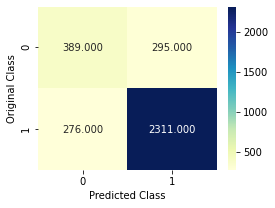

-------------------- Precision matrix (Columm Sum=1) --------------------


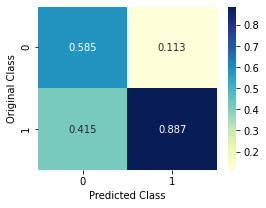

-------------------- Recall matrix (Row sum=1) --------------------


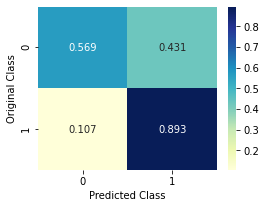

In [0]:
pred_test = best_model_1.predict([padded_docs_test,X_test_customer_city,X_test_customer_state,X_test_payment_type,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,num_field_test_scalar])
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(result_data_test, predicted_y)

<h2>Conclusion Deep Learning Model LSTM </h2>

 -  Train loss 0.41
 -  CV loss 0.41
 -  Test Loss is 0.40
 -  Test accuracy is 82.68%
 -  LSTM is Performing really good as campared to the Machine Learning model 

<h2> Deep Learning Model Convolution Neural Network(CNN) </h2>

In [0]:
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
preprocessed_review_comment_message_input_CNN = Input(shape=(max_length,), name = "preprocessed_review_comment_message")
embedding1 = Embedding(vocab_size, 300, weights=[embedding_matrix], input_length=max_length,trainable=False)(preprocessed_review_comment_message_input_CNN)
conv1 = Conv1D(filters=32, kernel_size=4, activation='relu')(embedding1)
pool1 = MaxPooling1D(pool_size=2)(conv1)
dropoutcnv = Dropout(0.2)(pool1)
flat_1= Flatten()(dropoutcnv)

In [0]:
concat_layers = []
concat_layers.append(flat_1)
concat_layers.append(customer_city_flat)
concat_layers.append(customer_state_flat)
concat_layers.append(payment_type_flat)
concat_layers.append(seller_city_flat)
concat_layers.append(seller_state_flat)
concat_layers.append(product_category_name_english_flat)
concat_layers.append(num_field_dense)

In [0]:
concat_layers = Concatenate()(concat_layers)

In [0]:
concat_layers= Dense(128,activation='relu',kernel_initializer='he_normal',kernel_regularizer=l2(0.001))(concat_layers)
concat_layers= Dropout(0.2)(concat_layers)

concat_layers= Dense(64,activation='relu',kernel_initializer='he_normal',kernel_regularizer=l2(0.001))(concat_layers)

output=Dense(2, activation='softmax')(concat_layers)
model_2 = Model(inputs=[preprocessed_review_comment_message_input_CNN,Customer_City_input,Customer_State_input,payment_type_input,seller_city_input,seller_state_input,product_category_name_english_input,num_field_input], outputs=output)

In [0]:
model_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
preprocessed_review_comment_mes (None, 600)          0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 600, 300)     1402800     preprocessed_review_comment_messa
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 597, 32)      38432       embedding_8[0][0]                
__________________________________________________________________________________________________
max_pooling1d_1 (MaxPooling1D)  (None, 298, 32)      0           conv1d_1[0][0]                   
____________________________________________________________________________________________

In [0]:
model_2.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
filepath="/content/drive/My Drive/checkingCheckpoint2/model_2-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, mode='max')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=200)

In [0]:
log_dir = "log/fit2/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [0]:
callbacks_list = [checkpoint,tensorboard_callback]

In [0]:
history_2 = model_2.fit([padded_docs_train,X_train_customer_city,X_train_customer_state,X_train_payment_type,X_train_seller_city,X_train_seller_state,X_train_product_category_name_english,num_field_train_scalar],result_data_cat_train,epochs=50,batch_size=400,verbose=1, validation_data=([padded_docs_cv,X_cv_customer_city,X_cv_customer_state,X_cv_payment_type,X_cv_seller_city,X_cv_seller_state,X_cv_product_category_name_english,num_field_cv_scalar],result_data_cat_cv),callbacks=callbacks_list)

Train on 4448 samples, validate on 2192 samples
Epoch 1/50
4448/4448 [==============================] - 7s 1ms/step - loss: 0.8530 - accuracy: 0.7549 - val_loss: 0.7079 - val_accuracy: 0.7682

Epoch 00001: saving model to /content/drive/My Drive/checkingCheckpoint2/model_2-01-0.77.hdf5
Epoch 2/50
4448/4448 [==============================] - 0s 104us/step - loss: 0.6738 - accuracy: 0.7830 - val_loss: 0.6231 - val_accuracy: 0.8016

Epoch 00002: saving model to /content/drive/My Drive/checkingCheckpoint2/model_2-02-0.80.hdf5
Epoch 3/50
4448/4448 [==============================] - 0s 104us/step - loss: 0.6293 - accuracy: 0.7909 - val_loss: 0.5999 - val_accuracy: 0.7997

Epoch 00003: saving model to /content/drive/My Drive/checkingCheckpoint2/model_2-03-0.80.hdf5
Epoch 4/50
4448/4448 [==============================] - 0s 100us/step - loss: 0.6038 - accuracy: 0.7929 - val_loss: 0.5775 - val_accuracy: 0.8038

Epoch 00004: saving model to /content/drive/My Drive/checkingCheckpoint2/model_2-04-

In [0]:
%tensorboard --logdir log/fit2

Output hidden; open in https://colab.research.google.com to view.

In [0]:
#https://stackoverflow.com/posts/54978213/revisions
# custom_objects = {"auroc":auroc}

from keras.models import load_model
best_model_2 = load_model('/content/drive/My Drive/checkingCheckpoint2/model_2-25-0.81.hdf5')

In [0]:
result = best_model_2.evaluate([padded_docs_test,X_test_customer_city,X_test_customer_state,X_test_payment_type,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,num_field_test_scalar],result_data_cat_test,batch_size=400)

3271/3271 [==============================] - 0s 92us/step


In [0]:
print("Test Loss is",result[0])
print("Test auroc is",result[1])

Test Loss is 0.42767984963308886
Test auroc is 0.8092326521873474


-------------------- Confusion matrix --------------------


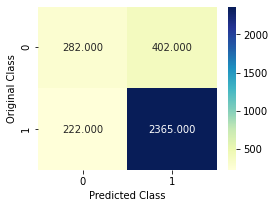

-------------------- Precision matrix (Columm Sum=1) --------------------


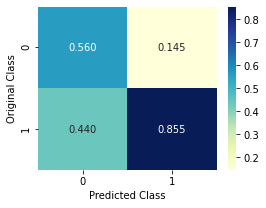

-------------------- Recall matrix (Row sum=1) --------------------


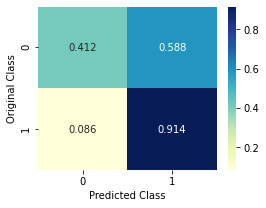

In [0]:
pred_test = best_model_2.predict([padded_docs_test,X_test_customer_city,X_test_customer_state,X_test_payment_type,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,num_field_test_scalar])
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(result_data_test, predicted_y)

<h2> Conclusion Deep Learning Model Convolution Neural Network(CNN) </h2>

 -  Train loss 0.39
 -  CV loss 0.41
 -  Test Loss is 0.42
 -  Test accuracy is 80.55%
 -  CNN is Performing really good as campared to the Machine Learning model 

<h2> Mixed LSTM and CNN </h2>

In [0]:
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
preprocessed_review_comment_message_input_CNN_LSTM = Input(shape=(max_length,), name = "preprocessed_review_comment_message_cnn")
emb_cnn_LSTM = Embedding(vocab_size, 300, weights = [embedding_matrix], input_length=max_length,trainable=False)(preprocessed_review_comment_message_input_CNN_LSTM)
conv1 = Conv1D(filters=32, kernel_size=4, activation='relu')(emb_cnn_LSTM)
lstm_CNN= LSTM(128,return_sequences=True)(conv1)
dropout_CNN_LSTM = Dropout(0.2)(lstm_CNN)
flat_CNN_LSTM = Flatten()(dropout_CNN_LSTM)

In [0]:
concat_layers = []
concat_layers.append(flat_CNN_LSTM)
concat_layers.append(customer_city_flat)
concat_layers.append(customer_state_flat)
concat_layers.append(payment_type_flat)
concat_layers.append(seller_city_flat)
concat_layers.append(seller_state_flat)
concat_layers.append(product_category_name_english_flat)
concat_layers.append(num_field_dense)

In [0]:
concat_layers = Concatenate()(concat_layers)

In [0]:
concat_layers= Dense(128,activation='relu',kernel_initializer='he_normal',kernel_regularizer=l2(0.001))(concat_layers)
concat_layers= Dropout(0.2)(concat_layers)

concat_layers= Dense(64,activation='relu',kernel_initializer='he_normal',kernel_regularizer=l2(0.001))(concat_layers)

output=Dense(2, activation='softmax')(concat_layers)
model_3 = Model(inputs=[preprocessed_review_comment_message_input_CNN_LSTM,Customer_City_input,Customer_State_input,payment_type_input,seller_city_input,seller_state_input,product_category_name_english_input,num_field_input], outputs=output)

In [0]:
model_3.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
preprocessed_review_comment_mes (None, 600)          0                                            
__________________________________________________________________________________________________
embedding_18 (Embedding)        (None, 600, 300)     1378200     preprocessed_review_comment_messa
__________________________________________________________________________________________________
conv1d_3 (Conv1D)               (None, 597, 32)      38432       embedding_18[0][0]               
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 597, 128)     82432       conv1d_3[0][0]                   
____________________________________________________________________________________________

In [0]:
model_3.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])

In [0]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
filepath="/content/drive/My Drive/checkingCheckpoint4/model_3-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, mode='max')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=200)

In [0]:
log_dir = "log/fit3/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [0]:
callbacks_list = [checkpoint,tensorboard_callback]

In [445]:
history_3 = model_3.fit([padded_docs_train,X_train_customer_city,X_train_customer_state,X_train_payment_type,X_train_seller_city,X_train_seller_state,X_train_product_category_name_english,num_field_train_scalar],result_data_cat_train,epochs=60,batch_size=400,verbose=1, validation_data=([padded_docs_cv,X_cv_customer_city,X_cv_customer_state,X_cv_payment_type,X_cv_seller_city,X_cv_seller_state,X_cv_product_category_name_english,num_field_cv_scalar],result_data_cat_cv),callbacks=callbacks_list)

Train on 4448 samples, validate on 2192 samples
Epoch 1/60
4448/4448 [==============================] - 35s 8ms/step - loss: 1.2223 - accuracy: 0.7651 - val_loss: 1.0799 - val_accuracy: 0.7933

Epoch 00001: saving model to /content/drive/My Drive/checkingCheckpoint4/model_3-01-0.79.hdf5
Epoch 2/60
4448/4448 [==============================] - 29s 7ms/step - loss: 1.0670 - accuracy: 0.7880 - val_loss: 1.0209 - val_accuracy: 0.7870

Epoch 00002: saving model to /content/drive/My Drive/checkingCheckpoint4/model_3-02-0.79.hdf5
Epoch 3/60
4448/4448 [==============================] - 29s 7ms/step - loss: 1.0088 - accuracy: 0.7864 - val_loss: 0.9613 - val_accuracy: 0.7956

Epoch 00003: saving model to /content/drive/My Drive/checkingCheckpoint4/model_3-03-0.80.hdf5
Epoch 4/60
4448/4448 [==============================] - 29s 7ms/step - loss: 0.9473 - accuracy: 0.7887 - val_loss: 0.9077 - val_accuracy: 0.7997

Epoch 00004: saving model to /content/drive/My Drive/checkingCheckpoint4/model_3-04-0.

In [446]:
%tensorboard --logdir log/fit3

Output hidden; open in https://colab.research.google.com to view.

In [0]:
from keras.models import load_model
best_model_3 = load_model('/content/drive/My Drive/checkingCheckpoint4/model_3-45-0.83.hdf5')

In [448]:
result = best_model_3.evaluate([padded_docs_test,X_test_customer_city,X_test_customer_state,X_test_payment_type,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,num_field_test_scalar],result_data_cat_test,batch_size=400)

3271/3271 [==============================] - 2s 724us/step


In [449]:
print("Test Loss is",result[0])
print("Test accuracy is",result[1])

Test Loss is 0.40643796336574317
Test accuracy is 0.8339956998825073


-------------------- Confusion matrix --------------------


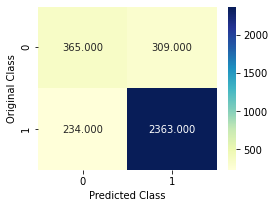

-------------------- Precision matrix (Columm Sum=1) --------------------


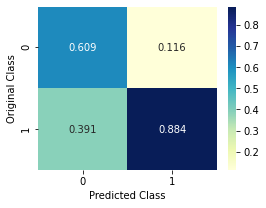

-------------------- Recall matrix (Row sum=1) --------------------


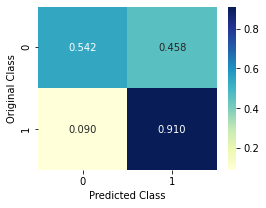

In [453]:
pred_test = best_model_3.predict([padded_docs_test,X_test_customer_city,X_test_customer_state,X_test_payment_type,X_test_seller_city,X_test_seller_state,X_test_product_category_name_english,num_field_test_scalar])
predicted_y =np.argmax(pred_test,axis=1)
plot_confusion_matrix(result_data_test, predicted_y)

<h2> Conclusion Mixed LSTM and CNN  </h2>

 -  Train loss 0.4220
 -  CV loss 0.4269
 -  Test Loss is 0.40
 -  Test accuracy is 83.78%
 -  CNN and LSTM is Performing really good as campared to the Machine Learning model 

In [454]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Deep Learning Model","Train Loss" ,"CV Loss ","Test"]

x.add_row(["LSTM", 0.41,0.41,0.40])
x.add_row(["CNN", 0.39,0.41,0.42])
x.add_row(["LSTM and CNN", 0.422,0.4269,0.40])

print(x)

+---------------------+------------+----------+------+
| Deep Learning Model | Train Loss | CV Loss  | Test |
+---------------------+------------+----------+------+
|         LSTM        |    0.41    |   0.41   | 0.4  |
|         CNN         |    0.39    |   0.41   | 0.42 |
|     LSTM and CNN    |   0.422    |  0.4269  | 0.4  |
+---------------------+------------+----------+------+
